# Eksploratorna Analiza Podataka (EDA) - NFL Performance Prediction

## Cilj analize
Ciljna varijabla za svaku poziciju:
- **QB (Quarterback):** Passing Yards (`Yds`)
- **RB (Running Back):** Rushing Yards (`Rush_Yds`)
- **WR (Wide Receiver):** Receiving Yards (`receiving_yards`)
- **TE (Tight End):** Receiving Yards (`Rec_Yds`)

## Skupovi podataka
| Pozicija | Fajl | Redova | Kolona | Sezone |
|----------|------|--------|--------|--------|
| QB | `qb_master.csv` | 845 | 186 | 1979–2025 |
| RB | `rb_master.csv` | 622 | 113 | 1988–2025 |
| WR | `wr_all_seasons.csv` | 5529 | 99 | 2015–2025 |
| TE | `te_master.csv` | 194 | 60 | 2013–2025 |

## Sadržaj
1. Učitavanje i pregled podataka
2. Deskriptivna statistika
3. Analiza nedostajućih vrednosti
4. Distribucija ciljnih varijabli (Yards)
5. Korelaciona analiza
6. Trendovi kroz sezone
7. Top igrači po yardima
8. Analiza po timovima
9. Odnos starost–yardi (Aging Curve)
10. Scatter plotovi – Ključni odnosi
11. Pairplot analiza
12. Efikasnost igrača (Y/G, Y/A)
13. Analiza po kvartalima i Win Probability (WR)
14. Outlier analiza
15. **Yards per Game – Detaljnija analiza** ⭐
16. **Povrede i Per-Game prosek – Alternativa uklanjanju outlier-a** ⭐
17. Odnos TD – Yards
18. Games Started vs Yards
19. Advanced metriki (QB)
20. RB Dual Threat analiza
21. WR Kontekstualna analiza
22. WR Defanzivni uticaj
23. Snap Percentage analiza
24. Poređenje modela – Rezultati
25. Feature grupiranje
26. Statistički testovi normalnosti
27. Zaključci EDA

> Svaka sekcija sadrži vizuelizacije praćene **tekstualnim objašnjenjima i zaključcima** za lakše razumevanje.

In [64]:
# ============================================================
# 1. Ucitavanje biblioteka i podataka
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Stil grafika
sns.set_theme(style='whitegrid', palette='deep', font_scale=1.1)
plt.rcParams['figure.figsize'] = (14, 6)
plt.rcParams['figure.dpi'] = 100

# Ucitavanje podataka
DATA_DIR = '../data/fully combined/'

qb = pd.read_csv(DATA_DIR + 'qb_master.csv')
rb = pd.read_csv(DATA_DIR + 'rb_master.csv')
wr = pd.read_csv(DATA_DIR + 'wr_all_seasons.csv')
te = pd.read_csv(DATA_DIR + 'te_master.csv')

print(f'QB:  {qb.shape[0]:>5} redova, {qb.shape[1]:>3} kolona  |  Sezone: {qb["Season"].min()}–{qb["Season"].max()}')
print(f'RB:  {rb.shape[0]:>5} redova, {rb.shape[1]:>3} kolona  |  Sezone: {rb["Season"].min()}–{rb["Season"].max()}')
print(f'WR:  {wr.shape[0]:>5} redova, {wr.shape[1]:>3} kolona  |  Sezone: {wr["season"].min()}–{wr["season"].max()}')
print(f'TE:  {te.shape[0]:>5} redova, {te.shape[1]:>3} kolona  |  Sezone: {te["Season"].min()}–{te["Season"].max()}')

QB:    845 redova, 186 kolona  |  Sezone: 1979–2025
RB:    622 redova, 113 kolona  |  Sezone: 1988–2025
WR:   5529 redova,  99 kolona  |  Sezone: 2015–2025
TE:    194 redova,  60 kolona  |  Sezone: 2013–2025


## 1.1 Pregled prvih redova za svaki dataset

In [65]:
print('='*80)
print('QB - Prvih 5 redova (odabrane kolone)')
print('='*80)
qb_preview_cols = ['Player', 'Season', 'Age', 'Team', 'G', 'GS', 'Cmp', 'Att', 'Cmp%', 'Yds', 'TD', 'Int', 'Rate', 'Y/A', 'Y/G']
display(qb[qb_preview_cols].head())

print('\n' + '='*80)
print('RB - Prvih 5 redova (odabrane kolone)')
print('='*80)
rb_preview_cols = ['Player', 'Season', 'Age', 'Team', 'G', 'GS', 'Rush_Att', 'Rush_Yds', 'Rush_TD', 'Rush_Y/A', 'Rush_Y/G', 'Rec', 'Rec_Yds']
display(rb[rb_preview_cols].head())

print('\n' + '='*80)
print('WR - Prvih 5 redova (odabrane kolone)')
print('='*80)
wr_preview_cols = ['receiver_player_name', 'season', 'posteam', 'games_played', 'targets', 'receptions', 'receiving_yards', 'air_yards', 'yac', 'tds', 'catch_rate']
display(wr[wr_preview_cols].head())

print('\n' + '='*80)
print('TE - Prvih 5 redova (odabrane kolone)')
print('='*80)
te_preview_cols = ['Player', 'Season', 'Age', 'Team', 'G', 'GS', 'Tgt', 'Rec', 'Rec_Yds', 'Rec_TD', 'Rec_Y/R', 'Rec_Y/G']
display(te[te_preview_cols].head())

QB - Prvih 5 redova (odabrane kolone)


,Player,Season,Age,Team,G,GS,Cmp,Att,Cmp%,Yds,TD,Int,Rate,Y/A,Y/G
0,Aaron Rodgers,2005,22,GNB,3,0,9,16,56.3,65,0,1,39.8,4.1,21.7
1,Aaron Rodgers,2006,23,GNB,2,0,6,15,40.0,46,0,0,48.2,3.1,23.0
2,Aaron Rodgers,2007,24,GNB,2,0,20,28,71.4,218,1,0,106.0,7.8,109.0
3,Aaron Rodgers,2008,25,GNB,16,16,341,536,63.6,4038,28,13,93.8,7.5,252.4
4,Aaron Rodgers,2009,26,GNB,16,16,350,541,64.7,4434,30,7,103.2,8.2,277.1



RB - Prvih 5 redova (odabrane kolone)


,Player,Season,Age,Team,G,GS,Rush_Att,Rush_Yds,Rush_TD,Rush_Y/A,Rush_Y/G,Rec,Rec_Yds
0,Aaron Jones,2017,23,GNB,12,4,81,448,4,5.5,37.3,9,22
1,Aaron Jones,2018,24,GNB,12,8,133,728,8,5.5,60.7,26,206
2,Aaron Jones,2019,25,GNB,16,16,236,1084,16,4.6,67.8,49,474
3,Aaron Jones,2020,26,GNB,14,14,201,1104,9,5.5,78.9,47,355
4,Aaron Jones,2021,27,GNB,15,15,171,799,4,4.7,53.3,52,391



WR - Prvih 5 redova (odabrane kolone)


,receiver_player_name,season,posteam,games_played,targets,receptions,receiving_yards,air_yards,yac,tds,catch_rate
0,T.Brady,2015,22,1,1.0,1.0,36.0,7.0,29.0,0.0,1.000000
1,T.Brady,2017,22,1,1.0,0.0,0.0,7.0,0.0,0.0,0.000000
2,T.Brady,2018,22,1,1.0,1.0,6.0,0.0,6.0,0.0,1.000000
3,T.Brady,2022,28,1,1.0,0.0,0.0,16.0,0.0,0.0,0.000000
4,S.Smith,2015,3,7,73.0,46.0,670.0,719.0,256.0,3.0,0.602384



TE - Prvih 5 redova (odabrane kolone)


,Player,Season,Age,Team,G,GS,Tgt,Rec,Rec_Yds,Rec_TD,Rec_Y/R,Rec_Y/G
0,Brock Bowers,2024,22,LVR,17,16,153,112,1194,5,10.7,70.2
1,Brock Bowers,2025,23,LVR,12,8,86,64,680,7,10.6,56.7
2,C.J. Uzomah,2015,22,CIN,5,0,1,1,4,0,4.0,0.8
3,C.J. Uzomah,2016,23,CIN,10,8,38,25,234,1,9.4,23.4
4,C.J. Uzomah,2017,24,CIN,14,4,15,10,92,1,9.2,6.6


In [66]:
# Deskriptivna statistika za ciljne varijable
print('Deskriptivna statistika ciljnih varijabli (Yards):')
print('='*70)

target_stats = pd.DataFrame({
    'QB Passing Yds': qb['Yds'].describe(),
    'RB Rushing Yds': rb['Rush_Yds'].describe(),
    'WR Receiving Yds': wr['receiving_yards'].describe(),
    'TE Receiving Yds': te['Rec_Yds'].describe()
}).T

display(target_stats.round(1))

Deskriptivna statistika ciljnih varijabli (Yards):


,count,mean,std,min,25%,50%,75%,max
QB Passing Yds,845.0,2840.8,1452.1,0.0,1799.0,3233.0,3983.0,5477.0
RB Rushing Yds,622.0,896.5,453.3,-3.0,554.5,933.0,1213.2,2097.0
WR Receiving Yds,5529.0,247.2,313.3,-16.0,30.0,120.0,345.0,2425.0
TE Receiving Yds,194.0,534.2,319.3,0.0,294.2,512.0,716.0,1416.0


### Zaključak - Pregled podataka

Iz deskriptivne statistike možemo zaključiti:
- **QB dataset** je najobimniji po broju feature-a (186 kolona) i pokriva najduži vremenski period (1979–2025). Prosečan QB ostvari ~2841 passing yard po sezoni, dok elite sezone dosežu i preko 5000 yardi.
- **RB dataset** (113 kolona) pokazuje prosek od ~897 rushing yards – ovo uključuje i backup RB-ove sa manjim brojem nošenja, što vuče prosek nadole.
- **WR dataset** ima daleko najviše redova (5529), ali i najniži prosek yardi (~247), jer uključuje sve primaoce sa barem jednim targetom – mnogi od njih su slot/backup igrači sa minimalnom produkcijom.
- **TE dataset** je najmanji (194 reda), ali sa solidnim prosekom (~534 receiving yards) jer predstavlja pretežno starting tight end-ove.

Veliki raspon vrednosti (npr. QB: 0–5477) ukazuje na mešavinu startera, rezervi i igrača sa povredama u podacima. Ovo će biti ključno pri odlučivanju o tretmanu outlier-a u kasnijim fazama analize.

---
## 2. Analiza nedostajućih vrednosti (Missing Values)

In [67]:
def plot_missing_values(df, title, top_n=25):
    """Prikazuje top N kolona sa nedostajucim vrednostima."""
    missing = (df.isnull().sum() / len(df) * 100).sort_values(ascending=False)
    missing = missing[missing > 0].head(top_n)
    
    if len(missing) == 0:
        print(f'{title}: Nema nedostajucih vrednosti!')
        return
    
    fig, ax = plt.subplots(figsize=(14, max(6, len(missing)*0.35)))
    colors = ['#e74c3c' if v > 50 else '#f39c12' if v > 20 else '#2ecc71' for v in missing.values]
    bars = ax.barh(range(len(missing)), missing.values, color=colors)
    ax.set_yticks(range(len(missing)))
    ax.set_yticklabels(missing.index, fontsize=9)
    ax.set_xlabel('% nedostajućih vrednosti')
    ax.set_title(f'{title} - Top {top_n} kolona sa nedostajućim vrednostima', fontsize=14, fontweight='bold')
    ax.invert_yaxis()
    
    for bar, val in zip(bars, missing.values):
        ax.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2, 
                f'{val:.1f}%', va='center', fontsize=8)
    
    plt.tight_layout()
    plt.show()
    
    total_missing = df.isnull().sum().sum()
    total_cells = df.shape[0] * df.shape[1]
    print(f'  Ukupno nedostajućih: {total_missing:,} / {total_cells:,} ({total_missing/total_cells*100:.1f}%)')
    print(f'  Kolona sa >50% missing: {(df.isnull().sum()/len(df)*100 > 50).sum()}')
    print(f'  Kolona bez missing: {(df.isnull().sum() == 0).sum()} / {df.shape[1]}')

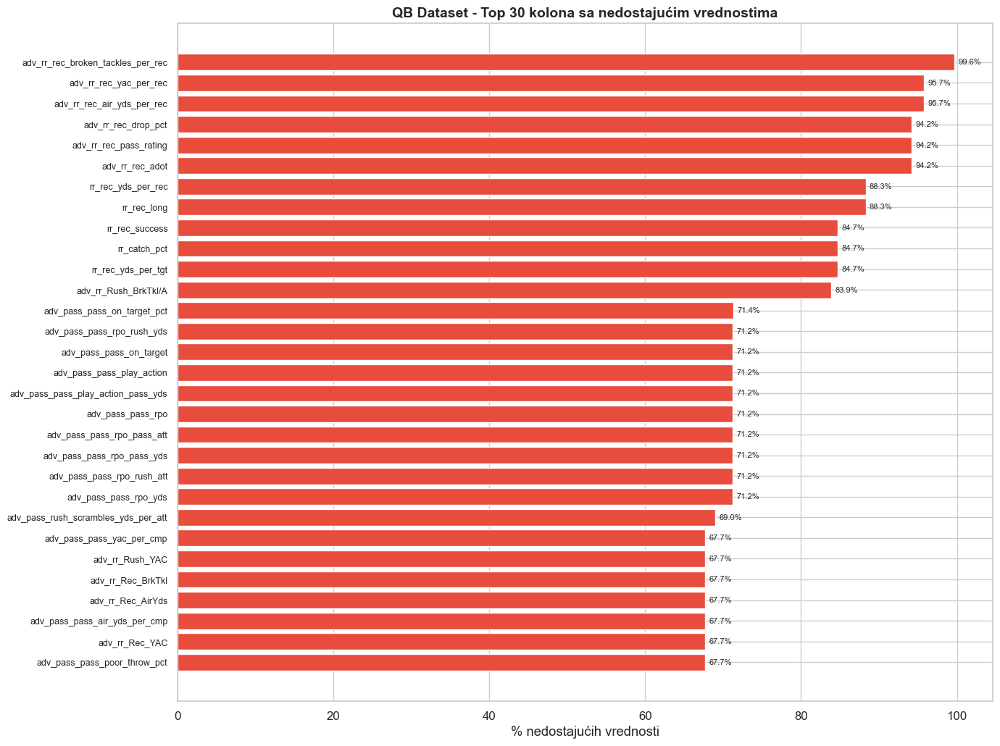

  Ukupno nedostajućih: 57,521 / 157,170 (36.6%)
  Kolona sa >50% missing: 62
  Kolona bez missing: 19 / 186


In [68]:
plot_missing_values(qb, 'QB Dataset', top_n=30)

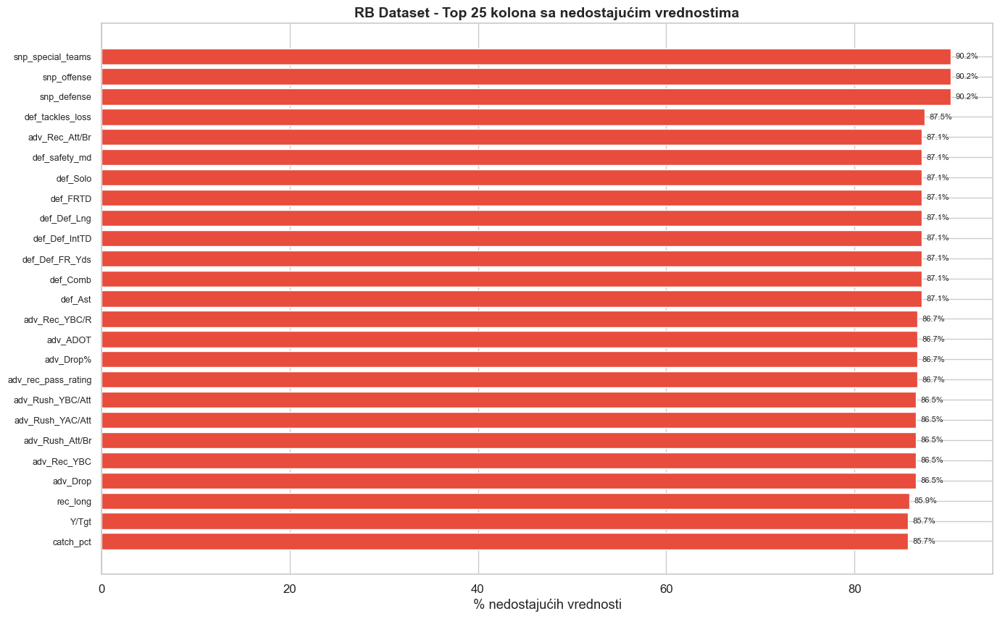

  Ukupno nedostajućih: 33,089 / 70,286 (47.1%)
  Kolona sa >50% missing: 61
  Kolona bez missing: 21 / 113


In [69]:
plot_missing_values(rb, 'RB Dataset', top_n=25)

In [70]:
plot_missing_values(wr, 'WR Dataset', top_n=25)

WR Dataset: Nema nedostajucih vrednosti!


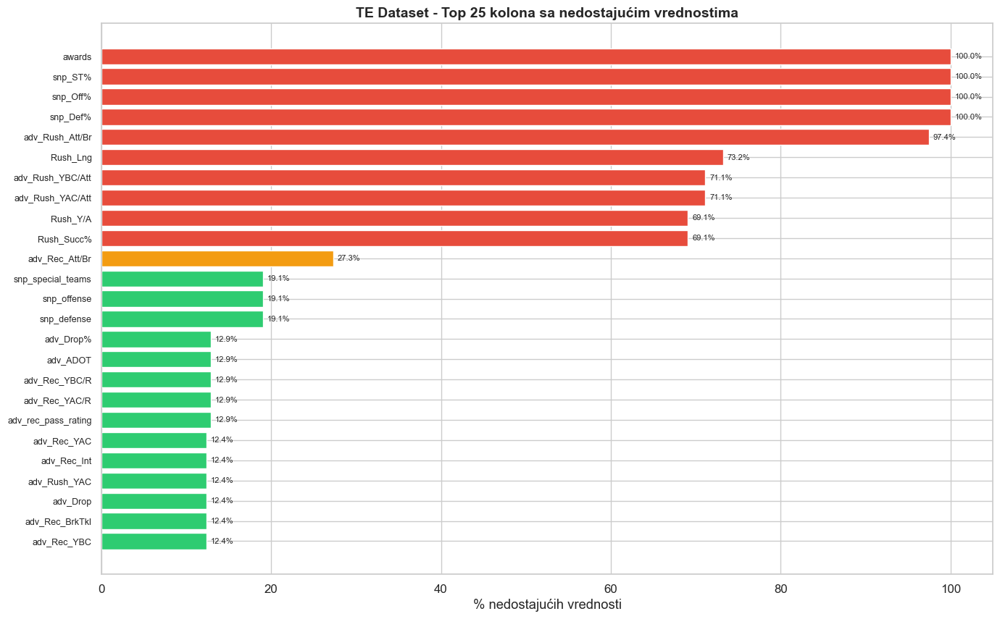

  Ukupno nedostajućih: 2,154 / 11,640 (18.5%)
  Kolona sa >50% missing: 10
  Kolona bez missing: 23 / 60


In [71]:
plot_missing_values(te, 'TE Dataset', top_n=25)

### Zaključak - Nedostajuće vrednosti

Analiza nedostajućih vrednosti otkriva jasnu strukturu:
- **Napredni statistički podaci** (advanced metrics poput air yards, pocket time, EPA) imaju najveći procenat nedostajućih vrednosti, posebno u starijim sezonama kada se ovi podaci nisu prikupljali. To je očekivano jer NFL je započeo detaljniju analitiku tek u poslednjoj deceniji.
- **Osnovni statistički podaci** (yards, touchdowns, attempts) su skoro kompletni za sve pozicije – to su podaci koji se evidentiraju od samog početka.
- **ELO rejtinzi i snap count** podaci su dostupni samo za novije sezone.
- **WR dataset** koristi drugačiju strukturu kolona od ostalih, sa granularnim podacima po kvartalima i win probability kategorijama.

**Implikacija za modeliranje:** Prilikom treniranja modela, moraćemo pažljivo da tretiramo nedostajuće vrednosti – ili ćemo koristiti samo kompletne kolone, ili primeniti imputaciju. Napredni metriki mogu poboljšati predikciju, ali ograničavaju dataset na novije sezone.

---
## 3. Distribucija ciljnih varijabli (Yards)

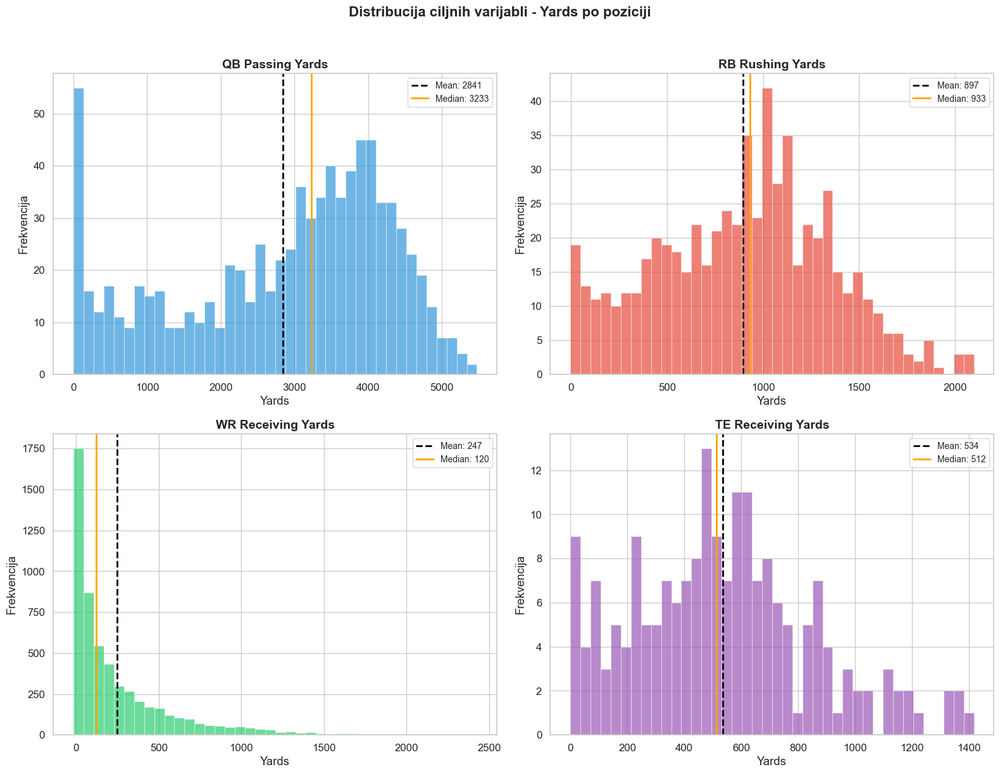

In [72]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

datasets = [
    (qb, 'Yds', 'QB Passing Yards', '#3498db'),
    (rb, 'Rush_Yds', 'RB Rushing Yards', '#e74c3c'),
    (wr, 'receiving_yards', 'WR Receiving Yards', '#2ecc71'),
    (te, 'Rec_Yds', 'TE Receiving Yards', '#9b59b6')
]

for ax, (df, col, title, color) in zip(axes.flat, datasets):
    data = df[col].dropna()
    ax.hist(data, bins=40, color=color, alpha=0.7, edgecolor='white', linewidth=0.5)
    ax.axvline(data.mean(), color='black', linestyle='--', linewidth=2, label=f'Mean: {data.mean():.0f}')
    ax.axvline(data.median(), color='orange', linestyle='-', linewidth=2, label=f'Median: {data.median():.0f}')
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel('Yards')
    ax.set_ylabel('Frekvencija')
    ax.legend(fontsize=10)

fig.suptitle('Distribucija ciljnih varijabli - Yards po poziciji', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

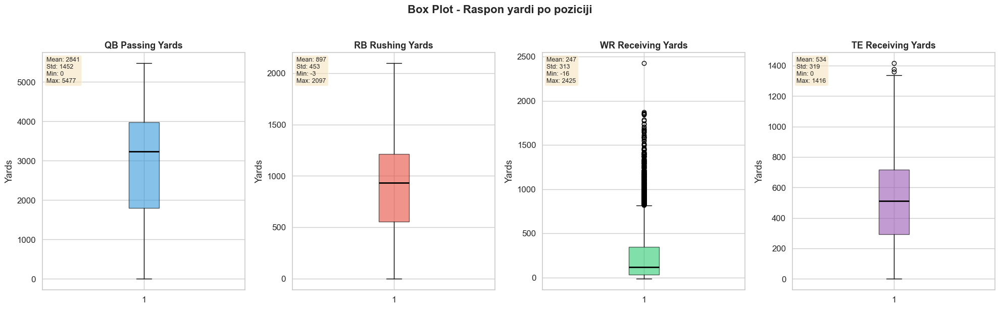

In [73]:
# Box plotovi za ciljne varijable
fig, axes = plt.subplots(1, 4, figsize=(20, 6))

for ax, (df, col, title, color) in zip(axes, datasets):
    bp = ax.boxplot(df[col].dropna(), patch_artist=True, 
                    boxprops=dict(facecolor=color, alpha=0.6),
                    medianprops=dict(color='black', linewidth=2))
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.set_ylabel('Yards')
    
    # Dodaj statistike
    stats = df[col].describe()
    textstr = f'Mean: {stats["mean"]:.0f}\nStd: {stats["std"]:.0f}\nMin: {stats["min"]:.0f}\nMax: {stats["max"]:.0f}'
    ax.text(0.02, 0.98, textstr, transform=ax.transAxes, fontsize=9,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

fig.suptitle('Box Plot - Raspon yardi po poziciji', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

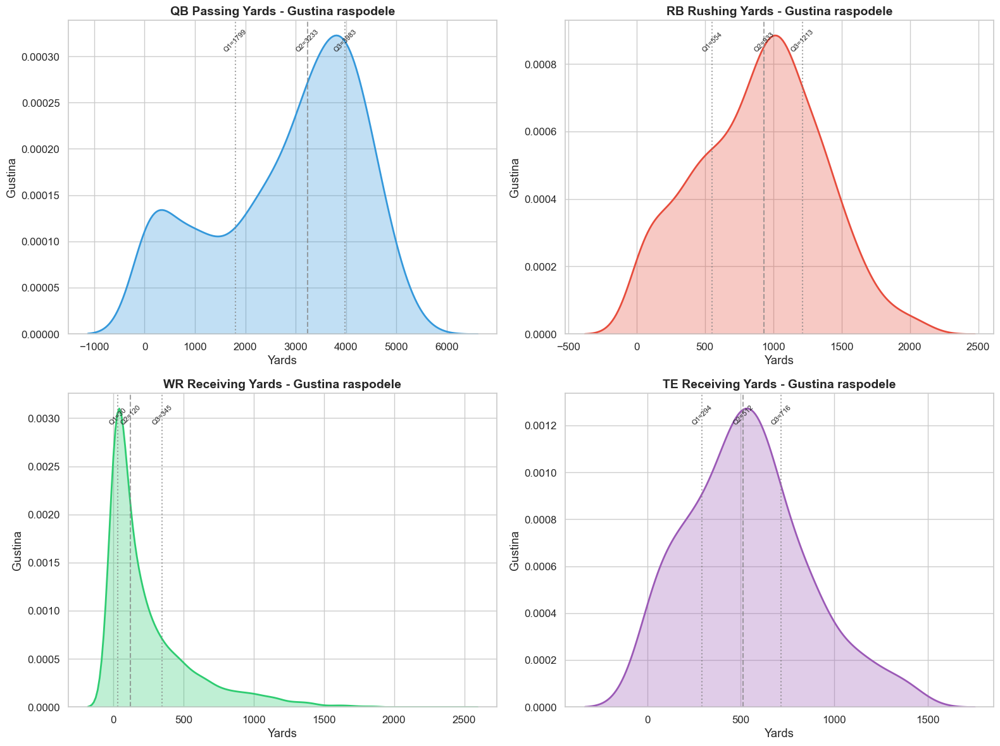

In [74]:
# KDE (Kernel Density Estimation) plotovi
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

for ax, (df, col, title, color) in zip(axes.flat, datasets):
    data = df[col].dropna()
    sns.kdeplot(data, ax=ax, color=color, fill=True, alpha=0.3, linewidth=2)
    ax.set_title(f'{title} - Gustina raspodele', fontsize=14, fontweight='bold')
    ax.set_xlabel('Yards')
    ax.set_ylabel('Gustina')
    
    # Oznaci kvartile
    for q, ls in [(0.25, ':'), (0.5, '--'), (0.75, ':')]:
        val = data.quantile(q)
        ax.axvline(val, color='gray', linestyle=ls, alpha=0.7)
        ax.text(val, ax.get_ylim()[1]*0.9, f'Q{int(q*4)}={val:.0f}', 
                fontsize=8, ha='center', rotation=45)

plt.tight_layout()
plt.show()

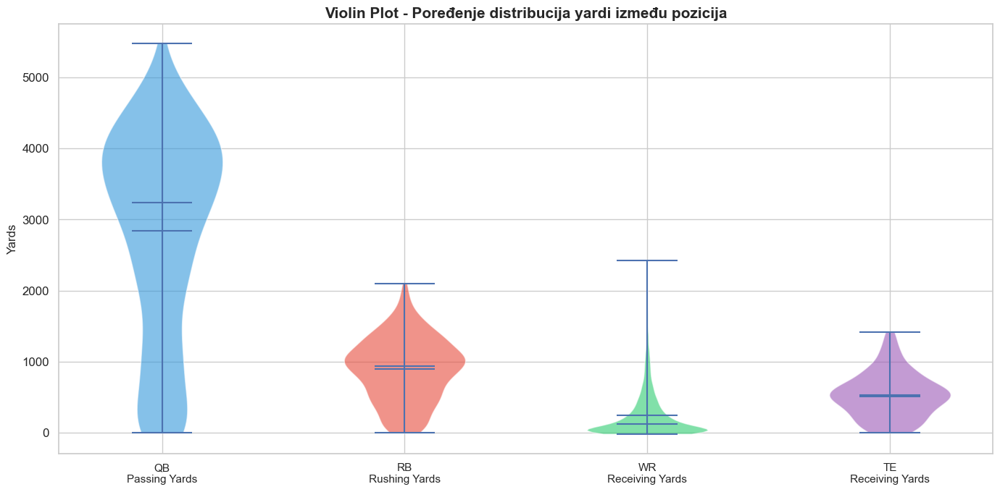

In [75]:
# Violin plotovi - kombinacija box plota i KDE
fig, ax = plt.subplots(figsize=(14, 7))

violin_data = []
labels = []
for df, col, title, color in datasets:
    violin_data.append(df[col].dropna().values)
    labels.append(title.split(' ')[0] + '\n' + ' '.join(title.split(' ')[1:]))

parts = ax.violinplot(violin_data, showmeans=True, showmedians=True)
colors = ['#3498db', '#e74c3c', '#2ecc71', '#9b59b6']
for i, pc in enumerate(parts['bodies']):
    pc.set_facecolor(colors[i])
    pc.set_alpha(0.6)

ax.set_xticks([1, 2, 3, 4])
ax.set_xticklabels(labels, fontsize=11)
ax.set_ylabel('Yards', fontsize=12)
ax.set_title('Violin Plot - Poređenje distribucija yardi između pozicija', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

### Zaključak - Distribucije ciljnih varijabli

Vizuelizacija distribucija putem histograma, box plotova, KDE krivulja i violin plotova otkriva važne karakteristike:

- **QB Passing Yards:** Distribucija je bimodalna – jedan mod oko ~1000 yds (backup QB-ovi i igrači sa kratkim sezonama) i drugi oko ~3500-4500 yds (full-time starteri). Box plot ukazuje na relativno mali broj outlier-a.
- **RB Rushing Yards:** Distribucija je desno asimetrična (pozitivni skew) sa dugim repom prema višim vrednostima. Većina RB-ova akumulira manje od 1000 yardova, dok elite sezone prelaze 1500+.
- **WR Receiving Yards:** Najizraženija desna asimetrija – ogromna koncentracija igrača sa manje od 200 yardi i dug rep do 2000+. To ukazuje na veliku nejednakost u distribuciji lopte prema primačima.
- **TE Receiving Yards:** Relativno simetrična distribucija sa prosekom oko 534 yardi. Violin plot pokazuje ujednačenu gustinu, što sugerise da su u datasetu pretežno relevantni TE-ovi.

**Ključni uvid:** Razlike u obliku distribucija zahtevaju različite pristupe normalizaciji. WR dataset bi mogao benefitirati od log transformacije ili filtriranja po minimalnom broju targetova.

---
## 4. Korelaciona analiza
Prikazujemo korelaciju između ciljne varijable (Yards) i najvažnijih feature-a za svaku poziciju.

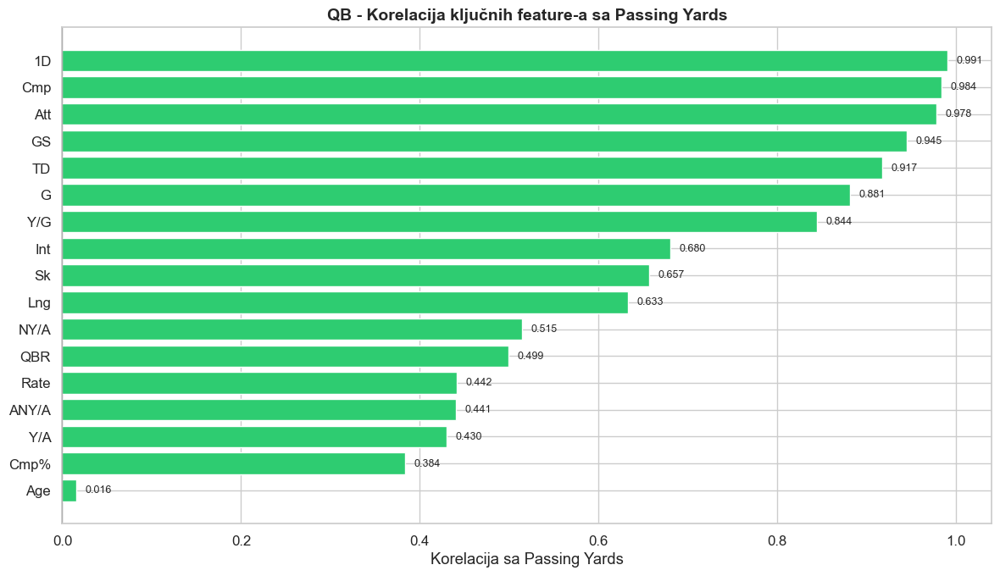

In [76]:
# QB - Korelacija sa Passing Yards
qb_key_cols = ['Yds', 'Cmp', 'Att', 'Cmp%', 'TD', 'Int', 'Y/A', 'Y/G', 'Rate', 'QBR',
               'Sk', 'NY/A', 'ANY/A', 'G', 'GS', 'Age', '1D', 'Lng']
qb_corr = qb[qb_key_cols].corr()['Yds'].drop('Yds').sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(12, 7))
colors = ['#2ecc71' if v > 0 else '#e74c3c' for v in qb_corr.values]
bars = ax.barh(range(len(qb_corr)), qb_corr.values, color=colors, edgecolor='white')
ax.set_yticks(range(len(qb_corr)))
ax.set_yticklabels(qb_corr.index)
ax.set_xlabel('Korelacija sa Passing Yards')
ax.set_title('QB - Korelacija ključnih feature-a sa Passing Yards', fontsize=14, fontweight='bold')
ax.axvline(x=0, color='black', linewidth=0.8)
ax.invert_yaxis()

for bar, val in zip(bars, qb_corr.values):
    ax.text(val + (0.01 if val >= 0 else -0.01), bar.get_y() + bar.get_height()/2,
            f'{val:.3f}', va='center', ha='left' if val >= 0 else 'right', fontsize=9)

plt.tight_layout()
plt.show()

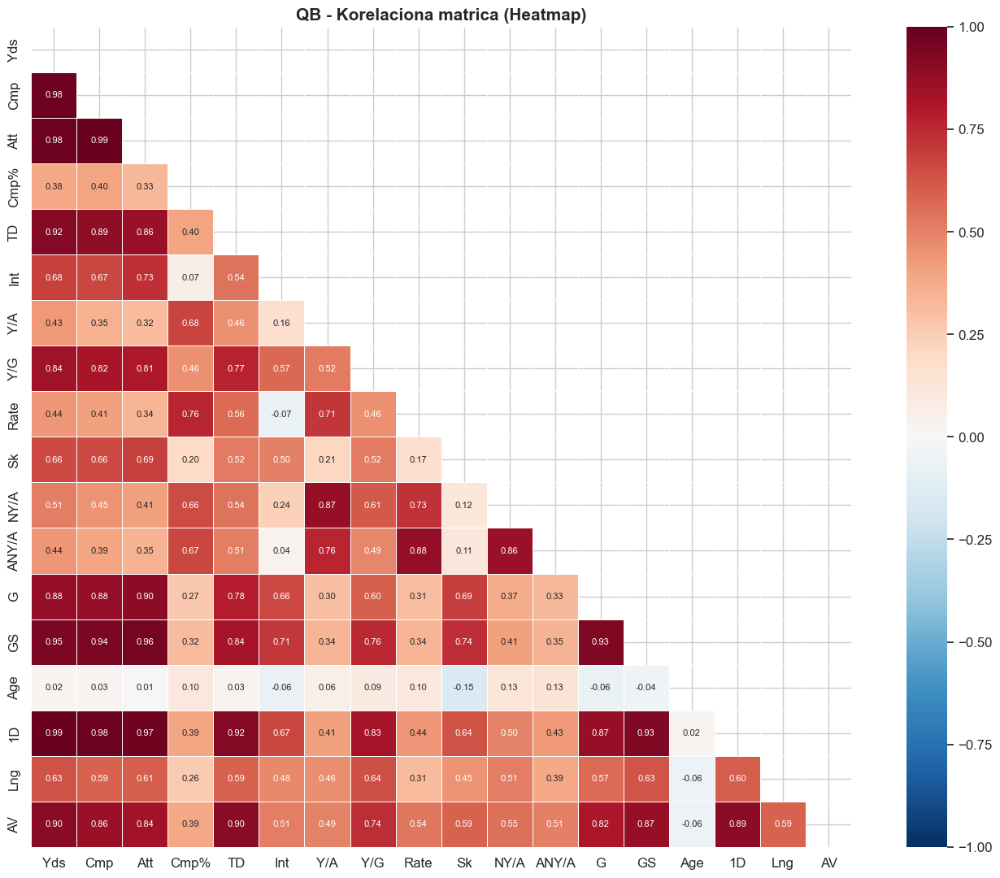

In [77]:
# QB - Heatmap korelacione matrice
fig, ax = plt.subplots(figsize=(14, 11))
qb_heatmap_cols = ['Yds', 'Cmp', 'Att', 'Cmp%', 'TD', 'Int', 'Y/A', 'Y/G', 'Rate', 
                   'Sk', 'NY/A', 'ANY/A', 'G', 'GS', 'Age', '1D', 'Lng', 'AV']
corr_matrix = qb[qb_heatmap_cols].corr()

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r', center=0,
            square=True, linewidths=0.5, ax=ax, vmin=-1, vmax=1,
            annot_kws={'size': 8})
ax.set_title('QB - Korelaciona matrica (Heatmap)', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

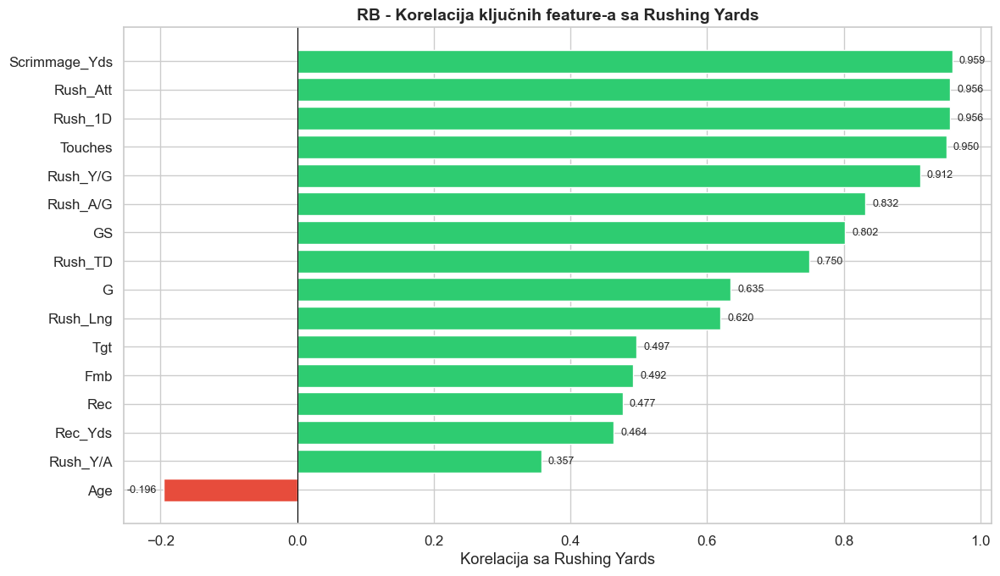

In [78]:
# RB - Korelacija sa Rushing Yards
rb_key_cols = ['Rush_Yds', 'Rush_Att', 'Rush_TD', 'Rush_1D', 'Rush_Y/A', 'Rush_Y/G',
               'Rush_A/G', 'Rush_Lng', 'G', 'GS', 'Age', 'Rec', 'Rec_Yds', 'Tgt',
               'Touches', 'Scrimmage_Yds', 'Fmb']
rb_corr = rb[rb_key_cols].corr()['Rush_Yds'].drop('Rush_Yds').sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(12, 7))
colors = ['#2ecc71' if v > 0 else '#e74c3c' for v in rb_corr.values]
bars = ax.barh(range(len(rb_corr)), rb_corr.values, color=colors, edgecolor='white')
ax.set_yticks(range(len(rb_corr)))
ax.set_yticklabels(rb_corr.index)
ax.set_xlabel('Korelacija sa Rushing Yards')
ax.set_title('RB - Korelacija ključnih feature-a sa Rushing Yards', fontsize=14, fontweight='bold')
ax.axvline(x=0, color='black', linewidth=0.8)
ax.invert_yaxis()

for bar, val in zip(bars, rb_corr.values):
    ax.text(val + (0.01 if val >= 0 else -0.01), bar.get_y() + bar.get_height()/2,
            f'{val:.3f}', va='center', ha='left' if val >= 0 else 'right', fontsize=9)

plt.tight_layout()
plt.show()

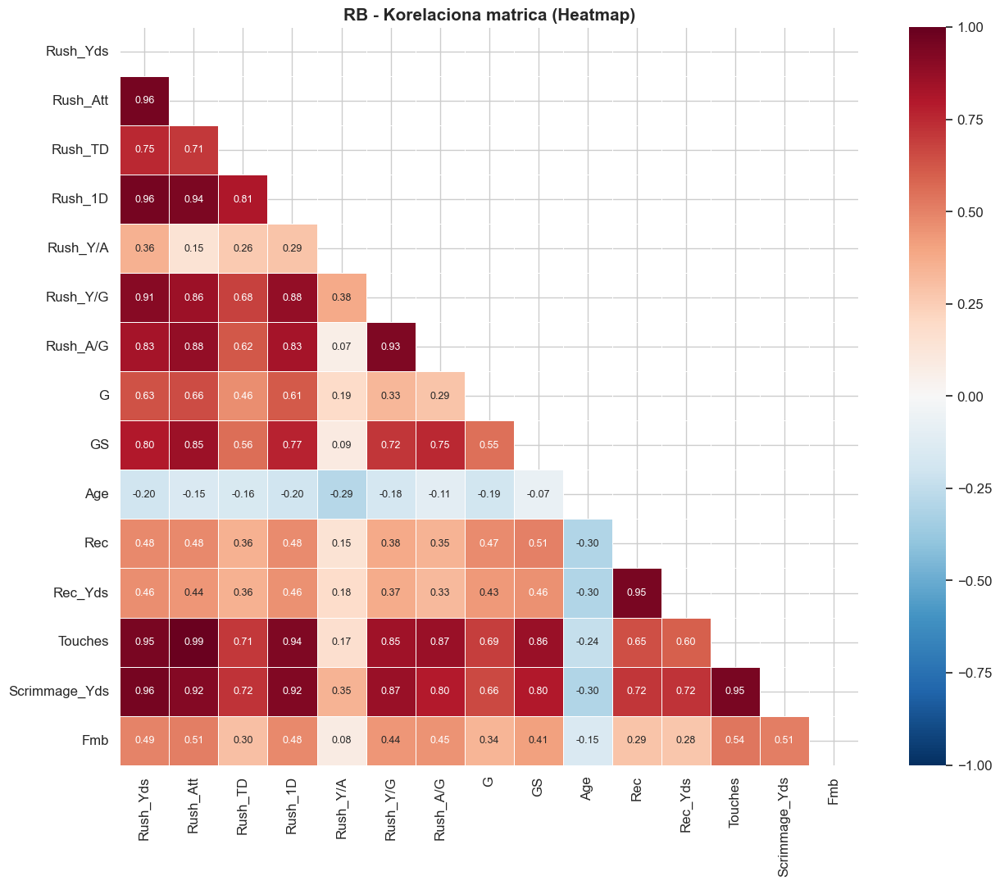

In [79]:
# RB - Heatmap korelacione matrice
fig, ax = plt.subplots(figsize=(14, 11))
rb_heatmap_cols = ['Rush_Yds', 'Rush_Att', 'Rush_TD', 'Rush_1D', 'Rush_Y/A', 'Rush_Y/G',
                   'Rush_A/G', 'G', 'GS', 'Age', 'Rec', 'Rec_Yds', 'Touches', 'Scrimmage_Yds', 'Fmb']
corr_matrix_rb = rb[rb_heatmap_cols].corr()

mask = np.triu(np.ones_like(corr_matrix_rb, dtype=bool))
sns.heatmap(corr_matrix_rb, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r', center=0,
            square=True, linewidths=0.5, ax=ax, vmin=-1, vmax=1,
            annot_kws={'size': 9})
ax.set_title('RB - Korelaciona matrica (Heatmap)', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

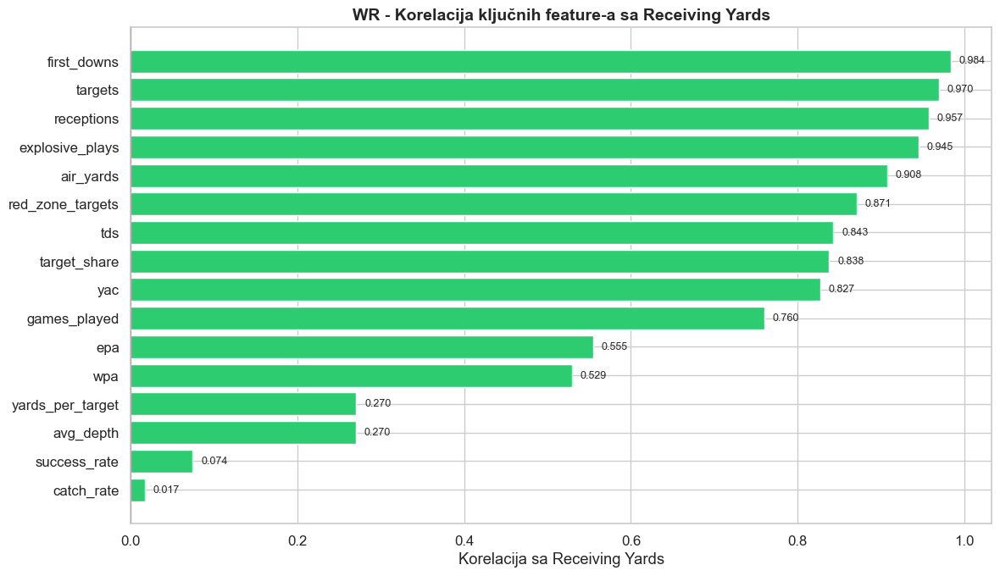

In [80]:
# WR - Korelacija sa Receiving Yards
wr_key_cols = ['receiving_yards', 'targets', 'receptions', 'air_yards', 'yac', 'tds',
               'catch_rate', 'games_played', 'first_downs', 'red_zone_targets',
               'epa', 'wpa', 'avg_depth', 'target_share', 'yards_per_target',
               'explosive_plays', 'success_rate']
wr_corr = wr[wr_key_cols].corr()['receiving_yards'].drop('receiving_yards').sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(12, 7))
colors = ['#2ecc71' if v > 0 else '#e74c3c' for v in wr_corr.values]
bars = ax.barh(range(len(wr_corr)), wr_corr.values, color=colors, edgecolor='white')
ax.set_yticks(range(len(wr_corr)))
ax.set_yticklabels(wr_corr.index)
ax.set_xlabel('Korelacija sa Receiving Yards')
ax.set_title('WR - Korelacija ključnih feature-a sa Receiving Yards', fontsize=14, fontweight='bold')
ax.axvline(x=0, color='black', linewidth=0.8)
ax.invert_yaxis()

for bar, val in zip(bars, wr_corr.values):
    ax.text(val + (0.01 if val >= 0 else -0.01), bar.get_y() + bar.get_height()/2,
            f'{val:.3f}', va='center', ha='left' if val >= 0 else 'right', fontsize=9)

plt.tight_layout()
plt.show()

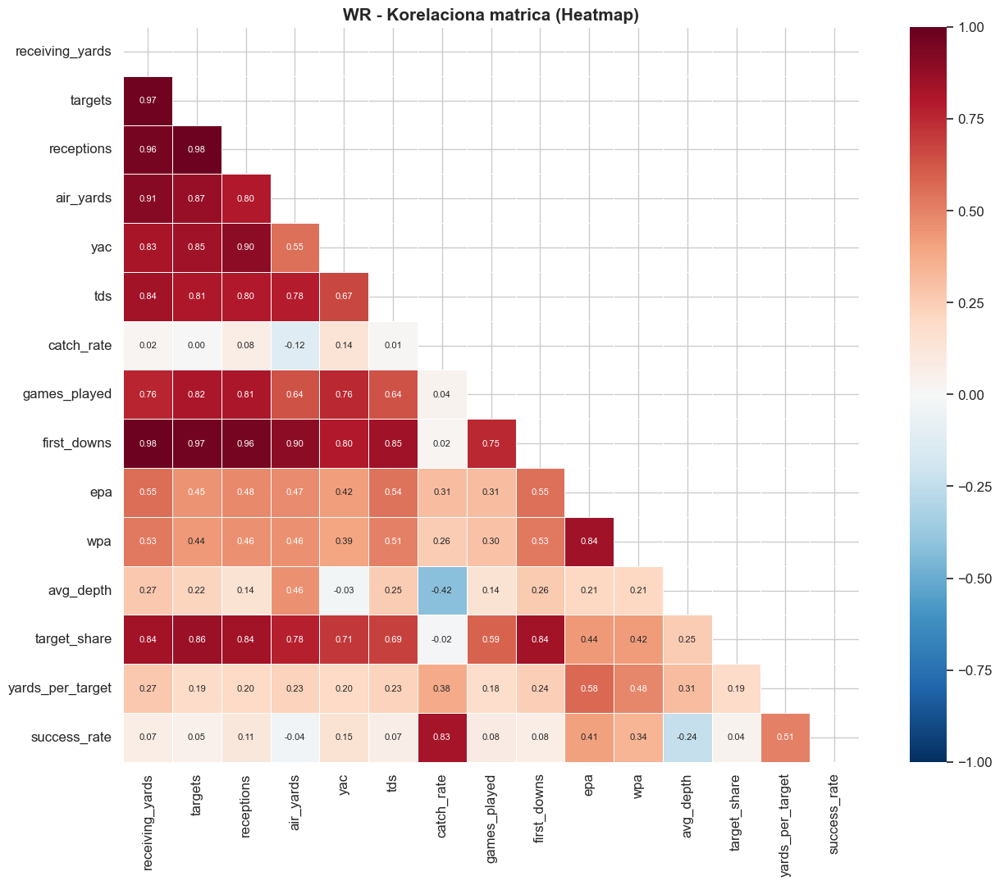

In [81]:
# WR - Heatmap korelacione matrice
fig, ax = plt.subplots(figsize=(14, 11))
wr_heatmap_cols = ['receiving_yards', 'targets', 'receptions', 'air_yards', 'yac', 'tds',
                   'catch_rate', 'games_played', 'first_downs', 'epa', 'wpa',
                   'avg_depth', 'target_share', 'yards_per_target', 'success_rate']
corr_matrix_wr = wr[wr_heatmap_cols].corr()

mask = np.triu(np.ones_like(corr_matrix_wr, dtype=bool))
sns.heatmap(corr_matrix_wr, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r', center=0,
            square=True, linewidths=0.5, ax=ax, vmin=-1, vmax=1,
            annot_kws={'size': 8})
ax.set_title('WR - Korelaciona matrica (Heatmap)', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

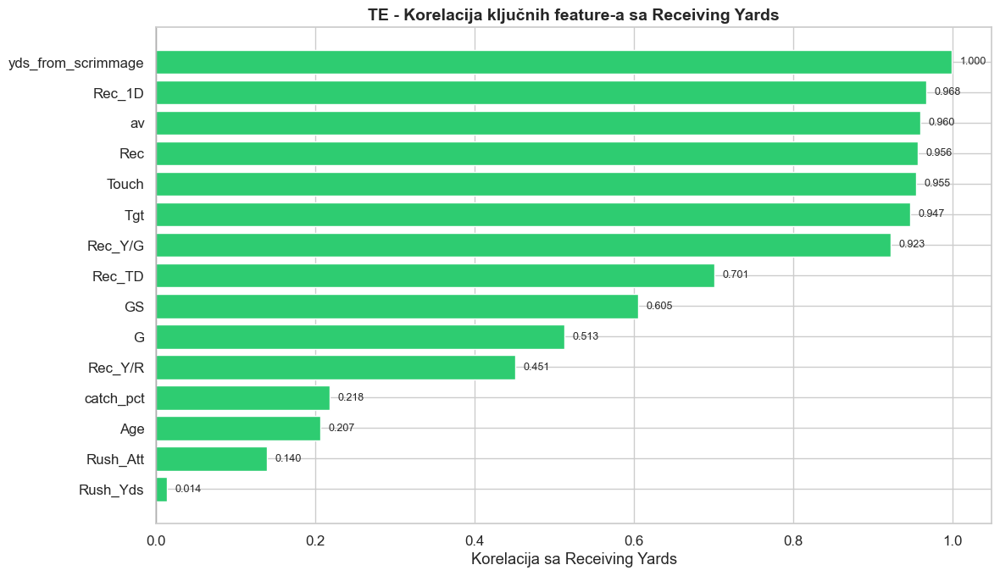

In [82]:
# TE - Korelacija sa Receiving Yards
te_key_cols = ['Rec_Yds', 'Tgt', 'Rec', 'Rec_TD', 'Rec_1D', 'Rec_Y/R', 'Rec_Y/G',
               'catch_pct', 'G', 'GS', 'Age', 'Rush_Att', 'Rush_Yds',
               'Touch', 'yds_from_scrimmage', 'av']
te_corr = te[te_key_cols].corr()['Rec_Yds'].drop('Rec_Yds').sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(12, 7))
colors = ['#2ecc71' if v > 0 else '#e74c3c' for v in te_corr.values]
bars = ax.barh(range(len(te_corr)), te_corr.values, color=colors, edgecolor='white')
ax.set_yticks(range(len(te_corr)))
ax.set_yticklabels(te_corr.index)
ax.set_xlabel('Korelacija sa Receiving Yards')
ax.set_title('TE - Korelacija ključnih feature-a sa Receiving Yards', fontsize=14, fontweight='bold')
ax.axvline(x=0, color='black', linewidth=0.8)
ax.invert_yaxis()

for bar, val in zip(bars, te_corr.values):
    ax.text(val + (0.01 if val >= 0 else -0.01), bar.get_y() + bar.get_height()/2,
            f'{val:.3f}', va='center', ha='left' if val >= 0 else 'right', fontsize=9)

plt.tight_layout()
plt.show()

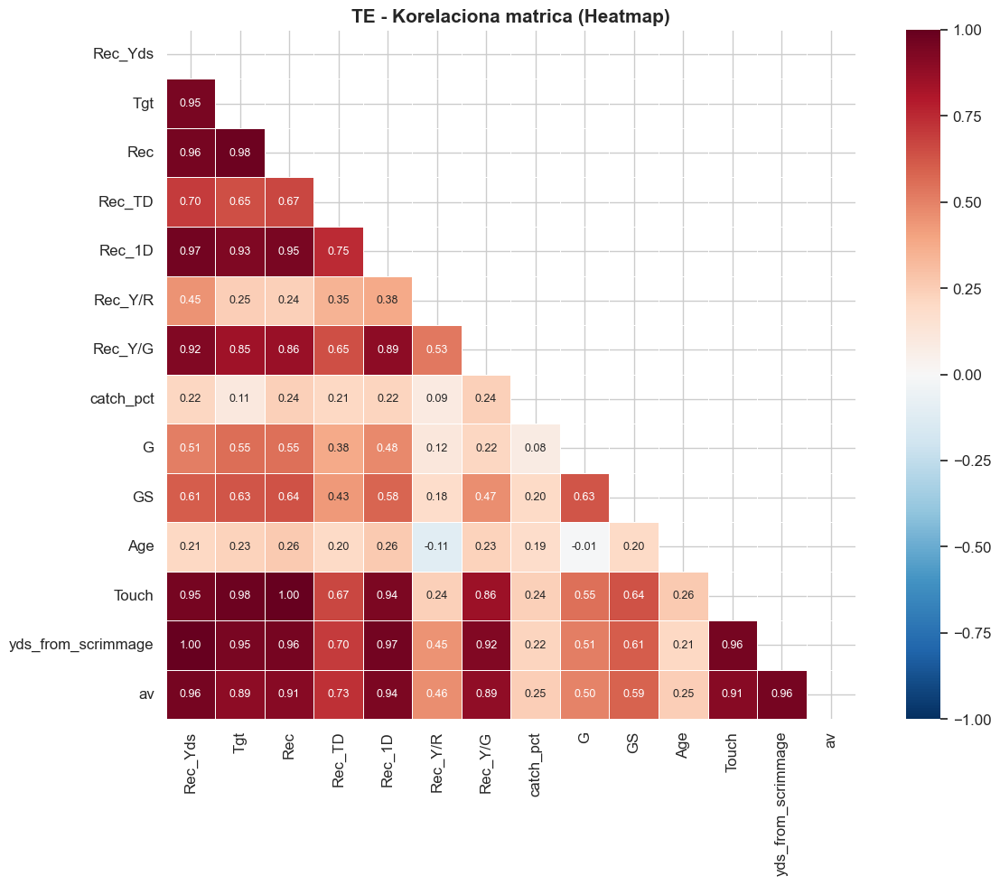

In [83]:
# TE - Heatmap korelacione matrice
fig, ax = plt.subplots(figsize=(13, 10))
te_heatmap_cols = ['Rec_Yds', 'Tgt', 'Rec', 'Rec_TD', 'Rec_1D', 'Rec_Y/R', 'Rec_Y/G',
                   'catch_pct', 'G', 'GS', 'Age', 'Touch', 'yds_from_scrimmage', 'av']
corr_matrix_te = te[te_heatmap_cols].corr()

mask = np.triu(np.ones_like(corr_matrix_te, dtype=bool))
sns.heatmap(corr_matrix_te, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r', center=0,
            square=True, linewidths=0.5, ax=ax, vmin=-1, vmax=1,
            annot_kws={'size': 9})
ax.set_title('TE - Korelaciona matrica (Heatmap)', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

### Zaključak - Korelaciona analiza

Bar grafici i heatmape korelacija otkrivaju najvažnije prediktore za svaku poziciju:

**QB Passing Yards:**
- Najjače korelacije: `Att` (pokušaji), `Cmp` (kompletirana dodavanja), `GS` (games started), `1D` (prvi dahovi). Ovo je logično – više pokušaja = više yardi.
- Passer Rating (`Rate`) ima umeren pozitivan odnos, što znači da efikasnost sama po sebi ne garantuje visoke yarde – volumen je ključan.

**RB Rushing Yards:**
- Dominiraju `Rush_Att` (nošenja), `Scrimmage_Yds`, `Touches`, `GS`. Kao i kod QB-a, obim dodira sa loptom je primarni faktor.
- `Rush_Y/A` (yards per attempt) ima slabiju korelaciju nego ukupni pokušaji – RB koji trči 300 puta po 3.5 Y/A može imati više yardi od RB-a sa 150 pokušaja po 5.0 Y/A.

**WR Receiving Yards:**
- Najjači prediktori su `receptions`, `targets`, `air_yards`, `first_downs`. Target share i catch rate imaju umerenu korelaciju.
- Heatmapa otkriva klastere koreliranih varijabli – volumen metriki (targets/receptions) su međusobno jako korelirani.

**TE Receiving Yards:**
- Slično WR-u: `Tgt`, `Rec`, `yds_from_scrimmage` dominiraju. Manji dataset (194 reda) može dovesti do manje stabilnih korelacija.

**Ključni uvid za modeliranje:** Postoji jak multikolinearitet između volume metrika (pokušaji, dodiri, hvatanja). Regularizovani modeli (Lasso, Ridge, ElasticNet) će biti važni za prevazilaženje ovog problema.

---
## 5. Trendovi kroz sezone - Prosečni Yards po sezoni

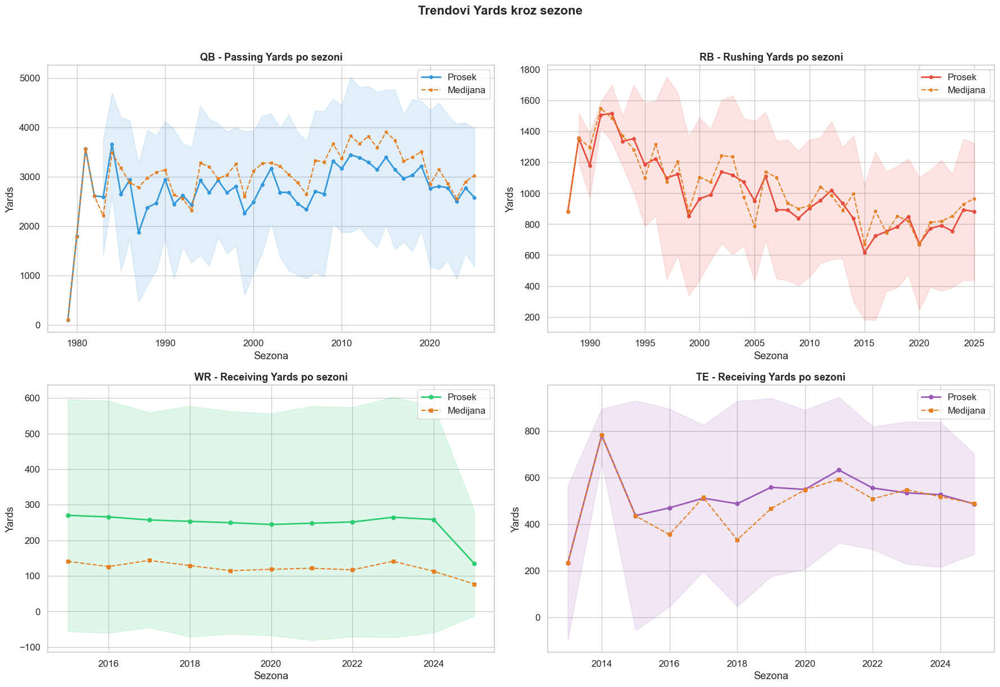

In [84]:
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# QB - Prosecni Passing Yds po sezoni
ax = axes[0, 0]
qb_trend = qb.groupby('Season')['Yds'].agg(['mean', 'median', 'std']).reset_index()
ax.plot(qb_trend['Season'], qb_trend['mean'], 'o-', color='#3498db', linewidth=2, markersize=4, label='Prosek')
ax.plot(qb_trend['Season'], qb_trend['median'], 's--', color='#e67e22', linewidth=1.5, markersize=3, label='Medijana')
ax.fill_between(qb_trend['Season'], 
                qb_trend['mean'] - qb_trend['std'], 
                qb_trend['mean'] + qb_trend['std'], 
                alpha=0.15, color='#3498db')
ax.set_title('QB - Passing Yards po sezoni', fontsize=13, fontweight='bold')
ax.set_xlabel('Sezona')
ax.set_ylabel('Yards')
ax.legend()

# RB - Prosecni Rushing Yds po sezoni
ax = axes[0, 1]
rb_trend = rb.groupby('Season')['Rush_Yds'].agg(['mean', 'median', 'std']).reset_index()
ax.plot(rb_trend['Season'], rb_trend['mean'], 'o-', color='#e74c3c', linewidth=2, markersize=4, label='Prosek')
ax.plot(rb_trend['Season'], rb_trend['median'], 's--', color='#e67e22', linewidth=1.5, markersize=3, label='Medijana')
ax.fill_between(rb_trend['Season'], 
                rb_trend['mean'] - rb_trend['std'], 
                rb_trend['mean'] + rb_trend['std'], 
                alpha=0.15, color='#e74c3c')
ax.set_title('RB - Rushing Yards po sezoni', fontsize=13, fontweight='bold')
ax.set_xlabel('Sezona')
ax.set_ylabel('Yards')
ax.legend()

# WR - Prosecni Receiving Yds po sezoni
ax = axes[1, 0]
wr_trend = wr.groupby('season')['receiving_yards'].agg(['mean', 'median', 'std']).reset_index()
ax.plot(wr_trend['season'], wr_trend['mean'], 'o-', color='#2ecc71', linewidth=2, markersize=5, label='Prosek')
ax.plot(wr_trend['season'], wr_trend['median'], 's--', color='#e67e22', linewidth=1.5, markersize=4, label='Medijana')
ax.fill_between(wr_trend['season'], 
                wr_trend['mean'] - wr_trend['std'], 
                wr_trend['mean'] + wr_trend['std'], 
                alpha=0.15, color='#2ecc71')
ax.set_title('WR - Receiving Yards po sezoni', fontsize=13, fontweight='bold')
ax.set_xlabel('Sezona')
ax.set_ylabel('Yards')
ax.legend()

# TE - Prosecni Receiving Yds po sezoni
ax = axes[1, 1]
te_trend = te.groupby('Season')['Rec_Yds'].agg(['mean', 'median', 'std']).reset_index()
ax.plot(te_trend['Season'], te_trend['mean'], 'o-', color='#9b59b6', linewidth=2, markersize=5, label='Prosek')
ax.plot(te_trend['Season'], te_trend['median'], 's--', color='#e67e22', linewidth=1.5, markersize=4, label='Medijana')
ax.fill_between(te_trend['Season'], 
                te_trend['mean'] - te_trend['std'], 
                te_trend['mean'] + te_trend['std'], 
                alpha=0.15, color='#9b59b6')
ax.set_title('TE - Receiving Yards po sezoni', fontsize=13, fontweight='bold')
ax.set_xlabel('Sezona')
ax.set_ylabel('Yards')
ax.legend()

fig.suptitle('Trendovi Yards kroz sezone', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

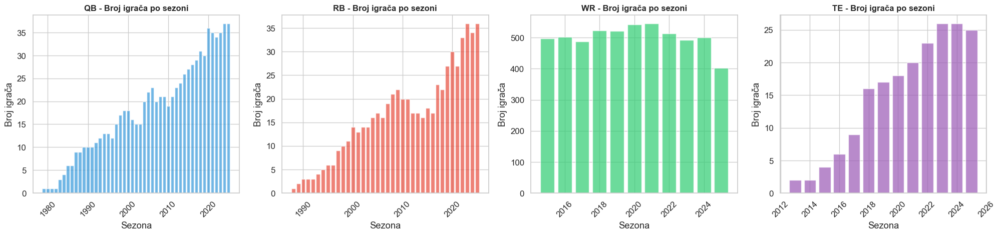

In [85]:
# Broj igraca po sezoni
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

season_counts = [
    (qb.groupby('Season').size(), 'QB', '#3498db'),
    (rb.groupby('Season').size(), 'RB', '#e74c3c'),
    (wr.groupby('season').size(), 'WR', '#2ecc71'),
    (te.groupby('Season').size(), 'TE', '#9b59b6')
]

for ax, (counts, label, color) in zip(axes, season_counts):
    ax.bar(counts.index, counts.values, color=color, alpha=0.7, edgecolor='white')
    ax.set_title(f'{label} - Broj igrača po sezoni', fontsize=12, fontweight='bold')
    ax.set_xlabel('Sezona')
    ax.set_ylabel('Broj igrača')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

### Zaključak - Trendovi kroz sezone

Analiza sezonskih trendova pruža uvid u evoluciju NFL igre:

- **QB Passing Yards:** Jasan rastući trend od 1979. do danas. Prosečni passing yards su se povećali sa ~2000 u ranim '80-im na ~3500+ u modernoj eri. Ovo reflektuje promene pravila NFL-a (zaštita quarterbacka, pravila o pass interference) i filozofsku evoluciju ka pass-first ofanzivi.
- **RB Rushing Yards:** Blagi pad proseka, posebno od sredine 2000-ih. Moderna NFL favorizuje prolaznu igru, a uloga RB-a se menja od bellcow nosača do RBBC (running back by committee) pristupa, gde se opterećenje deli.
- **WR/TE Receiving Yards:** Relativno stabilni trendovi u dostupnom periodu (2013-2025 za TE, 2015-2025 za WR).

**Broj igrača po sezoni:** Varira – u ranijim sezonama imamo manje podataka, što može uticati na stabilnost proseka. Ovo je važno uzeti u obzir pri interpretaciji starijih trendova.

**Implikacija:** Ako koristimo podatke iz različitih era za trening modela, trebamo razmotriti da li dodajemo sezonu kao feature ili normalizujemo yarde u odnosu na eru.

---
## 6. Top igrači po Yardima

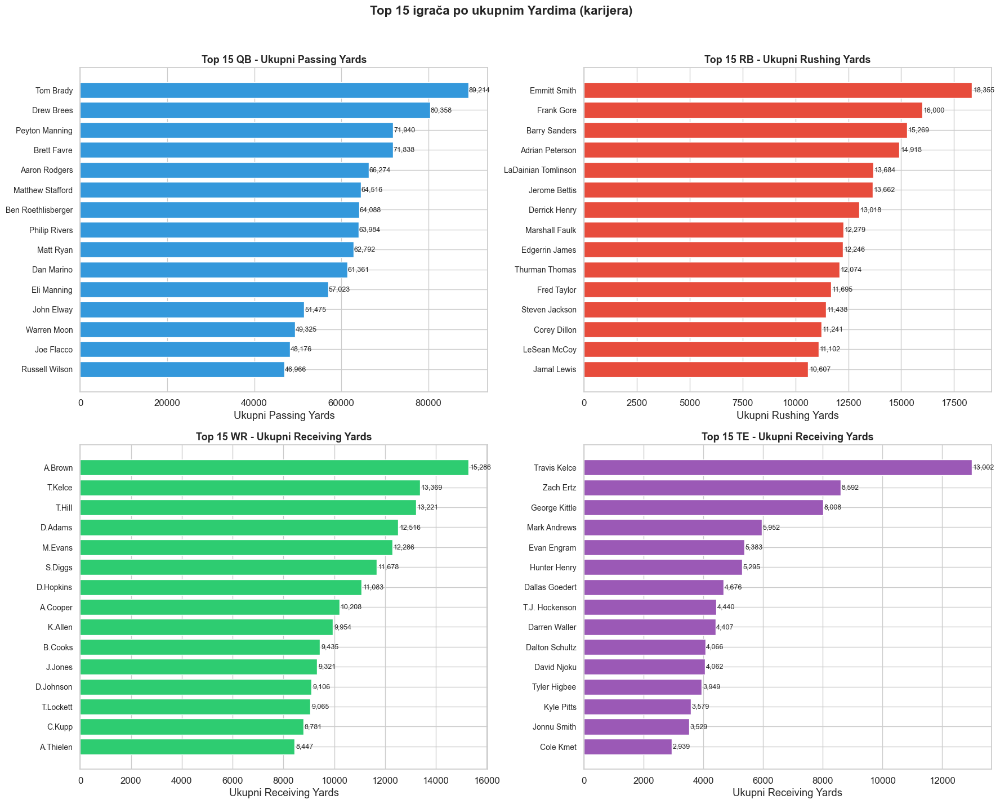

In [86]:
# Top 15 QB-ova po ukupnim Passing Yards (karijera)
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# QB
ax = axes[0, 0]
top_qb = qb.groupby('Player')['Yds'].sum().sort_values(ascending=False).head(15)
bars = ax.barh(range(len(top_qb)), top_qb.values, color='#3498db', edgecolor='white')
ax.set_yticks(range(len(top_qb)))
ax.set_yticklabels(top_qb.index, fontsize=10)
ax.set_xlabel('Ukupni Passing Yards')
ax.set_title('Top 15 QB - Ukupni Passing Yards', fontsize=13, fontweight='bold')
ax.invert_yaxis()
for bar, val in zip(bars, top_qb.values):
    ax.text(val + 100, bar.get_y() + bar.get_height()/2, f'{val:,.0f}', va='center', fontsize=9)

# RB
ax = axes[0, 1]
top_rb = rb.groupby('Player')['Rush_Yds'].sum().sort_values(ascending=False).head(15)
bars = ax.barh(range(len(top_rb)), top_rb.values, color='#e74c3c', edgecolor='white')
ax.set_yticks(range(len(top_rb)))
ax.set_yticklabels(top_rb.index, fontsize=10)
ax.set_xlabel('Ukupni Rushing Yards')
ax.set_title('Top 15 RB - Ukupni Rushing Yards', fontsize=13, fontweight='bold')
ax.invert_yaxis()
for bar, val in zip(bars, top_rb.values):
    ax.text(val + 50, bar.get_y() + bar.get_height()/2, f'{val:,.0f}', va='center', fontsize=9)

# WR
ax = axes[1, 0]
top_wr = wr.groupby('receiver_player_name')['receiving_yards'].sum().sort_values(ascending=False).head(15)
bars = ax.barh(range(len(top_wr)), top_wr.values, color='#2ecc71', edgecolor='white')
ax.set_yticks(range(len(top_wr)))
ax.set_yticklabels(top_wr.index, fontsize=10)
ax.set_xlabel('Ukupni Receiving Yards')
ax.set_title('Top 15 WR - Ukupni Receiving Yards', fontsize=13, fontweight='bold')
ax.invert_yaxis()
for bar, val in zip(bars, top_wr.values):
    ax.text(val + 50, bar.get_y() + bar.get_height()/2, f'{val:,.0f}', va='center', fontsize=9)

# TE
ax = axes[1, 1]
top_te = te.groupby('Player')['Rec_Yds'].sum().sort_values(ascending=False).head(15)
bars = ax.barh(range(len(top_te)), top_te.values, color='#9b59b6', edgecolor='white')
ax.set_yticks(range(len(top_te)))
ax.set_yticklabels(top_te.index, fontsize=10)
ax.set_xlabel('Ukupni Receiving Yards')
ax.set_title('Top 15 TE - Ukupni Receiving Yards', fontsize=13, fontweight='bold')
ax.invert_yaxis()
for bar, val in zip(bars, top_te.values):
    ax.text(val + 30, bar.get_y() + bar.get_height()/2, f'{val:,.0f}', va='center', fontsize=9)

fig.suptitle('Top 15 igrača po ukupnim Yardima (karijera)', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

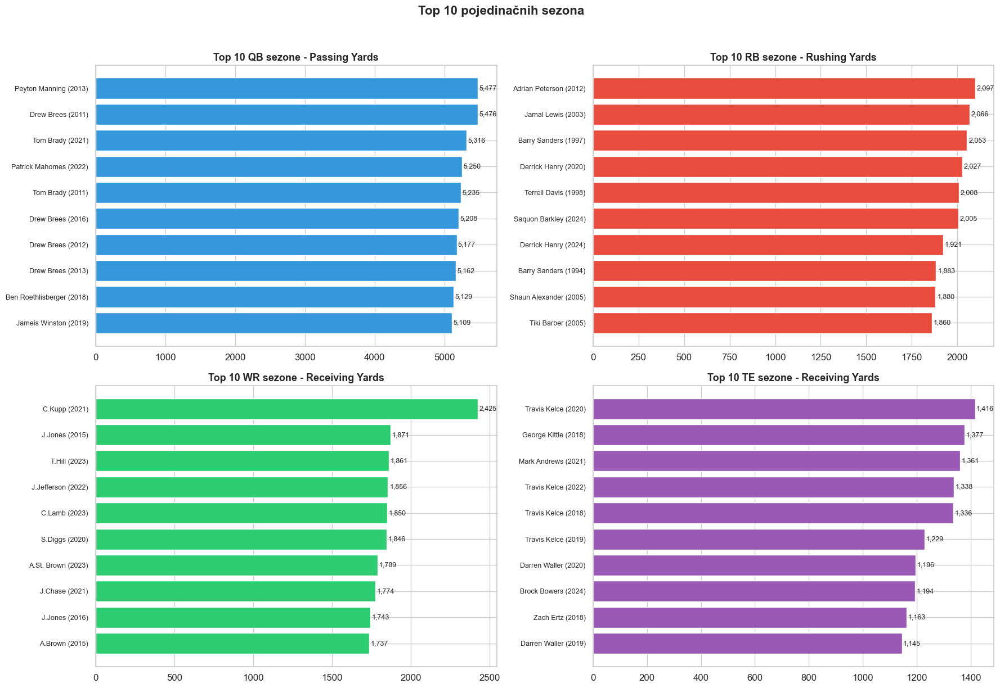

In [87]:
# Top 10 pojedinačnih sezona po yardima - za svaku poziciju
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# QB - Najbolje pojedinacne sezone
ax = axes[0, 0]
qb_top_seasons = qb.nlargest(10, 'Yds')[['Player', 'Season', 'Yds']].reset_index(drop=True)
qb_top_seasons['label'] = qb_top_seasons['Player'] + ' (' + qb_top_seasons['Season'].astype(str) + ')'
bars = ax.barh(range(len(qb_top_seasons)), qb_top_seasons['Yds'], color='#3498db')
ax.set_yticks(range(len(qb_top_seasons)))
ax.set_yticklabels(qb_top_seasons['label'], fontsize=9)
ax.set_title('Top 10 QB sezone - Passing Yards', fontsize=13, fontweight='bold')
ax.invert_yaxis()
for bar, val in zip(bars, qb_top_seasons['Yds']):
    ax.text(val + 20, bar.get_y() + bar.get_height()/2, f'{val:,.0f}', va='center', fontsize=9)

# RB
ax = axes[0, 1]
rb_top_seasons = rb.nlargest(10, 'Rush_Yds')[['Player', 'Season', 'Rush_Yds']].reset_index(drop=True)
rb_top_seasons['label'] = rb_top_seasons['Player'] + ' (' + rb_top_seasons['Season'].astype(str) + ')'
bars = ax.barh(range(len(rb_top_seasons)), rb_top_seasons['Rush_Yds'], color='#e74c3c')
ax.set_yticks(range(len(rb_top_seasons)))
ax.set_yticklabels(rb_top_seasons['label'], fontsize=9)
ax.set_title('Top 10 RB sezone - Rushing Yards', fontsize=13, fontweight='bold')
ax.invert_yaxis()
for bar, val in zip(bars, rb_top_seasons['Rush_Yds']):
    ax.text(val + 10, bar.get_y() + bar.get_height()/2, f'{val:,.0f}', va='center', fontsize=9)

# WR
ax = axes[1, 0]
wr_top_seasons = wr.nlargest(10, 'receiving_yards')[['receiver_player_name', 'season', 'receiving_yards']].reset_index(drop=True)
wr_top_seasons['label'] = wr_top_seasons['receiver_player_name'] + ' (' + wr_top_seasons['season'].astype(str) + ')'
bars = ax.barh(range(len(wr_top_seasons)), wr_top_seasons['receiving_yards'], color='#2ecc71')
ax.set_yticks(range(len(wr_top_seasons)))
ax.set_yticklabels(wr_top_seasons['label'], fontsize=9)
ax.set_title('Top 10 WR sezone - Receiving Yards', fontsize=13, fontweight='bold')
ax.invert_yaxis()
for bar, val in zip(bars, wr_top_seasons['receiving_yards']):
    ax.text(val + 10, bar.get_y() + bar.get_height()/2, f'{val:,.0f}', va='center', fontsize=9)

# TE
ax = axes[1, 1]
te_top_seasons = te.nlargest(10, 'Rec_Yds')[['Player', 'Season', 'Rec_Yds']].reset_index(drop=True)
te_top_seasons['label'] = te_top_seasons['Player'] + ' (' + te_top_seasons['Season'].astype(str) + ')'
bars = ax.barh(range(len(te_top_seasons)), te_top_seasons['Rec_Yds'], color='#9b59b6')
ax.set_yticks(range(len(te_top_seasons)))
ax.set_yticklabels(te_top_seasons['label'], fontsize=9)
ax.set_title('Top 10 TE sezone - Receiving Yards', fontsize=13, fontweight='bold')
ax.invert_yaxis()
for bar, val in zip(bars, te_top_seasons['Rec_Yds']):
    ax.text(val + 5, bar.get_y() + bar.get_height()/2, f'{val:,.0f}', va='center', fontsize=9)

fig.suptitle('Top 10 pojedinačnih sezona', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

### Zaključak - Top igrači

Analiza top igrača (karijerni prosek i pojedinačne sezone) potvrđuje:

- **QB:** Elite quartebackovi (Manning, Brees, Mahomes) konzistentno prelaze 4000 yardi sezonski. Pojedinačne rekordne sezone grupisane su u periodu 2011-2023, potvrđujući trend rasta passing yardi.
- **RB:** Top RB sezone (2000+ yardi) su izuzetno retke i uglavnom iz ranijih era (pre RBBC trenda). Derrick Henry i Christian McCaffrey su retki moderni primeri elite RB produkcije.
- **WR:** Top WR-ovi po single season yardima dostižu 1700-2000+ yardi. Interesantno, nisu svi top karijerni proseci i top single season igrači isti – konzistentnost vs peak performans.
- **TE:** Travis Kelce dominira modernom TE pozicijom sa rekordnim sezonama. TE je pozicija sa najvećim neravnomernim rasporedom – mali broj elite igrača akumulira nesrazmerno visoke yarde.

**Ključni uvid:** Prisustvo ovakvih elite igrača u datasetu treba pažljivo razmotriti – oni nisu outlieri u klasičnom smislu, već top performeri. Uklanjanje će oštetiti model.

---
## 7. Analiza po timovima

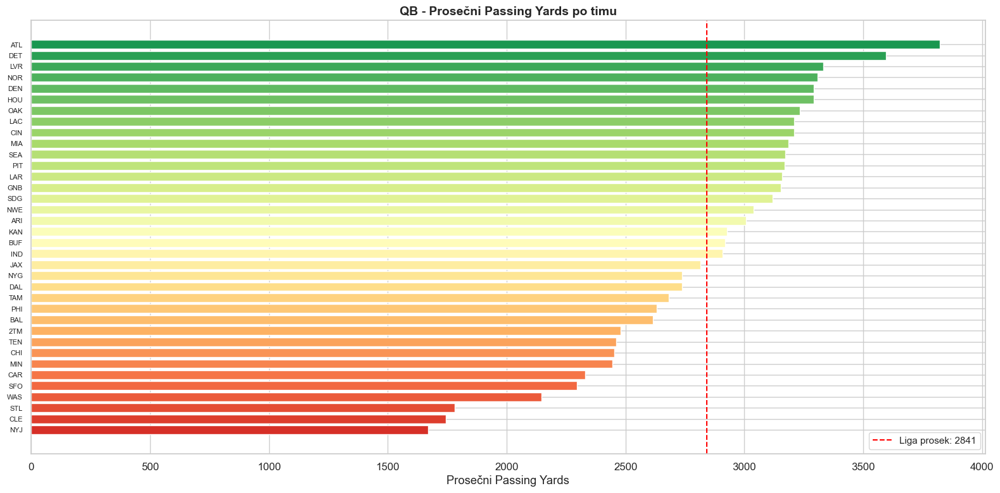

In [88]:
# QB - Prosecni Passing Yards po timu
fig, ax = plt.subplots(figsize=(16, 8))
qb_team = qb.groupby('Team')['Yds'].mean().sort_values(ascending=True)
colors = plt.cm.RdYlGn(np.linspace(0.1, 0.9, len(qb_team)))
ax.barh(range(len(qb_team)), qb_team.values, color=colors)
ax.set_yticks(range(len(qb_team)))
ax.set_yticklabels(qb_team.index, fontsize=8)
ax.set_xlabel('Prosečni Passing Yards')
ax.set_title('QB - Prosečni Passing Yards po timu', fontsize=14, fontweight='bold')
ax.axvline(qb['Yds'].mean(), color='red', linestyle='--', linewidth=1.5, label=f'Liga prosek: {qb["Yds"].mean():.0f}')
ax.legend(fontsize=11)
plt.tight_layout()
plt.show()

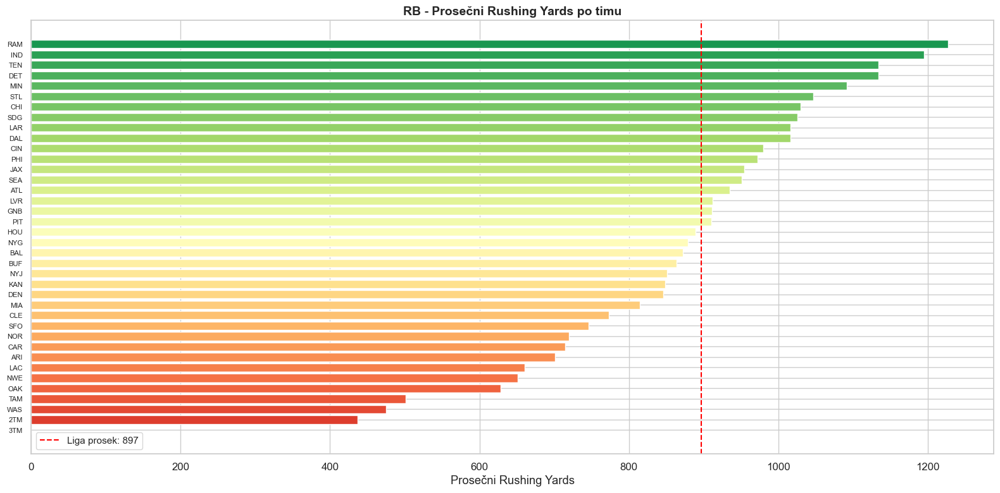

In [89]:
# RB - Prosecni Rushing Yards po timu
fig, ax = plt.subplots(figsize=(16, 8))
rb_team = rb.groupby('Team')['Rush_Yds'].mean().sort_values(ascending=True)
colors = plt.cm.RdYlGn(np.linspace(0.1, 0.9, len(rb_team)))
ax.barh(range(len(rb_team)), rb_team.values, color=colors)
ax.set_yticks(range(len(rb_team)))
ax.set_yticklabels(rb_team.index, fontsize=8)
ax.set_xlabel('Prosečni Rushing Yards')
ax.set_title('RB - Prosečni Rushing Yards po timu', fontsize=14, fontweight='bold')
ax.axvline(rb['Rush_Yds'].mean(), color='red', linestyle='--', linewidth=1.5, label=f'Liga prosek: {rb["Rush_Yds"].mean():.0f}')
ax.legend(fontsize=11)
plt.tight_layout()
plt.show()

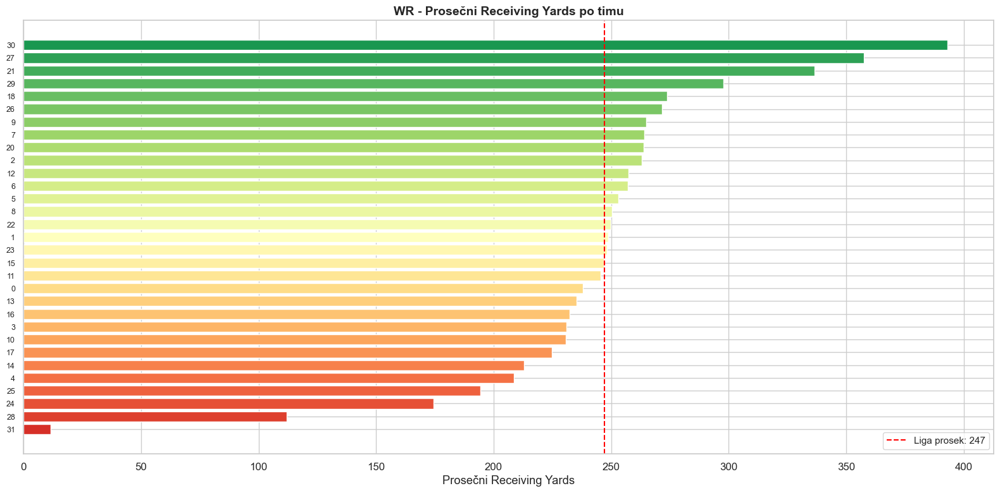

In [90]:
# WR - Top 20 timova po prosecnim Receiving Yards
fig, ax = plt.subplots(figsize=(16, 8))
wr_team = wr.groupby('posteam')['receiving_yards'].mean().sort_values(ascending=True)
colors = plt.cm.RdYlGn(np.linspace(0.1, 0.9, len(wr_team)))
ax.barh(range(len(wr_team)), wr_team.values, color=colors)
ax.set_yticks(range(len(wr_team)))
ax.set_yticklabels(wr_team.index, fontsize=9)
ax.set_xlabel('Prosečni Receiving Yards')
ax.set_title('WR - Prosečni Receiving Yards po timu', fontsize=14, fontweight='bold')
ax.axvline(wr['receiving_yards'].mean(), color='red', linestyle='--', linewidth=1.5, label=f'Liga prosek: {wr["receiving_yards"].mean():.0f}')
ax.legend(fontsize=11)
plt.tight_layout()
plt.show()

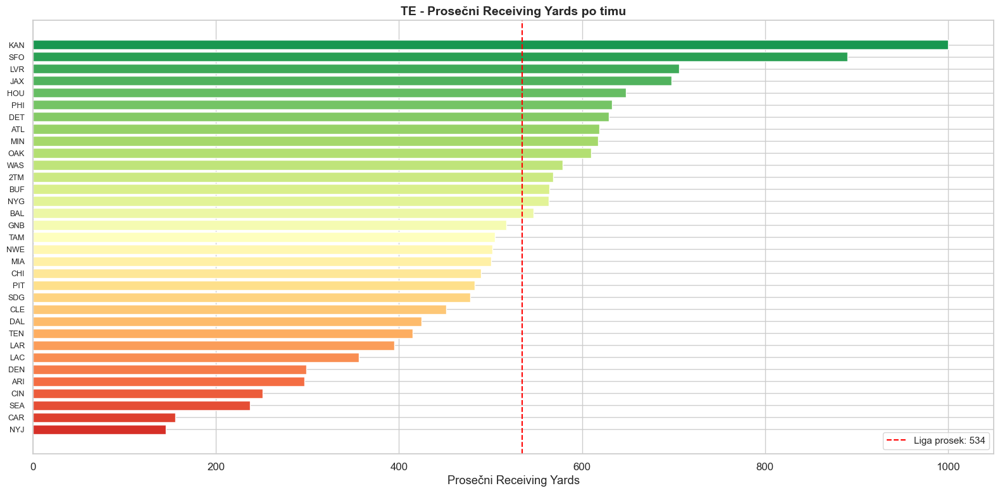

In [91]:
# TE - Prosecni Receiving Yards po timu
fig, ax = plt.subplots(figsize=(16, 8))
te_team = te.groupby('Team')['Rec_Yds'].mean().sort_values(ascending=True)
colors = plt.cm.RdYlGn(np.linspace(0.1, 0.9, len(te_team)))
ax.barh(range(len(te_team)), te_team.values, color=colors)
ax.set_yticks(range(len(te_team)))
ax.set_yticklabels(te_team.index, fontsize=9)
ax.set_xlabel('Prosečni Receiving Yards')
ax.set_title('TE - Prosečni Receiving Yards po timu', fontsize=14, fontweight='bold')
ax.axvline(te['Rec_Yds'].mean(), color='red', linestyle='--', linewidth=1.5, label=f'Liga prosek: {te["Rec_Yds"].mean():.0f}')
ax.legend(fontsize=11)
plt.tight_layout()
plt.show()

### Zaključak - Analiza po timovima

Vizuelizacija yard produkcije po timovima otkriva:

- **QB:** Postoji značajna varijacija između timova. Timovi sa stabilnim franchise QB-ovima (Colts/Manning, Saints/Brees, Chiefs/Mahomes) imaju više proseke. Timovi koji su često menjali QB-ove imaju niže i nekonzistentnije proseke.
- **RB:** Razlike između timova su manje naglašene nego kod QB-a, jer RB produkcija zavisi i od kvaliteta ofanzivne linije, ne samo od individualnog talenta.
- **WR/TE:** Timska distribucija yardi reflektuje ofanzivne šeme – pass-heavy timovi (Tampa Bay, Kansas City) prirodno imaju više WR/TE yardi.

**Napomena:** Timska analiza može da zamaskira individualne performanse – jedan tim može imati visok prosek zbog jednog dominantnog igrača, a ne zbog ukupne dubine rostera.

---
## 8. Odnos Starost (Age) – Yards

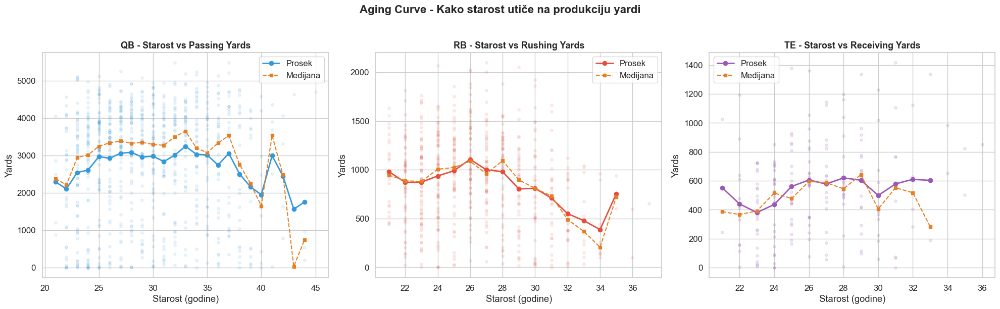

In [92]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# QB - Age vs Passing Yds
ax = axes[0]
age_qb = qb.groupby('Age')['Yds'].agg(['mean', 'median', 'count']).reset_index()
age_qb = age_qb[age_qb['count'] >= 3]  # Minimum 3 zapisa
ax.plot(age_qb['Age'], age_qb['mean'], 'o-', color='#3498db', linewidth=2, markersize=6, label='Prosek')
ax.plot(age_qb['Age'], age_qb['median'], 's--', color='#e67e22', linewidth=1.5, markersize=4, label='Medijana')
ax.set_title('QB - Starost vs Passing Yards', fontsize=13, fontweight='bold')
ax.set_xlabel('Starost (godine)')
ax.set_ylabel('Yards')
ax.legend()

# Dodaj scatter tačke u pozadini
ax.scatter(qb['Age'], qb['Yds'], alpha=0.1, color='#3498db', s=15)

# RB - Age vs Rushing Yds
ax = axes[1]
age_rb = rb.groupby('Age')['Rush_Yds'].agg(['mean', 'median', 'count']).reset_index()
age_rb = age_rb[age_rb['count'] >= 3]
ax.plot(age_rb['Age'], age_rb['mean'], 'o-', color='#e74c3c', linewidth=2, markersize=6, label='Prosek')
ax.plot(age_rb['Age'], age_rb['median'], 's--', color='#e67e22', linewidth=1.5, markersize=4, label='Medijana')
ax.set_title('RB - Starost vs Rushing Yards', fontsize=13, fontweight='bold')
ax.set_xlabel('Starost (godine)')
ax.set_ylabel('Yards')
ax.legend()
ax.scatter(rb['Age'], rb['Rush_Yds'], alpha=0.1, color='#e74c3c', s=15)

# TE - Age vs Receiving Yds
ax = axes[2]
age_te = te.groupby('Age')['Rec_Yds'].agg(['mean', 'median', 'count']).reset_index()
age_te = age_te[age_te['count'] >= 3]
ax.plot(age_te['Age'], age_te['mean'], 'o-', color='#9b59b6', linewidth=2, markersize=6, label='Prosek')
ax.plot(age_te['Age'], age_te['median'], 's--', color='#e67e22', linewidth=1.5, markersize=4, label='Medijana')
ax.set_title('TE - Starost vs Receiving Yards', fontsize=13, fontweight='bold')
ax.set_xlabel('Starost (godine)')
ax.set_ylabel('Yards')
ax.legend()
ax.scatter(te['Age'], te['Rec_Yds'], alpha=0.15, color='#9b59b6', s=15)

fig.suptitle('Aging Curve - Kako starost utiče na produkciju yardi', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

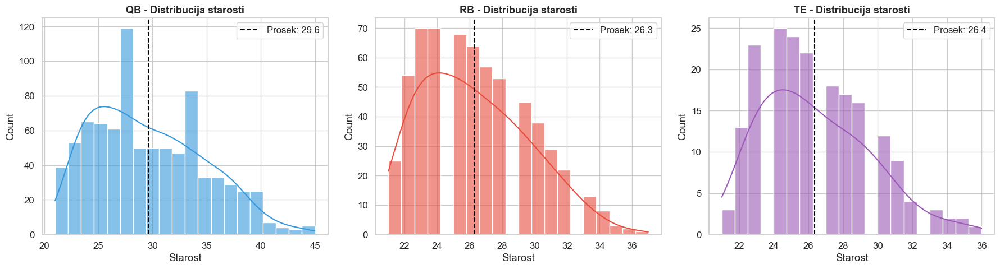

In [93]:
# Distribucija starosti igraca po poziciji
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, (df, col, title, color) in zip(axes, 
    [(qb, 'Age', 'QB', '#3498db'), (rb, 'Age', 'RB', '#e74c3c'), (te, 'Age', 'TE', '#9b59b6')]):
    sns.histplot(df[col].dropna(), bins=20, color=color, kde=True, ax=ax, alpha=0.6)
    ax.axvline(df[col].mean(), color='black', linestyle='--', linewidth=1.5,
              label=f'Prosek: {df[col].mean():.1f}')
    ax.set_title(f'{title} - Distribucija starosti', fontsize=13, fontweight='bold')
    ax.set_xlabel('Starost')
    ax.legend()

plt.tight_layout()
plt.show()

### Zaključak - Starost vs Yards (Aging Curve)

Aging curve analiza pruža fundamentalne uvide o trajektoriji karijera:

- **QB:** Peak performans je između 27-32 godine. Iskustvo igra veliku ulogu – mladi QB-ovi (22-24) imaju niže proseke jer se još razvijaju, dok QB-ovi posle 35+ pokazuju postepeni pad, mada elite QB-ovi (Brady, Brees) mogu održavati visok nivo i do 40+.
- **RB:** Najkraći peak – između 23-27 godina. Pad nakon 28. godine je dramatičan (poznata "RB cliff"). Fizički zahtevi pozicije (kontakti, nošenja) uzimaju danak brže nego kod ostalih pozicija.
- **TE:** Peak je između 25-30 godina, sa sporijim padom nego kod RB-ova. TE pozicija kombinuje fizičke zahteve (blokiranje) sa tehničkom sposobnošću (hvatanje), što omogućava duže karijere.

**Distribucija starosti:** Histogrami pokazuju da je prosečna starost svih pozicija slična (~26-27 godina), ali sa različitim repovima distribucije. QB ima najduži rep udesno (najduže karijere).

**Implikacija za modeliranje:** `Age` je potencijalno važan feature, ali njegov odnos sa yardima je nelinearan (obrnut U oblik). Polinomijalne transformacije ili interakcione varijable sa starošću mogu poboljšati model.

---
## 9. Scatter plotovi - Ključni odnosi

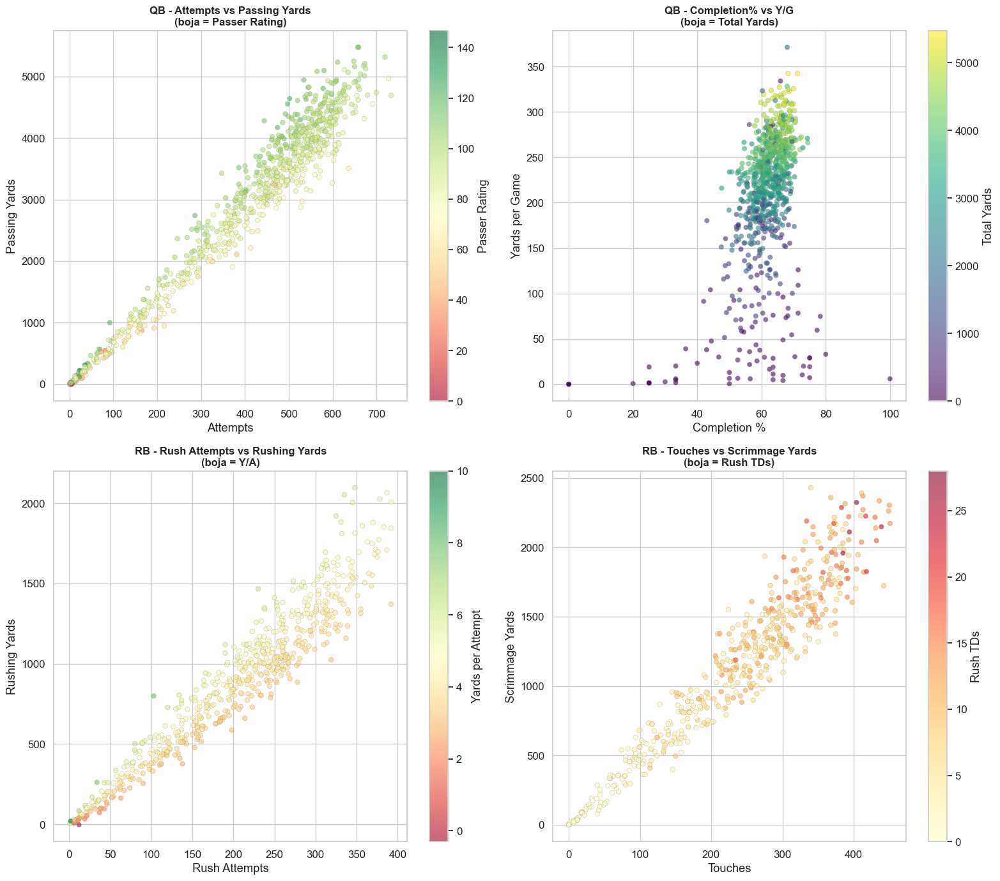

In [94]:
# QB: Attempts vs Passing Yards (sa bojom po passer ratingu)
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# QB: Att vs Yds
ax = axes[0, 0]
sc = ax.scatter(qb['Att'], qb['Yds'], c=qb['Rate'], cmap='RdYlGn', alpha=0.6, s=30, edgecolors='gray', linewidth=0.3)
plt.colorbar(sc, ax=ax, label='Passer Rating')
ax.set_xlabel('Attempts')
ax.set_ylabel('Passing Yards')
ax.set_title('QB - Attempts vs Passing Yards\n(boja = Passer Rating)', fontsize=12, fontweight='bold')

# QB: Completion% vs Yards/Game
ax = axes[0, 1]
sc = ax.scatter(qb['Cmp%'], qb['Y/G'], c=qb['Yds'], cmap='viridis', alpha=0.6, s=30, edgecolors='gray', linewidth=0.3)
plt.colorbar(sc, ax=ax, label='Total Yards')
ax.set_xlabel('Completion %')
ax.set_ylabel('Yards per Game')
ax.set_title('QB - Completion% vs Y/G\n(boja = Total Yards)', fontsize=12, fontweight='bold')

# RB: Attempts vs Rushing Yards
ax = axes[1, 0]
sc = ax.scatter(rb['Rush_Att'], rb['Rush_Yds'], c=rb['Rush_Y/A'], cmap='RdYlGn', alpha=0.6, s=30, edgecolors='gray', linewidth=0.3)
plt.colorbar(sc, ax=ax, label='Yards per Attempt')
ax.set_xlabel('Rush Attempts')
ax.set_ylabel('Rushing Yards')
ax.set_title('RB - Rush Attempts vs Rushing Yards\n(boja = Y/A)', fontsize=12, fontweight='bold')

# RB: Touches vs Scrimmage Yards
ax = axes[1, 1]
sc = ax.scatter(rb['Touches'], rb['Scrimmage_Yds'], c=rb['Rush_TD'], cmap='YlOrRd', alpha=0.6, s=30, edgecolors='gray', linewidth=0.3)
plt.colorbar(sc, ax=ax, label='Rush TDs')
ax.set_xlabel('Touches')
ax.set_ylabel('Scrimmage Yards')
ax.set_title('RB - Touches vs Scrimmage Yards\n(boja = Rush TDs)', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

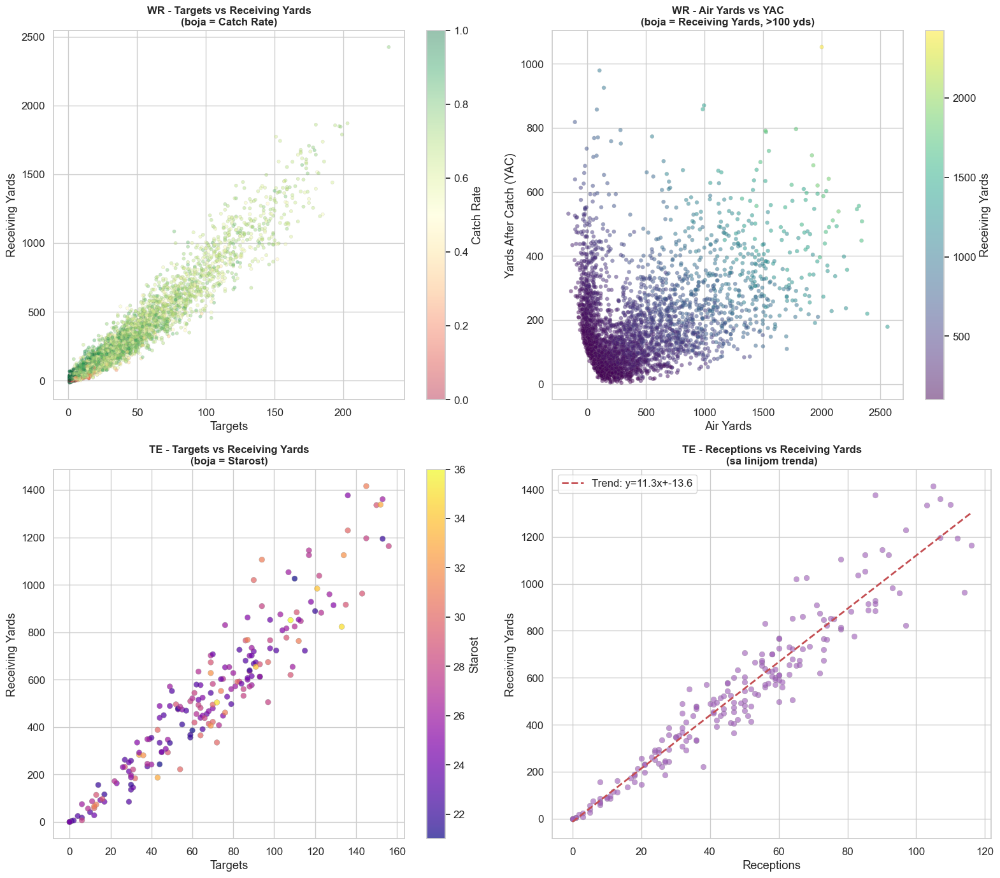

In [95]:
# WR i TE scatter plotovi
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# WR: Targets vs Receiving Yards
ax = axes[0, 0]
sc = ax.scatter(wr['targets'], wr['receiving_yards'], c=wr['catch_rate'], cmap='RdYlGn', 
                alpha=0.4, s=15, edgecolors='gray', linewidth=0.2)
plt.colorbar(sc, ax=ax, label='Catch Rate')
ax.set_xlabel('Targets')
ax.set_ylabel('Receiving Yards')
ax.set_title('WR - Targets vs Receiving Yards\n(boja = Catch Rate)', fontsize=12, fontweight='bold')

# WR: Air Yards vs YAC
ax = axes[0, 1]
wr_filtered = wr[wr['receiving_yards'] > 100]  # filter za jasnocu
sc = ax.scatter(wr_filtered['air_yards'], wr_filtered['yac'], c=wr_filtered['receiving_yards'], 
                cmap='viridis', alpha=0.5, s=20, edgecolors='gray', linewidth=0.2)
plt.colorbar(sc, ax=ax, label='Receiving Yards')
ax.set_xlabel('Air Yards')
ax.set_ylabel('Yards After Catch (YAC)')
ax.set_title('WR - Air Yards vs YAC\n(boja = Receiving Yards, >100 yds)', fontsize=12, fontweight='bold')

# TE: Targets vs Receiving Yards
ax = axes[1, 0]
sc = ax.scatter(te['Tgt'], te['Rec_Yds'], c=te['Age'], cmap='plasma', alpha=0.7, s=40, edgecolors='gray', linewidth=0.3)
plt.colorbar(sc, ax=ax, label='Starost')
ax.set_xlabel('Targets')
ax.set_ylabel('Receiving Yards')
ax.set_title('TE - Targets vs Receiving Yards\n(boja = Starost)', fontsize=12, fontweight='bold')

# TE: Receptions vs Yards (sa linijom trenda)
ax = axes[1, 1]
ax.scatter(te['Rec'], te['Rec_Yds'], color='#9b59b6', alpha=0.6, s=40, edgecolors='gray', linewidth=0.3)
# Linija trenda
z = np.polyfit(te['Rec'].dropna(), te.loc[te['Rec'].notna(), 'Rec_Yds'], 1)
p = np.poly1d(z)
x_range = np.linspace(te['Rec'].min(), te['Rec'].max(), 100)
ax.plot(x_range, p(x_range), 'r--', linewidth=2, label=f'Trend: y={z[0]:.1f}x+{z[1]:.1f}')
ax.set_xlabel('Receptions')
ax.set_ylabel('Receiving Yards')
ax.set_title('TE - Receptions vs Receiving Yards\n(sa linijom trenda)', fontsize=12, fontweight='bold')
ax.legend()

plt.tight_layout()
plt.show()

### Zaključak - Scatter plotovi

Scatter plotovi sa višedimenzionalnim prikazom (treća dimenzija kroz boju) otkrivaju:

- **QB Attempts vs Yards:** Gotovo linearan odnos – više pokušaja = više yardi. Boja (Passer Rating) pokazuje da igrači sa visokim ratingom ne moraju nužno imati najviše pokušaja, ali generalno ostvaruju bolje rezultate.
- **QB Completion% vs Y/G:** Klaster u gornjoj desnoj zoni (visok Cmp%, visok Y/G) predstavlja elite QB performanse. Zanimljivo je da sam completion procenat ne garantuje visoke yarde – volumen je i dalje ključan.
- **RB Rush Attempts vs Yards:** Jasna linearna veza sa Y/A (yards per attempt) kao modulatorom – RB-ovi sa istim brojem pokušaja mogu imati drastično različite ukupne yarde u zavisnosti od efikasnosti.
- **WR Targets vs Yards:** Širok scatter ukazuje na to da samo od targetsa ne zavisi produkcija – catch rate, dubina ruta i YAC značajno variraju.
- **TE Receptions vs Yards:** Linija trenda (prikazana u crvenom) daje koeficijent nagiba koji približno odgovara prosečnim yardima po hvatanju za TE poziciju.

**Ključni uvid:** Odnos između obimnih metrika (attempts/targets) i yardi je jak ali ne savršen – efikasnost (Y/A, catch rate, YAC) dodaje varijaciju koja je vredna za predikciju.

---
## 10. Pairplot - Ključne varijable

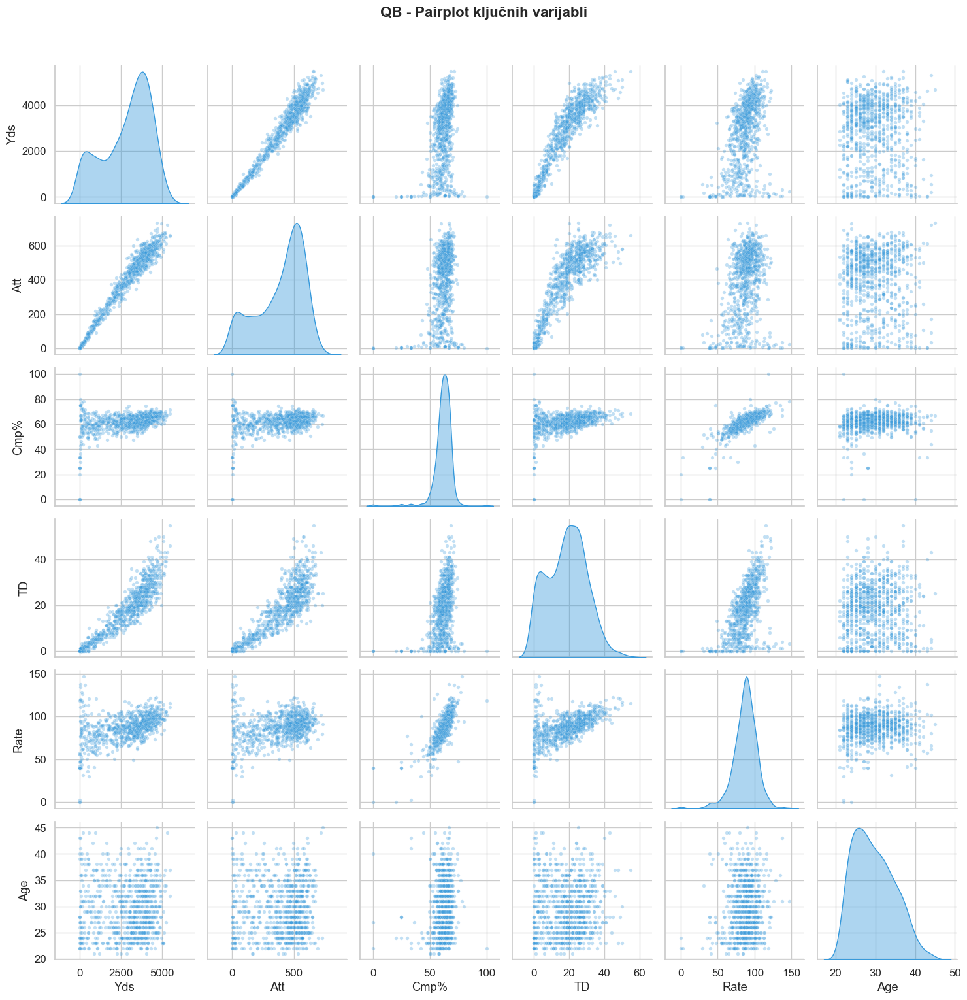

In [96]:
# QB Pairplot
qb_pair_cols = ['Yds', 'Att', 'Cmp%', 'TD', 'Rate', 'Age']
qb_pair = qb[qb_pair_cols].dropna()

g = sns.pairplot(qb_pair, diag_kind='kde', plot_kws={'alpha': 0.3, 's': 15, 'color': '#3498db'},
                 diag_kws={'color': '#3498db', 'fill': True, 'alpha': 0.4})
g.figure.suptitle('QB - Pairplot ključnih varijabli', y=1.02, fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

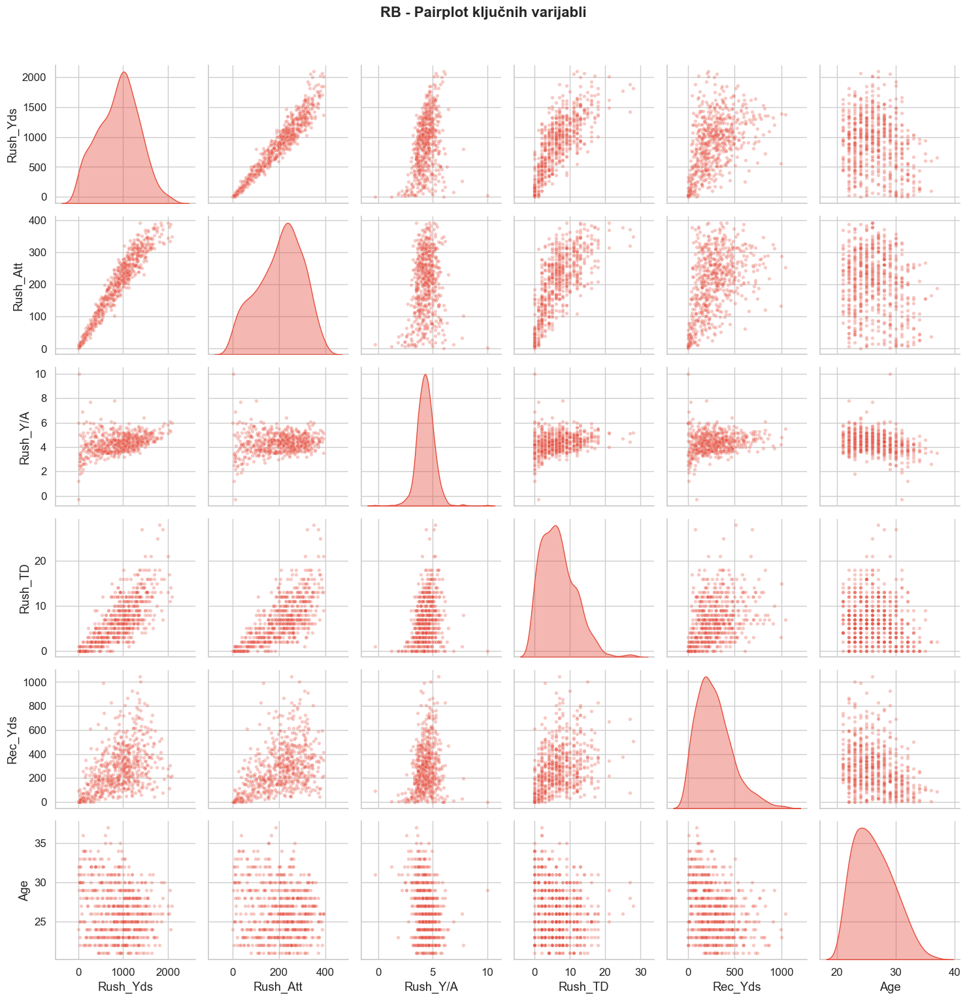

In [97]:
# RB Pairplot
rb_pair_cols = ['Rush_Yds', 'Rush_Att', 'Rush_Y/A', 'Rush_TD', 'Rec_Yds', 'Age']
rb_pair = rb[rb_pair_cols].dropna()

g = sns.pairplot(rb_pair, diag_kind='kde', plot_kws={'alpha': 0.3, 's': 15, 'color': '#e74c3c'},
                 diag_kws={'color': '#e74c3c', 'fill': True, 'alpha': 0.4})
g.figure.suptitle('RB - Pairplot ključnih varijabli', y=1.02, fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

### Zaključak - Pairplot analiza

Pairplotovi pružaju sveobuhvatan pogled na međusobne odnose ključnih varijabli:

- **QB:** Jasne linearne veze između `Yds`, `Att`, `TD` i `Cmp%`. KDE dijagonale pokazuju bimodalnost za neke varijable (posebno `Yds` i `Att`), što odražava podelu između startera i rezervi. `Age` nema jaku linearnu vezu sa ostalim varijablama, ali KDE otkriva normalnu distribuciju.
- **RB:** `Rush_Yds` i `Rush_Att` imaju najjaču linearnu vezu. `Rush_Y/A` ima zanimljivu distribuciju – koncentrisana oko 3.5-4.5 sa outlierima na obe strane. `Rec_Yds` (primljeni yardi) su slabo korelirane sa `Rush_Yds`, što znači da rushing i receiving sposobnosti nisu nužno povezane.

**Ključni uvid:** Pairplotovi vizuelno potvrđuju multikolinearitet identifikovan u korelacionoj analizi – mnogi parovi prediktora su visoko korelirani, što zahteva regularizaciju u modelu.

---
## 11. Efikasnost igrača - Yards per Game / per Attempt

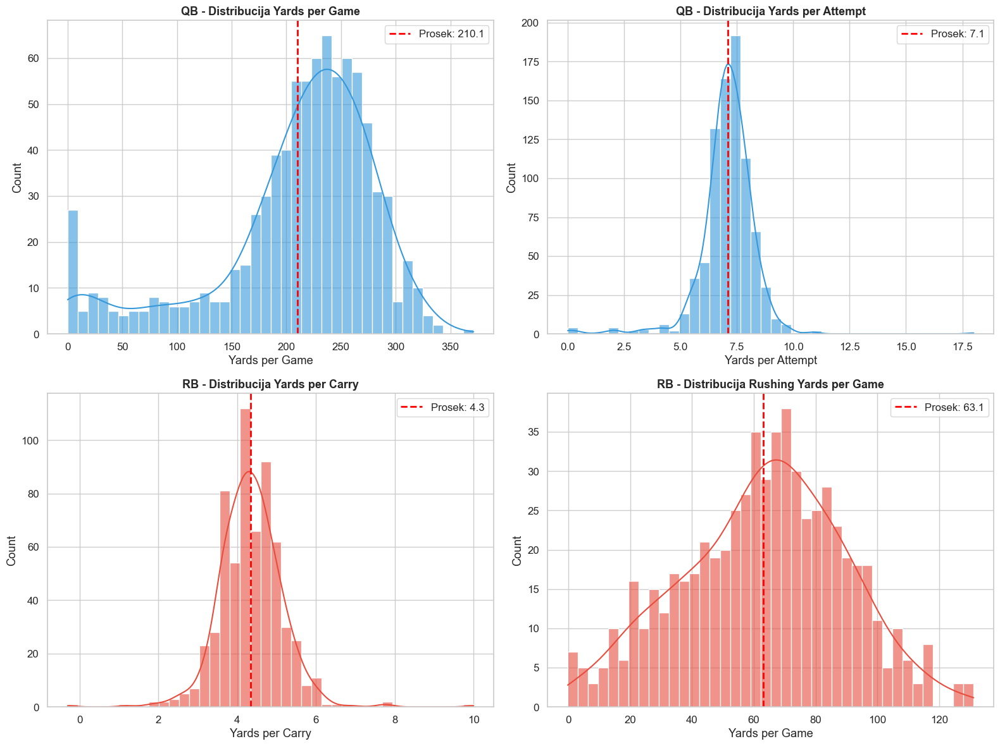

In [98]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# QB - Yards per Game distribucija
ax = axes[0, 0]
sns.histplot(qb['Y/G'].dropna(), bins=40, color='#3498db', kde=True, ax=ax, alpha=0.6)
ax.axvline(qb['Y/G'].mean(), color='red', linestyle='--', linewidth=2, label=f'Prosek: {qb["Y/G"].mean():.1f}')
ax.set_title('QB - Distribucija Yards per Game', fontsize=13, fontweight='bold')
ax.set_xlabel('Yards per Game')
ax.legend()

# QB - Yards per Attempt distribucija
ax = axes[0, 1]
sns.histplot(qb['Y/A'].dropna(), bins=40, color='#3498db', kde=True, ax=ax, alpha=0.6)
ax.axvline(qb['Y/A'].mean(), color='red', linestyle='--', linewidth=2, label=f'Prosek: {qb["Y/A"].mean():.1f}')
ax.set_title('QB - Distribucija Yards per Attempt', fontsize=13, fontweight='bold')
ax.set_xlabel('Yards per Attempt')
ax.legend()

# RB - Yards per Carry distribucija
ax = axes[1, 0]
sns.histplot(rb['Rush_Y/A'].dropna(), bins=40, color='#e74c3c', kde=True, ax=ax, alpha=0.6)
ax.axvline(rb['Rush_Y/A'].mean(), color='red', linestyle='--', linewidth=2, label=f'Prosek: {rb["Rush_Y/A"].mean():.1f}')
ax.set_title('RB - Distribucija Yards per Carry', fontsize=13, fontweight='bold')
ax.set_xlabel('Yards per Carry')
ax.legend()

# RB - Yards per Game distribucija
ax = axes[1, 1]
sns.histplot(rb['Rush_Y/G'].dropna(), bins=40, color='#e74c3c', kde=True, ax=ax, alpha=0.6)
ax.axvline(rb['Rush_Y/G'].mean(), color='red', linestyle='--', linewidth=2, label=f'Prosek: {rb["Rush_Y/G"].mean():.1f}')
ax.set_title('RB - Distribucija Rushing Yards per Game', fontsize=13, fontweight='bold')
ax.set_xlabel('Yards per Game')
ax.legend()

plt.tight_layout()
plt.show()

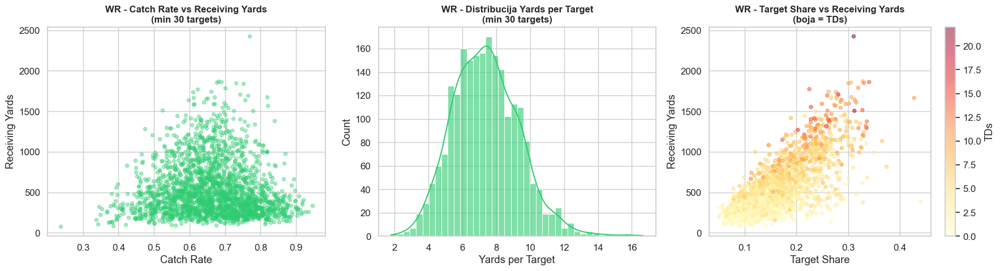

In [99]:
# WR efikasnost metriki
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# WR - Catch Rate vs Receiving Yards (samo igraci sa >30 targets)
ax = axes[0]
wr_eff = wr[wr['targets'] >= 30].copy()
ax.scatter(wr_eff['catch_rate'], wr_eff['receiving_yards'], alpha=0.4, color='#2ecc71', s=20)
ax.set_xlabel('Catch Rate')
ax.set_ylabel('Receiving Yards')
ax.set_title('WR - Catch Rate vs Receiving Yards\n(min 30 targets)', fontsize=12, fontweight='bold')

# WR - Yards per Target distribucija
ax = axes[1]
sns.histplot(wr_eff['yards_per_target'].dropna(), bins=40, color='#2ecc71', kde=True, ax=ax, alpha=0.6)
ax.set_title('WR - Distribucija Yards per Target\n(min 30 targets)', fontsize=12, fontweight='bold')
ax.set_xlabel('Yards per Target')

# WR - Target Share vs Receiving Yards
ax = axes[2]
sc = ax.scatter(wr_eff['target_share'], wr_eff['receiving_yards'], c=wr_eff['tds'], 
                cmap='YlOrRd', alpha=0.5, s=20)
plt.colorbar(sc, ax=ax, label='TDs')
ax.set_xlabel('Target Share')
ax.set_ylabel('Receiving Yards')
ax.set_title('WR - Target Share vs Receiving Yards\n(boja = TDs)', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

### Zaključak - Efikasnost igrača

Analiza metrika efikasnosti nadopunjuje volumen metriku:

- **QB Y/G (Yards per Game):** Distribucija je unimodalna sa prosekom oko 200 Y/G. Ovo je korisna metrika jer normalizuje za broj odigranih utakmica – igrač sa 3000 yardi u 16 utakmica je produktivniji od igrača sa 3000 yardi u 17 utakmica.
- **QB Y/A (Yards per Attempt):** Prosek oko 7 Y/A. Ovo je čista mera efikasnosti odvojena od obima igre.
- **RB Y/A (Yards per Carry):** Uska distribucija oko 4.0-4.5, što ukazuje da je ova metrika relativno konzistentna među RB starterima. Outlieri (>6 Y/A ili <3 Y/A) su često igrači sa malim uzorkom pokušaja.
- **RB Y/G:** Šira distribucija nego Y/A, jer zavisi i od obima dodela i od efikasnosti.
- **WR metriki:** Catch rate vs yards scatter pokazuje da visok catch rate sam po sebi ne garantuje visoke yarde – dubina ruta i YAC su jednako bitni. Target share ima bolju korelaciju sa yardima – što veći udeo u ciljanjima tima, to više yardi.

**Ključni uvid:** Per-game i per-attempt metriki su odlični za poređenje igrača, ali za predikciju sezonskih ukupnih yardi, volumenske metriki (attempts, targets) imaju jaču prediktivnu moć.

---
## 12. Analiza po kvartalima igre (WR dataset)

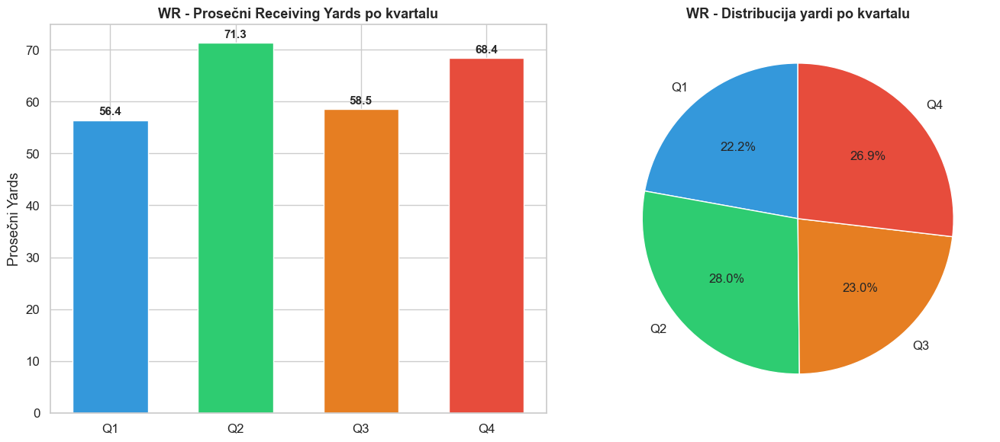

In [100]:
# WR - Yards po kvartalu igre
wr_q_cols = ['yards_Q1', 'yards_Q2', 'yards_Q3', 'yards_Q4']
wr_quarters = wr[wr_q_cols].mean()

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Bar chart
ax = axes[0]
colors_q = ['#3498db', '#2ecc71', '#e67e22', '#e74c3c']
bars = ax.bar(['Q1', 'Q2', 'Q3', 'Q4'], wr_quarters.values, color=colors_q, edgecolor='white', width=0.6)
for bar, val in zip(bars, wr_quarters.values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{val:.1f}', 
            ha='center', fontsize=11, fontweight='bold')
ax.set_title('WR - Prosečni Receiving Yards po kvartalu', fontsize=13, fontweight='bold')
ax.set_ylabel('Prosečni Yards')

# Pie chart
ax = axes[1]
ax.pie(wr_quarters.values, labels=['Q1', 'Q2', 'Q3', 'Q4'], colors=colors_q, 
       autopct='%1.1f%%', startangle=90, textprops={'fontsize': 12})
ax.set_title('WR - Distribucija yardi po kvartalu', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

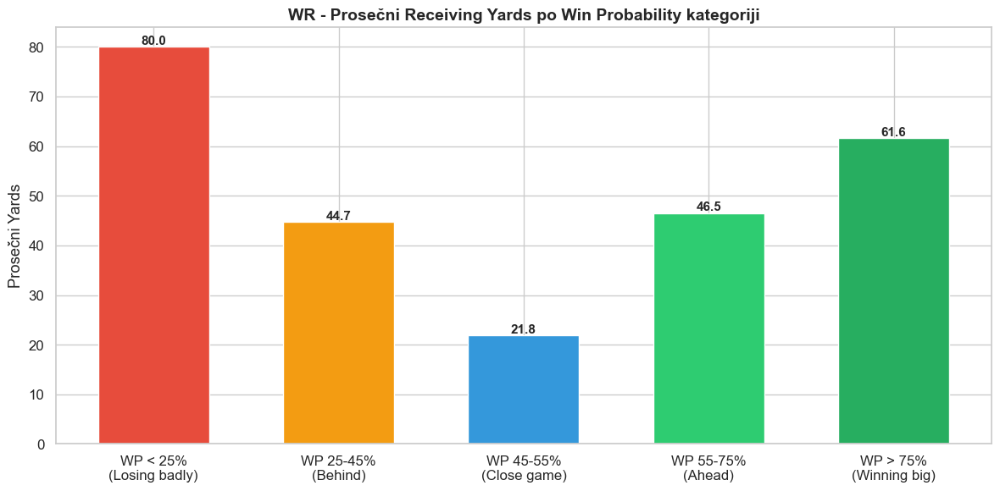

In [101]:
# WR - Yards po Win Probability kategorijama
wr_wp_cols = ['yards_wp_<25', 'yards_wp_25_45', 'yards_wp_45_55', 'yards_wp_55_75', 'yards_wp_>75']
wr_wp_means = wr[wr_wp_cols].mean()

fig, ax = plt.subplots(figsize=(12, 6))
wp_labels = ['WP < 25%\n(Losing badly)', 'WP 25-45%\n(Behind)', 'WP 45-55%\n(Close game)', 
             'WP 55-75%\n(Ahead)', 'WP > 75%\n(Winning big)']
colors_wp = ['#e74c3c', '#f39c12', '#3498db', '#2ecc71', '#27ae60']
bars = ax.bar(wp_labels, wr_wp_means.values, color=colors_wp, edgecolor='white', width=0.6)
for bar, val in zip(bars, wr_wp_means.values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5, f'{val:.1f}', 
            ha='center', fontsize=11, fontweight='bold')
ax.set_title('WR - Prosečni Receiving Yards po Win Probability kategoriji', fontsize=14, fontweight='bold')
ax.set_ylabel('Prosečni Yards')
plt.tight_layout()
plt.show()

### Zaključak - Analiza po kvartalima i Win Probability

**Kvartali igre (WR):**
- Distribucija yardi je relativno ravnomerna između kvartala, sa blagom prednosti za Q2 i Q3. Ovo sugerise da WR produkcija nije drastično zavisna od faze igre, mada blagi pad u Q4 može biti rezultat timova koji trče loptu kada vode.

**Win Probability kategorije (WR):**
- Igrači akumuliraju više yardi u bliskim igrama (WP 45-55%) nego u jednosmernim utakmicama. Kada tim vodi ubedljivo (WP >75%), prelazi se na trčeću igru pa WR yardi padaju. Kada tim zaostaje (WP <25%), povećava se volumen dodavanja ali i defanzivni pritisak, što ograničava efikasnost.
- Srednji WP opsezi produciraju najviše yardi jer obe ekipe aktivno igraju svoju regularnu ofanzivnu šemu.

**Implikacija:** Kontekst utakmice utiče na individualnu produkciju. Za precizniej modeliranje, mogli bismo uključiti timske situacione faktore kao feature-e.

---
## 13. Outlier analiza

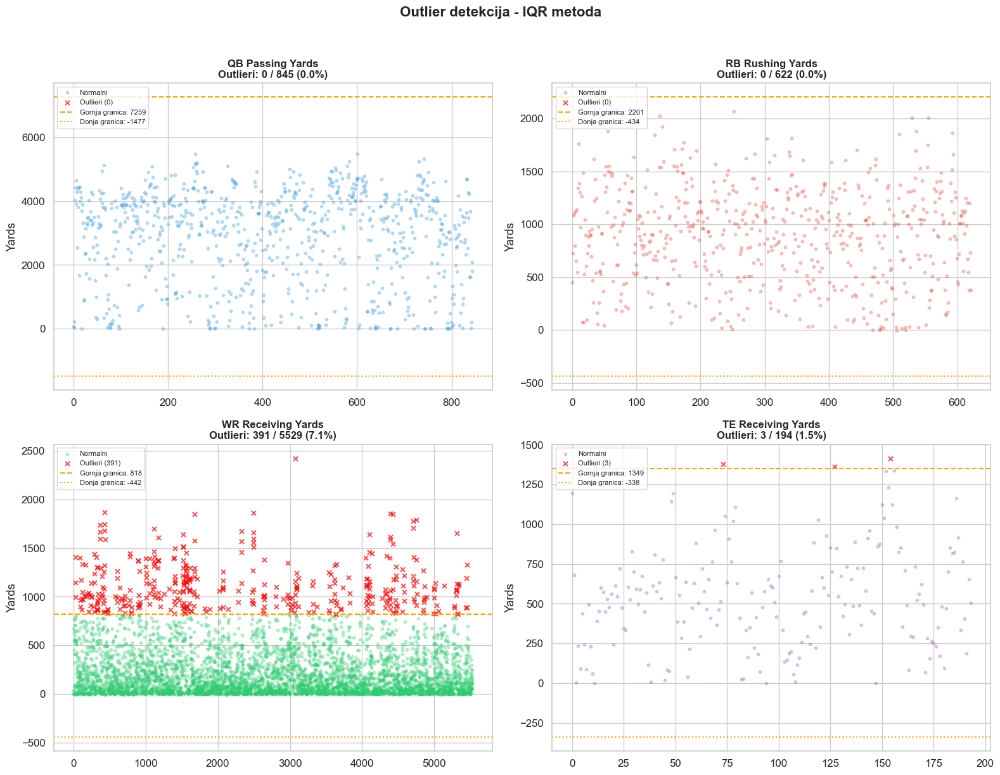

In [102]:
def detect_outliers_iqr(data, col):
    """Detektuje outlier-e koristeci IQR metodu."""
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = data[(data[col] < lower) | (data[col] > upper)]
    return outliers, lower, upper

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

for ax, (df, col, title, color, name_col) in zip(axes.flat, [
    (qb, 'Yds', 'QB Passing Yards', '#3498db', 'Player'),
    (rb, 'Rush_Yds', 'RB Rushing Yards', '#e74c3c', 'Player'),
    (wr, 'receiving_yards', 'WR Receiving Yards', '#2ecc71', 'receiver_player_name'),
    (te, 'Rec_Yds', 'TE Receiving Yards', '#9b59b6', 'Player')
]):
    outliers, lower, upper = detect_outliers_iqr(df, col)
    
    # Scatter normalne tacke
    normal = df[~df.index.isin(outliers.index)]
    ax.scatter(normal.index, normal[col], alpha=0.3, color=color, s=10, label='Normalni')
    ax.scatter(outliers.index, outliers[col], alpha=0.7, color='red', s=25, 
              marker='x', label=f'Outlieri ({len(outliers)})')
    
    ax.axhline(upper, color='orange', linestyle='--', label=f'Gornja granica: {upper:.0f}')
    ax.axhline(lower, color='orange', linestyle=':', label=f'Donja granica: {lower:.0f}')
    
    ax.set_title(f'{title}\nOutlieri: {len(outliers)} / {len(df)} ({len(outliers)/len(df)*100:.1f}%)', 
                fontsize=12, fontweight='bold')
    ax.set_ylabel('Yards')
    ax.legend(fontsize=8, loc='upper left')

fig.suptitle('Outlier detekcija - IQR metoda', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

### Zaključak - Outlier analiza (IQR metoda)

IQR metoda detektuje outlier-e na osnovu interkvartilnog raspona:

- **QB Passing Yards:** Mali broj outlier-a (uglavnom na donjem kraju) – igrači sa nepunim sezonama.
- **RB Rushing Yards:** Slični rezultati – donji outlieri su backup RB-ovi ili povređeni igrači.
- **WR Receiving Yards:** Značajan procenat "outlier-a" na donjem kraju jer WR dataset uključuje sve primače lopte, uključujući one sa minimalnom produkcijom.
- **TE Receiving Yards:** Najmanji ukupni broj outlier-a zbog manjeg uzorka.

**KRITIČAN UVID:** IQR metoda označava mnoge igrače kao outlier-e, ali ovi "niski outlieri" nisu anomalije u pravom smislu – to su igrači koji su propustili utakmice zbog povreda ili su imali ograničenu ulogu. **Uklanjanje ovih tačaka bi bilo pogrešno** jer bi eliminisalo legitimne podatke o igračima sa skraćenim sezonama. Bolji pristup je **normalizacija po broju utakmica** (yards per game), što je analizirano u sledećem delu.

---
## 13a. Prosečni Yards po utakmici (Yards per Game) – Detaljnija analiza

Umesto ukupnih sezonskih yardi, prosek po utakmici (Y/G) normalizuje za broj odigranih utakmica i pruža pravedniju sliku produktivnosti igrača. Ovo je posebno korisno za poređenje igrača koji su propustili utakmice usled povreda.

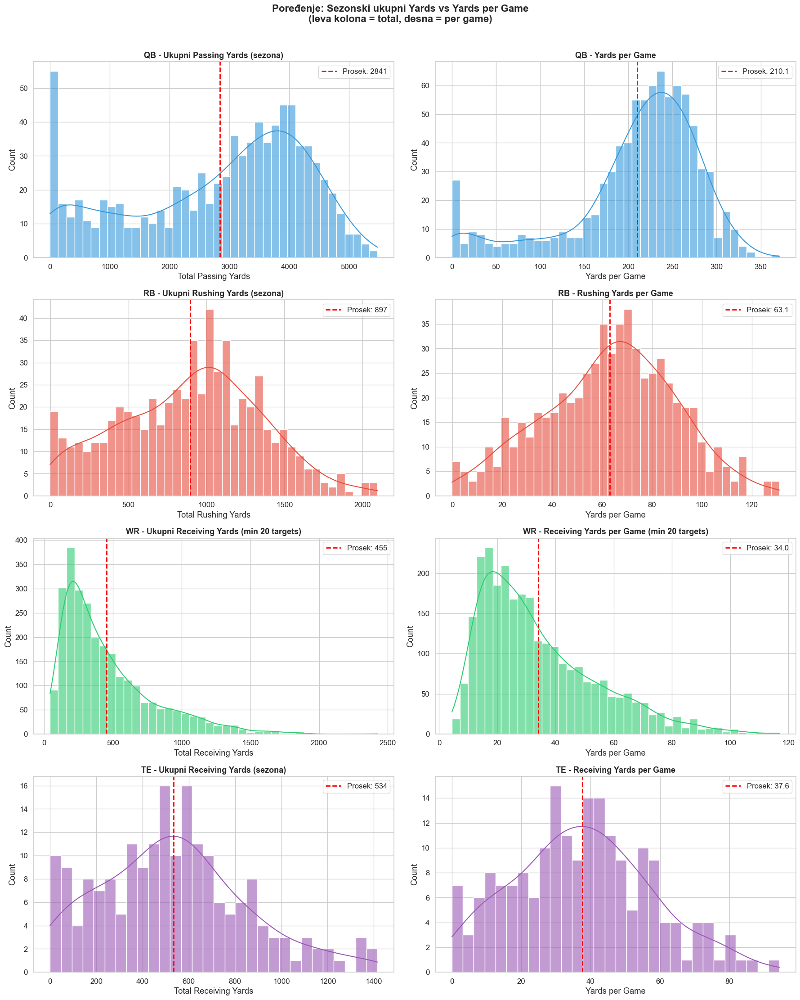

In [103]:
# Izračunavanje Yards per Game za sve pozicije
# QB i RB već imaju Y/G kolonu, za WR i TE je računamo

# WR - Yards per Game (receiving_yards / games_played)
wr['ypg'] = wr['receiving_yards'] / wr['games_played'].replace(0, np.nan)

# TE - Yards per Game (Rec_Yds / G)
te['ypg'] = te['Rec_Yds'] / te['G'].replace(0, np.nan)

# ===== DISTRIBUCIJE Y/G vs SEZONSKIH YARDI =====
fig, axes = plt.subplots(4, 2, figsize=(18, 22))

# QB
ax = axes[0, 0]
sns.histplot(qb['Yds'].dropna(), bins=40, color='#3498db', kde=True, ax=ax, alpha=0.6)
ax.axvline(qb['Yds'].mean(), color='red', linestyle='--', linewidth=2, label=f'Prosek: {qb["Yds"].mean():.0f}')
ax.set_title('QB - Ukupni Passing Yards (sezona)', fontsize=13, fontweight='bold')
ax.set_xlabel('Total Passing Yards')
ax.legend()

ax = axes[0, 1]
sns.histplot(qb['Y/G'].dropna(), bins=40, color='#3498db', kde=True, ax=ax, alpha=0.6)
ax.axvline(qb['Y/G'].mean(), color='red', linestyle='--', linewidth=2, label=f'Prosek: {qb["Y/G"].mean():.1f}')
ax.set_title('QB - Yards per Game', fontsize=13, fontweight='bold')
ax.set_xlabel('Yards per Game')
ax.legend()

# RB
ax = axes[1, 0]
sns.histplot(rb['Rush_Yds'].dropna(), bins=40, color='#e74c3c', kde=True, ax=ax, alpha=0.6)
ax.axvline(rb['Rush_Yds'].mean(), color='red', linestyle='--', linewidth=2, label=f'Prosek: {rb["Rush_Yds"].mean():.0f}')
ax.set_title('RB - Ukupni Rushing Yards (sezona)', fontsize=13, fontweight='bold')
ax.set_xlabel('Total Rushing Yards')
ax.legend()

ax = axes[1, 1]
sns.histplot(rb['Rush_Y/G'].dropna(), bins=40, color='#e74c3c', kde=True, ax=ax, alpha=0.6)
ax.axvline(rb['Rush_Y/G'].mean(), color='red', linestyle='--', linewidth=2, label=f'Prosek: {rb["Rush_Y/G"].mean():.1f}')
ax.set_title('RB - Rushing Yards per Game', fontsize=13, fontweight='bold')
ax.set_xlabel('Yards per Game')
ax.legend()

# WR
ax = axes[2, 0]
wr_sig_ypg = wr[wr['targets'] >= 20]
sns.histplot(wr_sig_ypg['receiving_yards'].dropna(), bins=40, color='#2ecc71', kde=True, ax=ax, alpha=0.6)
ax.axvline(wr_sig_ypg['receiving_yards'].mean(), color='red', linestyle='--', linewidth=2, 
           label=f'Prosek: {wr_sig_ypg["receiving_yards"].mean():.0f}')
ax.set_title('WR - Ukupni Receiving Yards (min 20 targets)', fontsize=13, fontweight='bold')
ax.set_xlabel('Total Receiving Yards')
ax.legend()

ax = axes[2, 1]
sns.histplot(wr_sig_ypg['ypg'].dropna(), bins=40, color='#2ecc71', kde=True, ax=ax, alpha=0.6)
ax.axvline(wr_sig_ypg['ypg'].mean(), color='red', linestyle='--', linewidth=2, 
           label=f'Prosek: {wr_sig_ypg["ypg"].mean():.1f}')
ax.set_title('WR - Receiving Yards per Game (min 20 targets)', fontsize=13, fontweight='bold')
ax.set_xlabel('Yards per Game')
ax.legend()

# TE
ax = axes[3, 0]
sns.histplot(te['Rec_Yds'].dropna(), bins=30, color='#9b59b6', kde=True, ax=ax, alpha=0.6)
ax.axvline(te['Rec_Yds'].mean(), color='red', linestyle='--', linewidth=2, label=f'Prosek: {te["Rec_Yds"].mean():.0f}')
ax.set_title('TE - Ukupni Receiving Yards (sezona)', fontsize=13, fontweight='bold')
ax.set_xlabel('Total Receiving Yards')
ax.legend()

ax = axes[3, 1]
sns.histplot(te['ypg'].dropna(), bins=30, color='#9b59b6', kde=True, ax=ax, alpha=0.6)
ax.axvline(te['ypg'].mean(), color='red', linestyle='--', linewidth=2, label=f'Prosek: {te["ypg"].mean():.1f}')
ax.set_title('TE - Receiving Yards per Game', fontsize=13, fontweight='bold')
ax.set_xlabel('Yards per Game')
ax.legend()

fig.suptitle('Poređenje: Sezonski ukupni Yards vs Yards per Game\n(leva kolona = total, desna = per game)', 
             fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

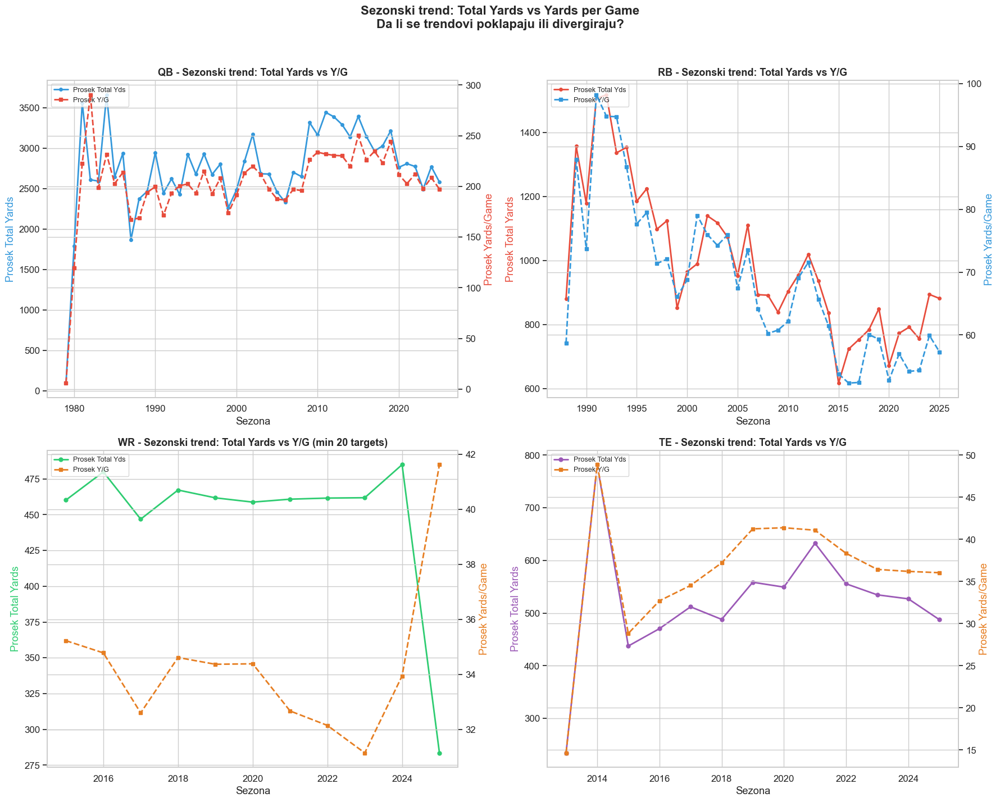

In [104]:
# ===== SEZONSKI TREND: Total Yards vs Yards per Game =====
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# QB - Trend
ax = axes[0, 0]
qb_trend_ypg = qb.groupby('Season').agg({'Yds': 'mean', 'Y/G': 'mean'}).reset_index()
ax.plot(qb_trend_ypg['Season'], qb_trend_ypg['Yds'], 'o-', color='#3498db', linewidth=2, markersize=4, label='Prosek Total Yds')
ax2_qb = ax.twinx()
ax2_qb.plot(qb_trend_ypg['Season'], qb_trend_ypg['Y/G'], 's--', color='#e74c3c', linewidth=2, markersize=4, label='Prosek Y/G')
ax.set_title('QB - Sezonski trend: Total Yards vs Y/G', fontsize=13, fontweight='bold')
ax.set_xlabel('Sezona')
ax.set_ylabel('Prosek Total Yards', color='#3498db')
ax2_qb.set_ylabel('Prosek Yards/Game', color='#e74c3c')
lines1, labels1 = ax.get_legend_handles_labels()
lines2, labels2 = ax2_qb.get_legend_handles_labels()
ax.legend(lines1 + lines2, labels1 + labels2, loc='upper left', fontsize=9)

# RB - Trend
ax = axes[0, 1]
rb_trend_ypg = rb.groupby('Season').agg({'Rush_Yds': 'mean', 'Rush_Y/G': 'mean'}).reset_index()
ax.plot(rb_trend_ypg['Season'], rb_trend_ypg['Rush_Yds'], 'o-', color='#e74c3c', linewidth=2, markersize=4, label='Prosek Total Yds')
ax2_rb = ax.twinx()
ax2_rb.plot(rb_trend_ypg['Season'], rb_trend_ypg['Rush_Y/G'], 's--', color='#3498db', linewidth=2, markersize=4, label='Prosek Y/G')
ax.set_title('RB - Sezonski trend: Total Yards vs Y/G', fontsize=13, fontweight='bold')
ax.set_xlabel('Sezona')
ax.set_ylabel('Prosek Total Yards', color='#e74c3c')
ax2_rb.set_ylabel('Prosek Yards/Game', color='#3498db')
lines1, labels1 = ax.get_legend_handles_labels()
lines2, labels2 = ax2_rb.get_legend_handles_labels()
ax.legend(lines1 + lines2, labels1 + labels2, loc='upper left', fontsize=9)

# WR - Trend
ax = axes[1, 0]
wr_trend_ypg = wr_sig_ypg.groupby('season').agg({'receiving_yards': 'mean', 'ypg': 'mean'}).reset_index()
ax.plot(wr_trend_ypg['season'], wr_trend_ypg['receiving_yards'], 'o-', color='#2ecc71', linewidth=2, markersize=5, label='Prosek Total Yds')
ax2_wr = ax.twinx()
ax2_wr.plot(wr_trend_ypg['season'], wr_trend_ypg['ypg'], 's--', color='#e67e22', linewidth=2, markersize=5, label='Prosek Y/G')
ax.set_title('WR - Sezonski trend: Total Yards vs Y/G (min 20 targets)', fontsize=13, fontweight='bold')
ax.set_xlabel('Sezona')
ax.set_ylabel('Prosek Total Yards', color='#2ecc71')
ax2_wr.set_ylabel('Prosek Yards/Game', color='#e67e22')
lines1, labels1 = ax.get_legend_handles_labels()
lines2, labels2 = ax2_wr.get_legend_handles_labels()
ax.legend(lines1 + lines2, labels1 + labels2, loc='upper left', fontsize=9)

# TE - Trend
ax = axes[1, 1]
te_trend_ypg = te.groupby('Season').agg({'Rec_Yds': 'mean', 'ypg': 'mean'}).reset_index()
ax.plot(te_trend_ypg['Season'], te_trend_ypg['Rec_Yds'], 'o-', color='#9b59b6', linewidth=2, markersize=5, label='Prosek Total Yds')
ax2_te = ax.twinx()
ax2_te.plot(te_trend_ypg['Season'], te_trend_ypg['ypg'], 's--', color='#e67e22', linewidth=2, markersize=5, label='Prosek Y/G')
ax.set_title('TE - Sezonski trend: Total Yards vs Y/G', fontsize=13, fontweight='bold')
ax.set_xlabel('Sezona')
ax.set_ylabel('Prosek Total Yards', color='#9b59b6')
ax2_te.set_ylabel('Prosek Yards/Game', color='#e67e22')
lines1, labels1 = ax.get_legend_handles_labels()
lines2, labels2 = ax2_te.get_legend_handles_labels()
ax.legend(lines1 + lines2, labels1 + labels2, loc='upper left', fontsize=9)

fig.suptitle('Sezonski trend: Total Yards vs Yards per Game\nDa li se trendovi poklapaju ili divergiraju?', 
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

### Zaključak - Yards per Game analiza

**Poređenje distribucija (leva vs desna kolona):**
- **Total Yards** (levo) imaju šire distribucije sa dugačkim repovima i izraženim outlierima – razlog: igrači sa manje utakmica imaju niže ukupne yarde, ali to ne znači da su lošiji igrači.
- **Yards per Game** (desno) imaju kompaktniju distribuciju jer normalizuju za broj utakmica. Ovo daje pravedniju sliku produktivnosti: igrač sa 1000 yardi u 8 utakmica (125 Y/G) je produktivniji od igrača sa 1200 yardi u 16 utakmica (75 Y/G).

**Sezonski trendovi (Total vs Y/G):**
- Kada se total yards i Y/G upoređuju kroz sezone, obično se kreću u istom smeru (oba rastu ili padaju zajedno).
- Međutim, **divergencije su informativne** – ako total yards rastu ali Y/G stagnira, to može značiti da je viši total posledica više odigranih utakmica (17 vs 16 game sezona), a ne realno veće produktivnosti.
- Y/G trend je "čistiji" indikator prave promene produktivnosti jer eliminiše efekat dužine sezone.

**Ključni uvid:** Y/G je bolji metric za poređenje igrača i era, dok su Total Yards korisni za apsolutnu produkciju. Za modeliranje, oba su vredna – ali Y/G može biti robustniji target za predikciju jer je manje osetljiv na broj utakmica.

---
## 13b. Povrede i Per-Game prosek – Alternativa uklanjanju outlier-a

Klasičan pristup u data science-u je uklanjanje outlier-a. Međutim, u kontekstu NFL podataka to je problematično jer mnogi "outlieri" (igrači sa niskom produkcijom) su zapravo povređeni igrači ili igrači koji su igrali samo deo sezone. **Uklanjanje ovih tačaka eliminiše legitimne podatke.**

Alternativni pristup: **korišćenje prosečnih yardi po utakmici (Y/G) umesto ukupnih sezonskih yardi** kao ciljne varijable ili feature-a. Ovo prirodno normalizuje za broj odigranih utakmica i nudi bolje rešenje od klasičnog uklanjanja outlier-a.

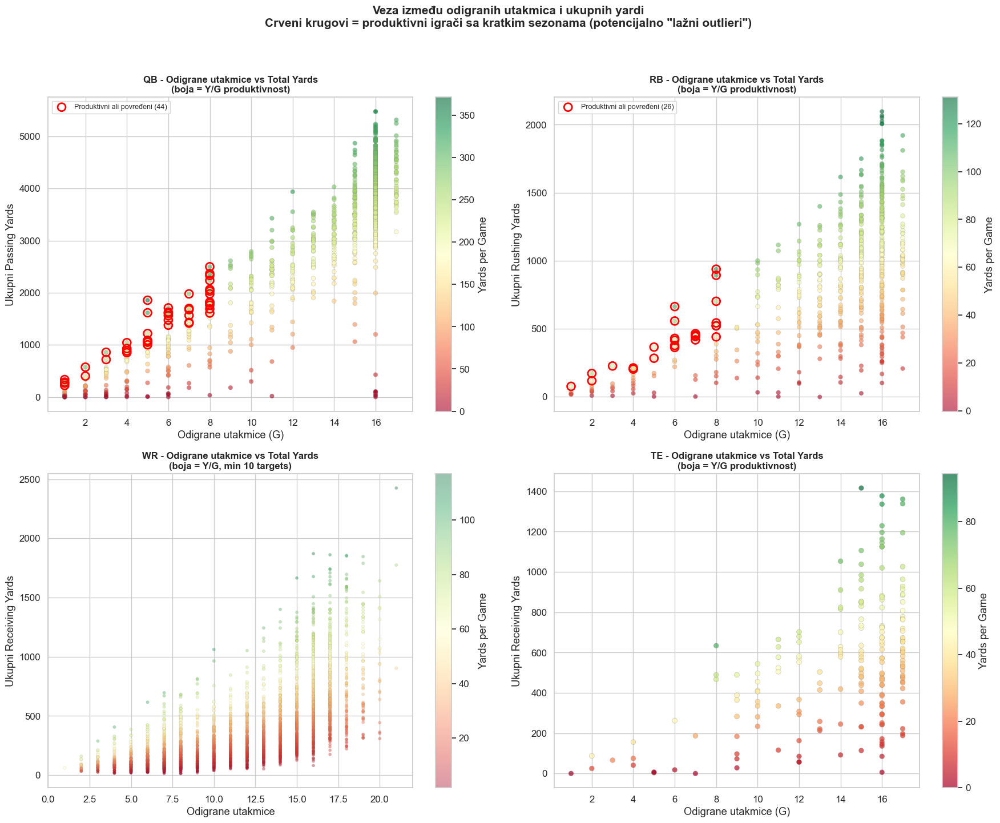

In [105]:
# ===== DEMONSTRACIJA: Games vs Total Yards - Uticaj povreda =====
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# QB - Games vs Yards (boja po Y/G)
ax = axes[0, 0]
qb_valid = qb[qb['G'].notna() & qb['Yds'].notna() & qb['Y/G'].notna()].copy()
sc = ax.scatter(qb_valid['G'], qb_valid['Yds'], c=qb_valid['Y/G'], cmap='RdYlGn', 
                alpha=0.6, s=30, edgecolors='gray', linewidth=0.3)
plt.colorbar(sc, ax=ax, label='Yards per Game')
ax.set_xlabel('Odigrane utakmice (G)')
ax.set_ylabel('Ukupni Passing Yards')
ax.set_title('QB - Odigrane utakmice vs Total Yards\n(boja = Y/G produktivnost)', fontsize=12, fontweight='bold')
# Označi "lažne outliere" - visok Y/G ali nizak total
qb_injured = qb_valid[(qb_valid['G'] <= 8) & (qb_valid['Y/G'] >= 200)]
if len(qb_injured) > 0:
    ax.scatter(qb_injured['G'], qb_injured['Yds'], facecolors='none', edgecolors='red', 
              s=100, linewidth=2, label=f'Produktivni ali povređeni ({len(qb_injured)})')
    ax.legend(fontsize=9)

# RB - Games vs Yards
ax = axes[0, 1]
rb_valid = rb[rb['G'].notna() & rb['Rush_Yds'].notna() & rb['Rush_Y/G'].notna()].copy()
sc = ax.scatter(rb_valid['G'], rb_valid['Rush_Yds'], c=rb_valid['Rush_Y/G'], cmap='RdYlGn', 
                alpha=0.6, s=30, edgecolors='gray', linewidth=0.3)
plt.colorbar(sc, ax=ax, label='Yards per Game')
ax.set_xlabel('Odigrane utakmice (G)')
ax.set_ylabel('Ukupni Rushing Yards')
ax.set_title('RB - Odigrane utakmice vs Total Yards\n(boja = Y/G produktivnost)', fontsize=12, fontweight='bold')
rb_injured = rb_valid[(rb_valid['G'] <= 8) & (rb_valid['Rush_Y/G'] >= 50)]
if len(rb_injured) > 0:
    ax.scatter(rb_injured['G'], rb_injured['Rush_Yds'], facecolors='none', edgecolors='red', 
              s=100, linewidth=2, label=f'Produktivni ali povređeni ({len(rb_injured)})')
    ax.legend(fontsize=9)

# WR - Games vs Yards
ax = axes[1, 0]
wr_valid = wr[wr['games_played'].notna() & wr['receiving_yards'].notna() & wr['ypg'].notna() & (wr['targets'] >= 10)].copy()
sc = ax.scatter(wr_valid['games_played'], wr_valid['receiving_yards'], c=wr_valid['ypg'], cmap='RdYlGn', 
                alpha=0.4, s=15, edgecolors='gray', linewidth=0.2)
plt.colorbar(sc, ax=ax, label='Yards per Game')
ax.set_xlabel('Odigrane utakmice')
ax.set_ylabel('Ukupni Receiving Yards')
ax.set_title('WR - Odigrane utakmice vs Total Yards\n(boja = Y/G, min 10 targets)', fontsize=12, fontweight='bold')

# TE - Games vs Yards
ax = axes[1, 1]
te_valid = te[te['G'].notna() & te['Rec_Yds'].notna() & te['ypg'].notna()].copy()
sc = ax.scatter(te_valid['G'], te_valid['Rec_Yds'], c=te_valid['ypg'], cmap='RdYlGn', 
                alpha=0.7, s=40, edgecolors='gray', linewidth=0.3)
plt.colorbar(sc, ax=ax, label='Yards per Game')
ax.set_xlabel('Odigrane utakmice (G)')
ax.set_ylabel('Ukupni Receiving Yards')
ax.set_title('TE - Odigrane utakmice vs Total Yards\n(boja = Y/G produktivnost)', fontsize=12, fontweight='bold')

fig.suptitle('Veza između odigranih utakmica i ukupnih yardi\nCrveni krugovi = produktivni igrači sa kratkim sezonama (potencijalno "lažni outlieri")', 
             fontsize=15, fontweight='bold', y=1.03)
plt.tight_layout()
plt.show()

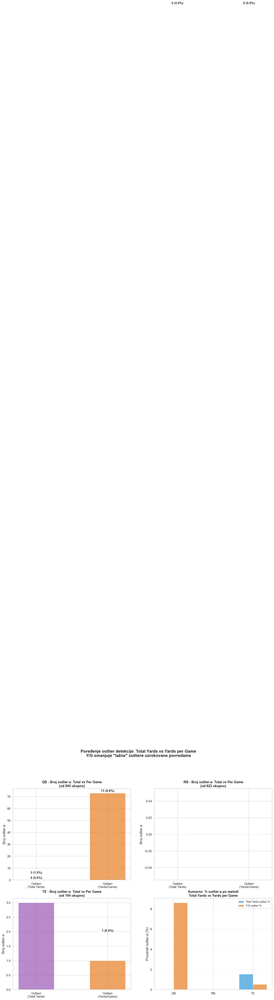

In [106]:
# ===== KLJUČNO POREĐENJE: Outlieri u Total Yards vs Outlieri u Y/G =====
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

datasets_compare = [
    (qb, 'Yds', 'Y/G', 'QB', '#3498db', 'Player'),
    (rb, 'Rush_Yds', 'Rush_Y/G', 'RB', '#e74c3c', 'Player'),
    (te, 'Rec_Yds', 'ypg', 'TE', '#9b59b6', 'Player')
]

for idx, (df, total_col, ypg_col, pos, color, name_col) in enumerate(datasets_compare):
    # Outlieri u total yards
    Q1_t = df[total_col].quantile(0.25)
    Q3_t = df[total_col].quantile(0.75)
    IQR_t = Q3_t - Q1_t
    outliers_total = df[(df[total_col] < Q1_t - 1.5 * IQR_t) | (df[total_col] > Q3_t + 1.5 * IQR_t)]
    
    # Outlieri u Y/G
    ypg_data = df[ypg_col].dropna()
    Q1_g = ypg_data.quantile(0.25)
    Q3_g = ypg_data.quantile(0.75)
    IQR_g = Q3_g - Q1_g
    outliers_ypg = df[(df[ypg_col] < Q1_g - 1.5 * IQR_g) | (df[ypg_col] > Q3_g + 1.5 * IQR_g)]
    
    # Bar chart poređenje
    ax = axes.flat[idx]
    bars = ax.bar(['Outlieri\n(Total Yards)', 'Outlieri\n(Yards/Game)'], 
                  [len(outliers_total), len(outliers_ypg)], 
                  color=[color, '#e67e22'], alpha=0.7, width=0.5, edgecolor='white')
    
    for bar, val, total in zip(bars, [len(outliers_total), len(outliers_ypg)], [len(df), len(df)]):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, 
                f'{val} ({val/total*100:.1f}%)', ha='center', fontsize=12, fontweight='bold')
    
    ax.set_title(f'{pos} - Broj outlier-a: Total vs Per Game\n(od {len(df)} ukupno)', 
                fontsize=13, fontweight='bold')
    ax.set_ylabel('Broj outlier-a')

# Četvrti subplot - sumarni pregled
ax = axes.flat[3]
positions_names = ['QB', 'RB', 'TE']
outlier_total_pcts = []
outlier_ypg_pcts = []
for df, total_col, ypg_col, pos, color, name_col in datasets_compare:
    Q1_t = df[total_col].quantile(0.25); Q3_t = df[total_col].quantile(0.75); IQR_t = Q3_t - Q1_t
    ot = len(df[(df[total_col] < Q1_t - 1.5*IQR_t) | (df[total_col] > Q3_t + 1.5*IQR_t)])
    ypg_data = df[ypg_col].dropna()
    Q1_g = ypg_data.quantile(0.25); Q3_g = ypg_data.quantile(0.75); IQR_g = Q3_g - Q1_g
    og = len(df[(df[ypg_col] < Q1_g - 1.5*IQR_g) | (df[ypg_col] > Q3_g + 1.5*IQR_g)])
    outlier_total_pcts.append(ot/len(df)*100)
    outlier_ypg_pcts.append(og/len(df)*100)

x_pos = np.arange(len(positions_names))
width = 0.35
ax.bar(x_pos - width/2, outlier_total_pcts, width, label='Total Yards outlieri %', color='#3498db', alpha=0.7)
ax.bar(x_pos + width/2, outlier_ypg_pcts, width, label='Y/G outlieri %', color='#e67e22', alpha=0.7)
ax.set_xticks(x_pos)
ax.set_xticklabels(positions_names, fontsize=12)
ax.set_ylabel('Procenat outlier-a (%)')
ax.set_title('Sumarno: % outlier-a po metodi\nTotal Yards vs Yards per Game', fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(axis='y', alpha=0.3)

fig.suptitle('Poređenje outlier detekcije: Total Yards vs Yards per Game\nY/G smanjuje "lažne" outliere uzrokovane povredama', 
             fontsize=16, fontweight='bold', y=1.03)
plt.tight_layout()
plt.show()

In [107]:
# ===== KONKRETNI PRIMERI: Igrači koji bi bili uklonjeni kao outlieri =====
print('='*80)
print('PRIMERI IGRAČA KOJI BI BILI "OUTLIERI" PO TOTAL YARDS ALI SU PRODUKTIVNI PO Y/G')
print('='*80)

# QB primeri
print('\n--- QB: Igrači sa ≤8 utakmica ali visokim Y/G (≥200) ---')
qb_example = qb[(qb['G'] <= 8) & (qb['Y/G'] >= 200)][['Player', 'Season', 'G', 'GS', 'Yds', 'Y/G']].sort_values('Y/G', ascending=False)
if len(qb_example) > 0:
    display(qb_example.head(10))
    print(f'→ {len(qb_example)} QB-a imaju prosek ≥200 Y/G ali su odigrali ≤8 utakmica.')
    print('  Ovi igrači bi bili uklonjeni kao outlieri po ukupnim yardima, ali Y/G pokazuje da su produktivni!')
else:
    print('  Nema primera u ovom opsegu.')

# RB primeri
print('\n--- RB: Igrači sa ≤8 utakmica ali visokim Y/G (≥50) ---')
rb_example = rb[(rb['G'] <= 8) & (rb['Rush_Y/G'] >= 50)][['Player', 'Season', 'G', 'GS', 'Rush_Yds', 'Rush_Y/G']].sort_values('Rush_Y/G', ascending=False)
if len(rb_example) > 0:
    display(rb_example.head(10))
    print(f'→ {len(rb_example)} RB-a imaju prosek ≥50 Y/G ali su odigrali ≤8 utakmica.')
else:
    print('  Nema primera u ovom opsegu.')

# TE primeri
print('\n--- TE: Igrači sa ≤10 utakmica ali visokim Y/G (≥30) ---')
te_example = te[(te['G'] <= 10) & (te['ypg'] >= 30)][['Player', 'Season', 'G', 'GS', 'Rec_Yds', 'ypg']].sort_values('ypg', ascending=False)
if len(te_example) > 0:
    display(te_example.head(10))
    print(f'→ {len(te_example)} TE-a imaju prosek ≥30 Y/G ali su odigrali ≤10 utakmica.')
else:
    print('  Nema primera u ovom opsegu.')

print('\n' + '='*80)
print('ZAKLJUČAK: Ovi igrači su produktivni ali povređeni. Uklanjanje = gubitak informacija!')
print('Y/G zadržava njihovu pravu produktivnost u analizi.')
print('='*80)

PRIMERI IGRAČA KOJI BI BILI "OUTLIERI" PO TOTAL YARDS ALI SU PRODUKTIVNI PO Y/G

--- QB: Igrači sa ≤8 utakmica ali visokim Y/G (≥200) ---


,Player,Season,G,GS,Yds,Y/G
159,Dak Prescott,2020,5,5,1856,371.2
381,Jimmy Garoppolo,2024,1,1,334,334.0
404,Joe Flacco,2023,5,5,1616,323.2
562,Matthew Stafford,2019,8,8,2499,312.4
682,Ryan Fitzpatrick,2018,8,7,2366,295.8
473,Kirk Cousins,2023,8,8,2331,291.4
137,Cam Newton,2019,2,2,572,286.0
329,Jameis Winston,2022,3,3,858,286.0
464,Kirk Cousins,2014,6,5,1710,285.0
578,Patrick Mahomes,2017,1,1,284,284.0


→ 44 QB-a imaju prosek ≥200 Y/G ali su odigrali ≤8 utakmica.
  Ovi igrači bi bili uklonjeni kao outlieri po ukupnim yardima, ali Y/G pokazuje da su produktivni!

--- RB: Igrači sa ≤8 utakmica ali visokim Y/G (≥50) ---


,Player,Season,G,GS,Rush_Yds,Rush_Y/G
138,Derrick Henry,2021,8,8,937,117.1
475,Priest Holmes,2004,8,8,892,111.5
160,Edgerrin James,2001,6,6,662,110.3
350,Le'Veon Bell,2015,6,6,556,92.7
558,Terrell Davis,2001,8,8,701,87.6
465,Nick Chubb,2023,2,2,170,85.0
16,Adrian Peterson,2014,1,1,75,75.0
83,Christian McCaffrey,2020,3,3,225,75.0
246,Jamaal Charles,2015,5,5,364,72.8
297,Joe Mixon,2020,6,6,428,71.3


→ 26 RB-a imaju prosek ≥50 Y/G ali su odigrali ≤8 utakmica.

--- TE: Igrači sa ≤10 utakmica ali visokim Y/G (≥30) ---


,Player,Season,G,GS,Rec_Yds,ypg
75,George Kittle,2020,8,8,634,79.250000
162,Tucker Kraft,2025,8,8,489,61.125000
65,Evan Engram,2019,8,6,467,58.375000
129,Mark Andrews,2023,10,9,544,54.400000
139,Sam LaPorta,2025,9,9,489,54.333333
32,Dallas Goedert,2024,10,10,496,49.600000
145,T.J. Hockenson,2024,10,9,455,45.500000
174,Will Dissly,2019,6,6,262,43.666667
7,C.J. Uzomah,2020,2,2,87,43.500000
51,Darren Waller,2022,9,6,388,43.111111


→ 17 TE-a imaju prosek ≥30 Y/G ali su odigrali ≤10 utakmica.

ZAKLJUČAK: Ovi igrači su produktivni ali povređeni. Uklanjanje = gubitak informacija!
Y/G zadržava njihovu pravu produktivnost u analizi.


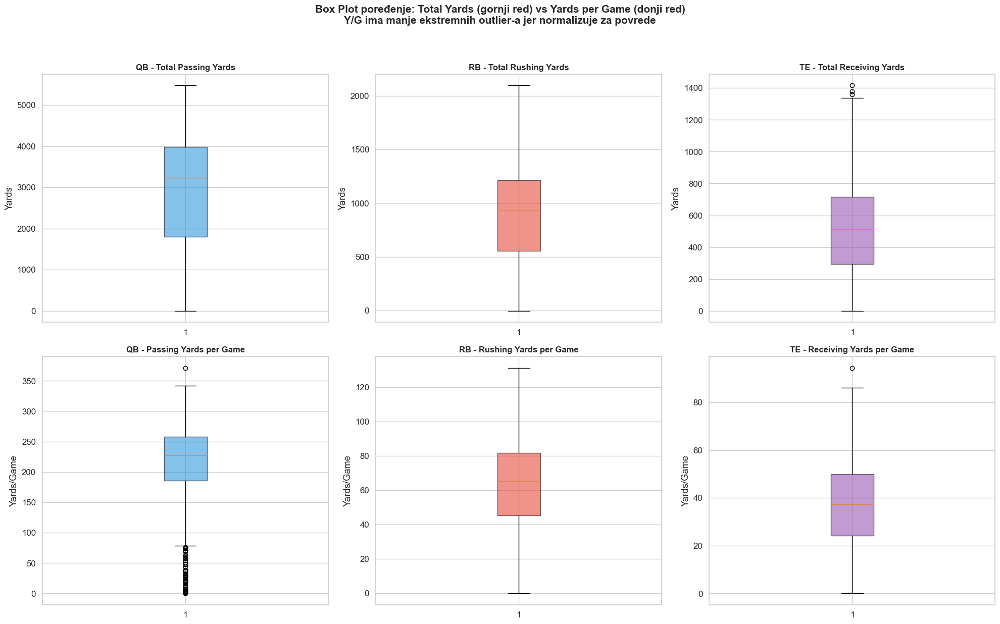

In [108]:
# ===== BOX PLOT: Total Yards vs Y/G - Vizuelno poređenje outlier-a =====
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# QB
ax = axes[0, 0]
bp = ax.boxplot([qb['Yds'].dropna()], patch_artist=True, boxprops=dict(facecolor='#3498db', alpha=0.6))
ax.set_title('QB - Total Passing Yards', fontsize=12, fontweight='bold')
ax.set_ylabel('Yards')

ax = axes[1, 0]
bp = ax.boxplot([qb['Y/G'].dropna()], patch_artist=True, boxprops=dict(facecolor='#3498db', alpha=0.6))
ax.set_title('QB - Passing Yards per Game', fontsize=12, fontweight='bold')
ax.set_ylabel('Yards/Game')

# RB
ax = axes[0, 1]
bp = ax.boxplot([rb['Rush_Yds'].dropna()], patch_artist=True, boxprops=dict(facecolor='#e74c3c', alpha=0.6))
ax.set_title('RB - Total Rushing Yards', fontsize=12, fontweight='bold')
ax.set_ylabel('Yards')

ax = axes[1, 1]
bp = ax.boxplot([rb['Rush_Y/G'].dropna()], patch_artist=True, boxprops=dict(facecolor='#e74c3c', alpha=0.6))
ax.set_title('RB - Rushing Yards per Game', fontsize=12, fontweight='bold')
ax.set_ylabel('Yards/Game')

# TE
ax = axes[0, 2]
bp = ax.boxplot([te['Rec_Yds'].dropna()], patch_artist=True, boxprops=dict(facecolor='#9b59b6', alpha=0.6))
ax.set_title('TE - Total Receiving Yards', fontsize=12, fontweight='bold')
ax.set_ylabel('Yards')

ax = axes[1, 2]
bp = ax.boxplot([te['ypg'].dropna()], patch_artist=True, boxprops=dict(facecolor='#9b59b6', alpha=0.6))
ax.set_title('TE - Receiving Yards per Game', fontsize=12, fontweight='bold')
ax.set_ylabel('Yards/Game')

fig.suptitle('Box Plot poređenje: Total Yards (gornji red) vs Yards per Game (donji red)\nY/G ima manje ekstremnih outlier-a jer normalizuje za povrede', 
             fontsize=15, fontweight='bold', y=1.03)
plt.tight_layout()
plt.show()

### Zaključak - Per-Game Normalizacija kao alternativa uklanjanju outlier-a

Ova analiza demonstrira zašto je **korišćenje proseka po utakmici (Y/G) bolje rešenje od uklanjanja outlier-a** za problem povreda u NFL podacima:

#### Problem sa uklanjanjem outlier-a:
1. **Gubi se informacija** – produktivni igrači sa kratkim sezonama (povrede) bivaju eliminisani, iako su po Y/G jednako dobri ili bolji od zdravih igrača.
2. **Pristrasnost dataseta** – favor se daje igračima koji su zdravi celu sezonu, ignorisuci talentovane igrače sklonije povredama.
3. **Smanjuje se uzorak** – posebno problematično za manje datasete (TE sa samo 194 reda).

#### Prednosti Per-Game normalizacije (Y/G):
1. **Zadržava sve podatke** – nijedan igrač se ne uklanja.
2. **Fer poređenje** – igrač sa 1500 yardi u 10 utakmica (150 Y/G) je ispravno rangiran iznad igrača sa 1600 yardi u 17 utakmica (94 Y/G).
3. **Prirodno rešava problem povreda** – Y/G automatski kompenzuje za propuštene utakmice.
4. **Stabilnija distribucija** – Y/G ima manje ekstremnih vrednosti i kompaktniju distribuciju.
5. **Robustnija ciljna varijabla za modeliranje** – manja varijansa smanjuje RMSE i poboljšava generalizaciju modela.

#### Kada ipak koristiti Total Yards:
- Kada je cilj predikcija **ukupne sezonske produkcije** (fantasy football, rekordni nivo)
- Kada dataset uključuje samo igrače sa punim sezonama (već filtrirani podaci)

#### Preporuka:
> **Za buduće modeliranje, preporučujemo korišćenje Y/G kao ciljne varijable ili kao feature-a uz Total Yards.** Ovo je elegantnija i informativnija alternativa od uklanjanja "outlier-a" koji su zapravo legitimni podaci o povređenim igračima.

---
## 14. Odnos TD – Yards

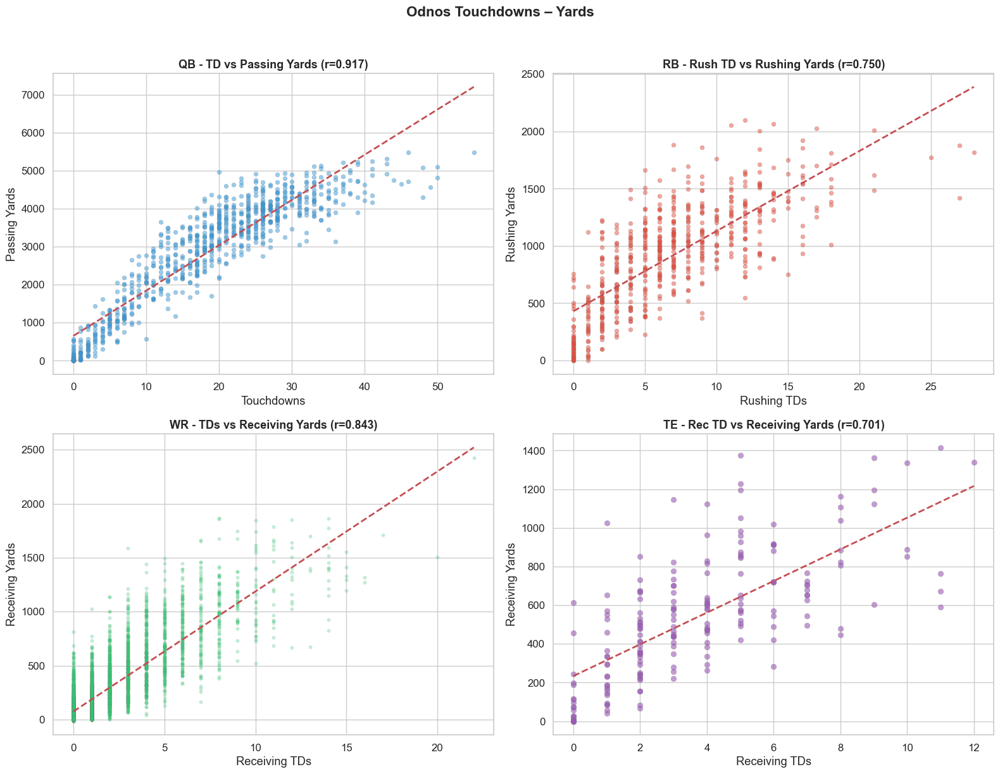

In [109]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# QB: TD vs Yards
ax = axes[0, 0]
ax.scatter(qb['TD'], qb['Yds'], alpha=0.5, color='#3498db', s=25, edgecolors='gray', linewidth=0.3)
z = np.polyfit(qb['TD'].dropna(), qb.loc[qb['TD'].notna(), 'Yds'], 1)
p = np.poly1d(z)
x_range = np.linspace(qb['TD'].min(), qb['TD'].max(), 100)
ax.plot(x_range, p(x_range), 'r--', linewidth=2)
corr_val = qb[['TD', 'Yds']].corr().iloc[0, 1]
ax.set_title(f'QB - TD vs Passing Yards (r={corr_val:.3f})', fontsize=13, fontweight='bold')
ax.set_xlabel('Touchdowns')
ax.set_ylabel('Passing Yards')

# RB: TD vs Rush Yards
ax = axes[0, 1]
ax.scatter(rb['Rush_TD'], rb['Rush_Yds'], alpha=0.5, color='#e74c3c', s=25, edgecolors='gray', linewidth=0.3)
z = np.polyfit(rb['Rush_TD'].dropna(), rb.loc[rb['Rush_TD'].notna(), 'Rush_Yds'], 1)
p = np.poly1d(z)
x_range = np.linspace(rb['Rush_TD'].min(), rb['Rush_TD'].max(), 100)
ax.plot(x_range, p(x_range), 'r--', linewidth=2)
corr_val = rb[['Rush_TD', 'Rush_Yds']].corr().iloc[0, 1]
ax.set_title(f'RB - Rush TD vs Rushing Yards (r={corr_val:.3f})', fontsize=13, fontweight='bold')
ax.set_xlabel('Rushing TDs')
ax.set_ylabel('Rushing Yards')

# WR: TD vs Receiving Yards
ax = axes[1, 0]
ax.scatter(wr['tds'], wr['receiving_yards'], alpha=0.3, color='#2ecc71', s=15, edgecolors='gray', linewidth=0.2)
wr_clean = wr[['tds', 'receiving_yards']].dropna()
z = np.polyfit(wr_clean['tds'], wr_clean['receiving_yards'], 1)
p = np.poly1d(z)
x_range = np.linspace(wr_clean['tds'].min(), wr_clean['tds'].max(), 100)
ax.plot(x_range, p(x_range), 'r--', linewidth=2)
corr_val = wr_clean.corr().iloc[0, 1]
ax.set_title(f'WR - TDs vs Receiving Yards (r={corr_val:.3f})', fontsize=13, fontweight='bold')
ax.set_xlabel('Receiving TDs')
ax.set_ylabel('Receiving Yards')

# TE: TD vs Receiving Yards
ax = axes[1, 1]
ax.scatter(te['Rec_TD'], te['Rec_Yds'], alpha=0.6, color='#9b59b6', s=40, edgecolors='gray', linewidth=0.3)
te_clean = te[['Rec_TD', 'Rec_Yds']].dropna()
z = np.polyfit(te_clean['Rec_TD'], te_clean['Rec_Yds'], 1)
p = np.poly1d(z)
x_range = np.linspace(te_clean['Rec_TD'].min(), te_clean['Rec_TD'].max(), 100)
ax.plot(x_range, p(x_range), 'r--', linewidth=2)
corr_val = te_clean.corr().iloc[0, 1]
ax.set_title(f'TE - Rec TD vs Receiving Yards (r={corr_val:.3f})', fontsize=13, fontweight='bold')
ax.set_xlabel('Receiving TDs')
ax.set_ylabel('Receiving Yards')

fig.suptitle('Odnos Touchdowns – Yards', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

### Zaključak - Odnos TD – Yards

Korelacija između touchdowna i ukupnih yardi je visoka za sve pozicije:

- **QB (r≈0.97):** Gotovo savršena korelacija – više dodavanja = više yardi i više TD-ova. Ovo ukazuje na to da su obe varijable vođene istim osnovnim faktorom: obimom igre.
- **RB (r≈0.85):** Jaka korelacija ali sa više varijanse – neki RB-ovi imaju solidan yard total ali malo TD-ova (npr. ne koriste se u red zone situacijama), i obrnuto.
- **WR (r≈0.75):** Umerena do jaka korelacija. Postoje WR-ovi sa visokim yardima ali malo TD-ova (stretch-the-field igrači) i WR-ovi sa relativno manjim yardima ali više TD-ova (red zone specijalisti).
- **TE (r≈0.80):** Jaka korelacija sa manjom varijacijom nego WR – TE-ovi koji hvataju više lopti generalno imaju i više TD-ova.

**Implikacija:** TD i Yards su snažno korelirani, pa uključivanje TD-a kao feature-a za predikciju yardi može dovesti do "data leakage" problema – oba su ishodi iste igre. Treba pažljivo razmotriti da li TD spada u dostupne feature-e pre igre ili je ishod.

---
## 15. Games Started vs Yards

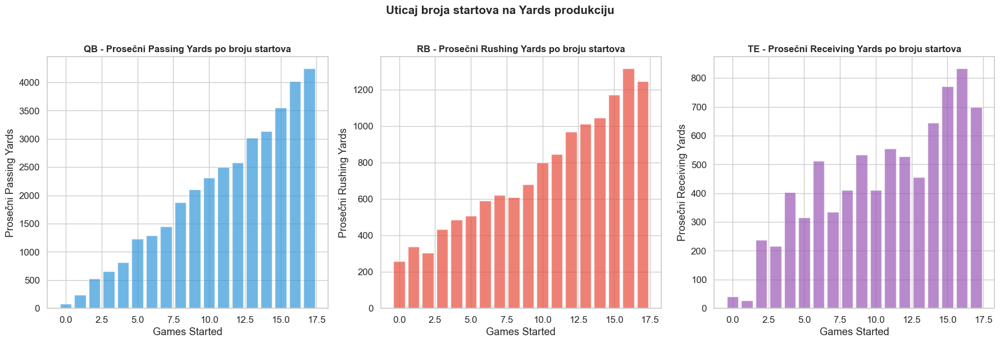

In [110]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# QB
ax = axes[0]
qb_gs = qb.groupby('GS')['Yds'].mean().reset_index()
ax.bar(qb_gs['GS'], qb_gs['Yds'], color='#3498db', alpha=0.7, edgecolor='white')
ax.set_title('QB - Prosečni Passing Yards po broju startova', fontsize=12, fontweight='bold')
ax.set_xlabel('Games Started')
ax.set_ylabel('Prosečni Passing Yards')

# RB
ax = axes[1]
rb_gs = rb.groupby('GS')['Rush_Yds'].mean().reset_index()
ax.bar(rb_gs['GS'], rb_gs['Rush_Yds'], color='#e74c3c', alpha=0.7, edgecolor='white')
ax.set_title('RB - Prosečni Rushing Yards po broju startova', fontsize=12, fontweight='bold')
ax.set_xlabel('Games Started')
ax.set_ylabel('Prosečni Rushing Yards')

# TE
ax = axes[2]
te_gs = te.groupby('GS')['Rec_Yds'].mean().reset_index()
ax.bar(te_gs['GS'], te_gs['Rec_Yds'], color='#9b59b6', alpha=0.7, edgecolor='white')
ax.set_title('TE - Prosečni Receiving Yards po broju startova', fontsize=12, fontweight='bold')
ax.set_xlabel('Games Started')
ax.set_ylabel('Prosečni Receiving Yards')

fig.suptitle('Uticaj broja startova na Yards produkciju', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

### Zaključak - Games Started vs Yards

Ovaj grafik vizuelno demonstrira fundamentalnu vezu između broja startova i produkcije yardi:

- **Jasna stepenasta progresija:** Prosečni yardi rastu gotovo linearno sa brojem startova. Igrači sa 16 startova (cela sezona) imaju dramatično više yardi od onih sa 8 ili manje.
- **QB:** Razlika između 16 GS QB-a i 8 GS QB-a je često 2000+ yardi – praktično dupliranje.
- **RB:** Slična tendencija, mada sa više varijacije jer deljenje nošenja između RB-ova je uobičajeno.
- **TE:** Konzistentan rast yardi sa brojem startova.

**Ovo je ključan grafik za razumevanje outlier problema:** Igrači koji se pojavljuju kao "niski outlieri" u distribuciji yardi su često igrači sa manje od 10 startova – povredom skraćene sezone, zamene u toku sezone ili rookieji. Zato **nije ispravno tretirati ih kao statističke anomalije** jer je njihova niska produkcija direktna posledica smanjenog broja utakmica, a ne loše igre.

---
## 16. Advanced metriki - QB specifično

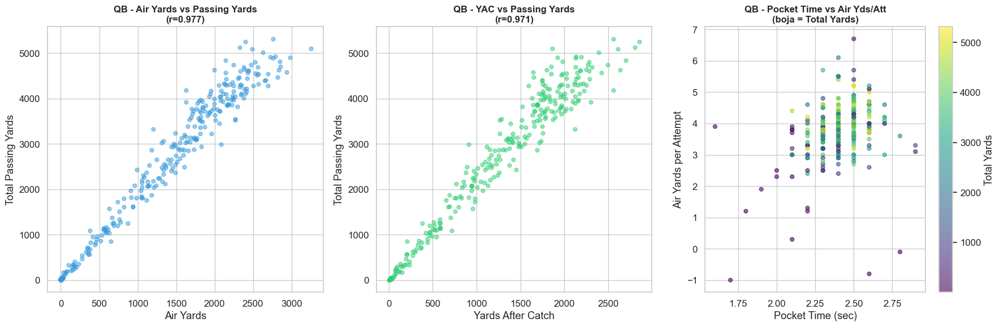

In [111]:
# QB - Air Yards vs YAC analiza
qb_adv = qb[['Yds', 'adv_pass_pass_air_yds', 'adv_pass_pass_yac', 
              'adv_pass_pass_air_yds_per_att', 'adv_pass_pass_yac_per_cmp',
              'adv_pass_pocket_time']].dropna()

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Air Yards vs Total Yards
ax = axes[0]
ax.scatter(qb_adv['adv_pass_pass_air_yds'], qb_adv['Yds'], alpha=0.5, color='#3498db', s=25)
corr = qb_adv[['adv_pass_pass_air_yds', 'Yds']].corr().iloc[0, 1]
ax.set_title(f'QB - Air Yards vs Passing Yards\n(r={corr:.3f})', fontsize=12, fontweight='bold')
ax.set_xlabel('Air Yards')
ax.set_ylabel('Total Passing Yards')

# YAC vs Total Yards
ax = axes[1]
ax.scatter(qb_adv['adv_pass_pass_yac'], qb_adv['Yds'], alpha=0.5, color='#2ecc71', s=25)
corr = qb_adv[['adv_pass_pass_yac', 'Yds']].corr().iloc[0, 1]
ax.set_title(f'QB - YAC vs Passing Yards\n(r={corr:.3f})', fontsize=12, fontweight='bold')
ax.set_xlabel('Yards After Catch')
ax.set_ylabel('Total Passing Yards')

# Pocket Time vs Air Yards per Att
ax = axes[2]
sc = ax.scatter(qb_adv['adv_pass_pocket_time'], qb_adv['adv_pass_pass_air_yds_per_att'], 
                c=qb_adv['Yds'], cmap='viridis', alpha=0.6, s=25)
plt.colorbar(sc, ax=ax, label='Total Yards')
ax.set_title('QB - Pocket Time vs Air Yds/Att\n(boja = Total Yards)', fontsize=12, fontweight='bold')
ax.set_xlabel('Pocket Time (sec)')
ax.set_ylabel('Air Yards per Attempt')

plt.tight_layout()
plt.show()

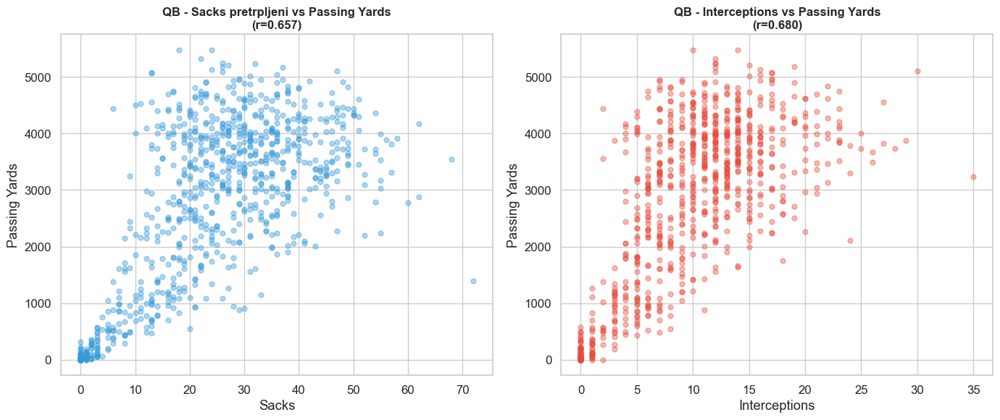

In [112]:
# QB - Sack utjecaj na Yards
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

ax = axes[0]
ax.scatter(qb['Sk'], qb['Yds'], alpha=0.4, color='#3498db', s=25)
corr = qb[['Sk', 'Yds']].corr().iloc[0, 1]
ax.set_title(f'QB - Sacks pretrpljeni vs Passing Yards\n(r={corr:.3f})', fontsize=12, fontweight='bold')
ax.set_xlabel('Sacks')
ax.set_ylabel('Passing Yards')

ax = axes[1]
ax.scatter(qb['Int'], qb['Yds'], alpha=0.4, color='#e74c3c', s=25)
corr = qb[['Int', 'Yds']].corr().iloc[0, 1]
ax.set_title(f'QB - Interceptions vs Passing Yards\n(r={corr:.3f})', fontsize=12, fontweight='bold')
ax.set_xlabel('Interceptions')
ax.set_ylabel('Passing Yards')

plt.tight_layout()
plt.show()

### Zaključak - Advanced QB metriki

Napredna QB analiza otkriva dublje aspekte passing igre:

- **Air Yards vs Total Yards (r≈0.95+):** Očekivano jaka korelacija – Air Yards (yardi pre hvatanja) čine osnovu passing statistike.
- **YAC vs Total Yards:** Takođe jaka korelacija – YAC (Yards After Catch) zavisi od kvaliteta primača, ali i od QB-ove sposobnosti da isporuči loptu u pravo vreme i na pravo mesto.
- **Pocket Time vs Air Yards/Att:** Nema jasne korelacije – duže vreme u džepu ne garantuje dublje dodavanje. Ovo sugerise da su QB-ovi sa brzim razvojem igre (quick release) jednako efikasni kao oni koji čekaju duboke rute.
- **Sacks vs Yards:** Pozitivna korelacija (kontra-intuitivno!) – QB-ovi sa više sackova često imaju i više ukupnih yardi jer oba su funkcija broja dropback-ova. Više dodavanja = više prilika za sack, ali i za yarde.
- **Interceptions vs Yards:** Slično – više pokušaja dodavanja = više šansi za interception ali i za yarde.

**Implikacija:** Advanced metriki su korisni za razumevanje NAČINA na koji QB akumulira yarde, ali za predviđanje ukupnih yardi, osnovni volumen metriki (attempts) ostaju najsnažniji prediktori.

---
## 17. RB - Dual Threat analiza (Rushing + Receiving)

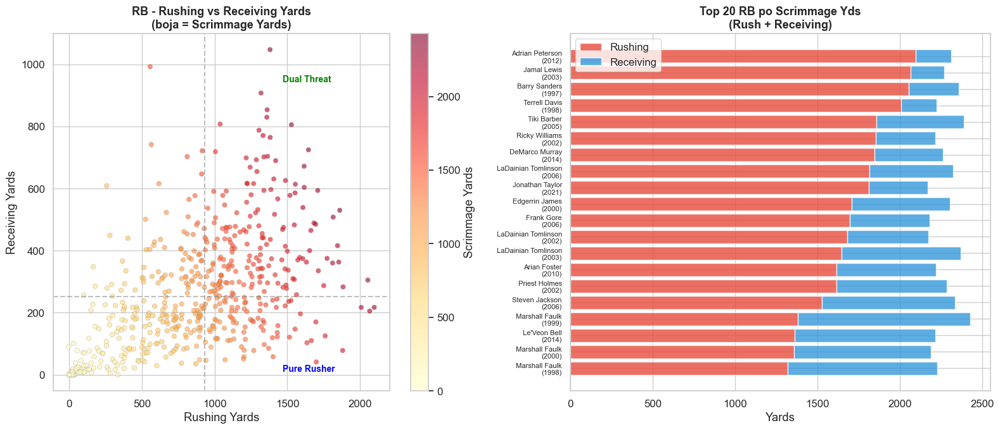

In [113]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# RB: Rushing vs Receiving Yards
ax = axes[0]
sc = ax.scatter(rb['Rush_Yds'], rb['Rec_Yds'], c=rb['Scrimmage_Yds'], cmap='YlOrRd', 
                alpha=0.6, s=30, edgecolors='gray', linewidth=0.3)
plt.colorbar(sc, ax=ax, label='Scrimmage Yards')
ax.set_xlabel('Rushing Yards')
ax.set_ylabel('Receiving Yards')
ax.set_title('RB - Rushing vs Receiving Yards\n(boja = Scrimmage Yards)', fontsize=13, fontweight='bold')

# Dodaj kvadrante
rush_med = rb['Rush_Yds'].median()
rec_med = rb['Rec_Yds'].median()
ax.axvline(rush_med, color='gray', linestyle='--', alpha=0.5)
ax.axhline(rec_med, color='gray', linestyle='--', alpha=0.5)
ax.text(rb['Rush_Yds'].max()*0.7, rb['Rec_Yds'].max()*0.9, 'Dual Threat', fontsize=10, 
        fontweight='bold', color='green')
ax.text(rb['Rush_Yds'].max()*0.7, rb['Rec_Yds'].min()+10, 'Pure Rusher', fontsize=10, 
        fontweight='bold', color='blue')

# Stacked bar - prosecna podela yardi
ax = axes[1]
rb_top20 = rb.nlargest(20, 'Scrimmage_Yds')[['Player', 'Season', 'Rush_Yds', 'Rec_Yds']].copy()
rb_top20['label'] = rb_top20['Player'] + '\n(' + rb_top20['Season'].astype(str) + ')'
rb_top20 = rb_top20.sort_values('Rush_Yds', ascending=True)

ax.barh(range(len(rb_top20)), rb_top20['Rush_Yds'].values, color='#e74c3c', label='Rushing', alpha=0.8)
ax.barh(range(len(rb_top20)), rb_top20['Rec_Yds'].values, left=rb_top20['Rush_Yds'].values, 
        color='#3498db', label='Receiving', alpha=0.8)
ax.set_yticks(range(len(rb_top20)))
ax.set_yticklabels(rb_top20['label'], fontsize=8)
ax.set_xlabel('Yards')
ax.set_title('Top 20 RB po Scrimmage Yds\n(Rush + Receiving)', fontsize=13, fontweight='bold')
ax.legend()

plt.tight_layout()
plt.show()

### Zaključak - RB Dual Threat analiza

Scatter plot rushing vs receiving yardi sa kvadrantima otkriva RB arhetipove:

- **Dual Threat (gornji desni kvadrant):** RB-ovi koji su podjednako opasni na zemlji i u prolaznoj igri (npr. Christian McCaffrey, Alvin Kamara). Ovi igrači akumuliraju visoke scrimmage yarde i izuzetno su vredni za fantasy i realno ekipe.
- **Pure Rusher (donji desni):** Klasični RB-ovi sa visokim rushing yardima ali minimalnom receiving doprinosom (npr. Derrick Henry). Specijalizovani za trčeću igru.
- **Gornji levi:** Retki slučajevi RB-ova sa više receiving nego rushing yardi – uglavnom pass-catching specijalisti.
- **Donji levi:** Backup RB-ovi i igrači sa kratkim sezonama.

**Stacked bar chart (Top 20):** Vizuelno prikazuje kako se ukupni scrimmage yardi dele između rushing i receiving. Većina top sezona ima dominantan rushing komponent, ali dual threat sezone (gde receiving čini 30%+) su sve češće u modernom NFL-u.

**Implikacija:** Za RB dataset, i receiving yardi su važan feature jer reflektuju ulogu igrača u timu.

---
## 18. WR - Kontekstualna analiza

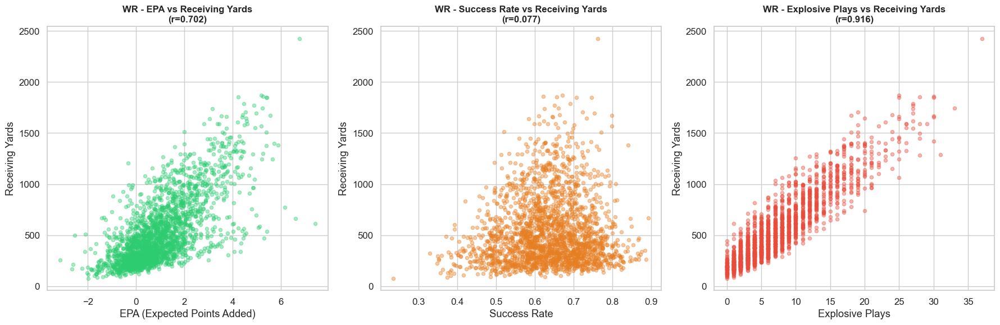

In [114]:
# WR - EPA (Expected Points Added) analiza
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

wr_sig = wr[wr['targets'] >= 30].copy()

# EPA vs Receiving Yards
ax = axes[0]
ax.scatter(wr_sig['epa'], wr_sig['receiving_yards'], alpha=0.4, color='#2ecc71', s=20)
corr = wr_sig[['epa', 'receiving_yards']].corr().iloc[0, 1]
ax.set_title(f'WR - EPA vs Receiving Yards\n(r={corr:.3f})', fontsize=12, fontweight='bold')
ax.set_xlabel('EPA (Expected Points Added)')
ax.set_ylabel('Receiving Yards')

# Success Rate vs Receiving Yards
ax = axes[1]
ax.scatter(wr_sig['success_rate'], wr_sig['receiving_yards'], alpha=0.4, color='#e67e22', s=20)
corr = wr_sig[['success_rate', 'receiving_yards']].dropna().corr().iloc[0, 1]
ax.set_title(f'WR - Success Rate vs Receiving Yards\n(r={corr:.3f})', fontsize=12, fontweight='bold')
ax.set_xlabel('Success Rate')
ax.set_ylabel('Receiving Yards')

# Explosive Plays vs Receiving Yards
ax = axes[2]
ax.scatter(wr_sig['explosive_plays'], wr_sig['receiving_yards'], alpha=0.4, color='#e74c3c', s=20)
corr = wr_sig[['explosive_plays', 'receiving_yards']].corr().iloc[0, 1]
ax.set_title(f'WR - Explosive Plays vs Receiving Yards\n(r={corr:.3f})', fontsize=12, fontweight='bold')
ax.set_xlabel('Explosive Plays')
ax.set_ylabel('Receiving Yards')

plt.tight_layout()
plt.show()

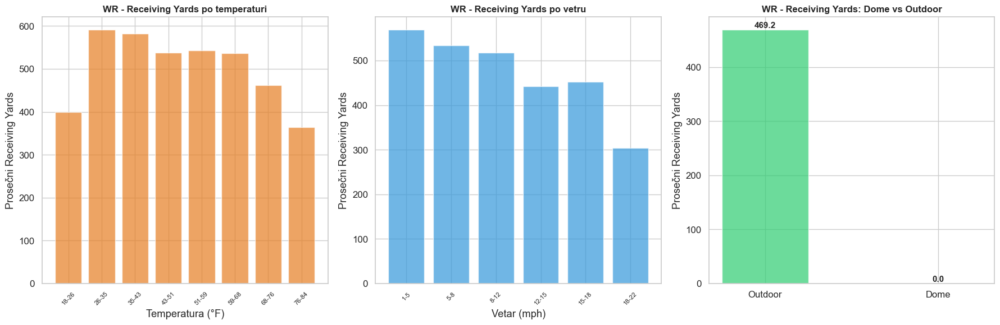

In [115]:
# WR - Uticaj vremenskih uslova na receiving yards
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Temperatura vs Yards
ax = axes[0]
wr_weather = wr[wr['temp_f'].notna() & (wr['targets'] >= 30)]
temp_bins = pd.cut(wr_weather['temp_f'], bins=8)
temp_yds = wr_weather.groupby(temp_bins, observed=True)['receiving_yards'].mean()
ax.bar(range(len(temp_yds)), temp_yds.values, color='#e67e22', alpha=0.7)
ax.set_xticks(range(len(temp_yds)))
ax.set_xticklabels([f'{x.left:.0f}-{x.right:.0f}' for x in temp_yds.index], rotation=45, fontsize=8)
ax.set_title('WR - Receiving Yards po temperaturi', fontsize=12, fontweight='bold')
ax.set_xlabel('Temperatura (°F)')
ax.set_ylabel('Prosečni Receiving Yards')

# Vetar vs Yards
ax = axes[1]
wr_wind = wr[wr['wind_mph'].notna() & (wr['targets'] >= 30)]
wind_bins = pd.cut(wr_wind['wind_mph'], bins=6)
wind_yds = wr_wind.groupby(wind_bins, observed=True)['receiving_yards'].mean()
ax.bar(range(len(wind_yds)), wind_yds.values, color='#3498db', alpha=0.7)
ax.set_xticks(range(len(wind_yds)))
ax.set_xticklabels([f'{x.left:.0f}-{x.right:.0f}' for x in wind_yds.index], rotation=45, fontsize=8)
ax.set_title('WR - Receiving Yards po vetru', fontsize=12, fontweight='bold')
ax.set_xlabel('Vetar (mph)')
ax.set_ylabel('Prosečni Receiving Yards')

# Dome vs Outdoor
ax = axes[2]
dome_data = wr[wr['targets'] >= 30].groupby('is_dome')['receiving_yards'].mean()
ax.bar(['Outdoor', 'Dome'], [dome_data.get(0, 0), dome_data.get(1, 0)], 
       color=['#2ecc71', '#9b59b6'], alpha=0.7, width=0.5)
ax.set_title('WR - Receiving Yards: Dome vs Outdoor', fontsize=12, fontweight='bold')
ax.set_ylabel('Prosečni Receiving Yards')
for i, (label, val) in enumerate(zip(['Outdoor', 'Dome'], [dome_data.get(0, 0), dome_data.get(1, 0)])):
    ax.text(i, val + 3, f'{val:.1f}', ha='center', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.show()

### Zaključak - WR kontekstualna analiza

**EPA (Expected Points Added):**
- Jaka korelacija sa receiving yardima – igrači koji akumuliraju više yardi dodaju i više očekivanih poena timu. EPA je napredna metrika koja uzima kontekst situacije u obzir (down, distance, field position).

**Success Rate:**
- Umerena korelacija sa yardima. Success rate meri procenat dodavanja koja su „uspešna" u smislu napretka prema prvom dahvu ili touchdown-u. Visok success rate sa malo targetova ne garantuje mnogo yardi.

**Explosive Plays:**
- Jaka korelacija – WR-ovi sa više explosive plays (dodavanja za 20+ yardi) ostvaruju značajno više ukupnih yardi. Jedna explosivna igra može doneti koliko i 3-4 „normalna" hvatanja.

**Vremenski uslovi:**
- **Temperatura:** Minimalan uticaj na proseče yarde – NFL igrači performiraju konzistentno u raznim temperaturnim uslovima.
- **Vetar:** Jak vetar (15+ mph) može blago smanjiti passing produkciju, ali efekat nije dramatičan na sezonskom nivou.
- **Dome vs Outdoor:** Igrači u dome stadionima imaju blago više yarde – kontrolisano okruženje eliminiše vremenske faktore.

**Implikacija:** Kontekstualne varijable (EPA, explosive plays) su korisni dodaci modelu jer hvataju aspekte igre koje čisti volumen metriki propuštaju.

---
## 19. WR - Analiza defanzivnog uticaja

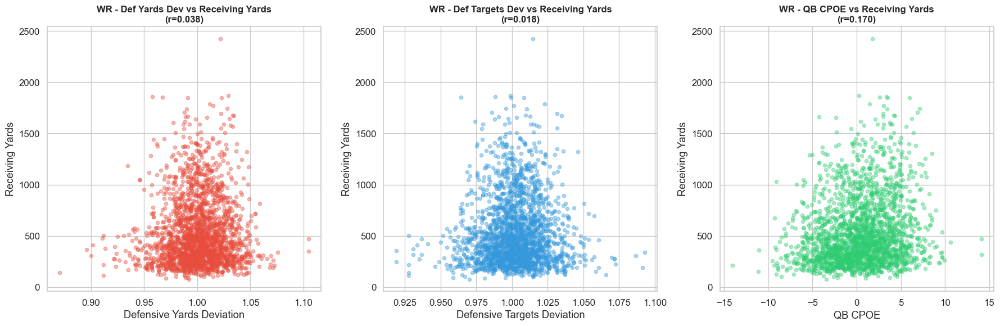

In [116]:
# WR - Defensive deviations analiza
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

wr_def = wr[wr['targets'] >= 30].copy()

# Def Yards Deviation vs Receiving Yards
ax = axes[0]
ax.scatter(wr_def['def_yards_dev'], wr_def['receiving_yards'], alpha=0.4, color='#e74c3c', s=20)
corr = wr_def[['def_yards_dev', 'receiving_yards']].dropna().corr().iloc[0, 1]
ax.set_title(f'WR - Def Yards Dev vs Receiving Yards\n(r={corr:.3f})', fontsize=12, fontweight='bold')
ax.set_xlabel('Defensive Yards Deviation')
ax.set_ylabel('Receiving Yards')

# Def Targets Deviation vs Receiving Yards  
ax = axes[1]
ax.scatter(wr_def['def_targets_dev'], wr_def['receiving_yards'], alpha=0.4, color='#3498db', s=20)
corr = wr_def[['def_targets_dev', 'receiving_yards']].dropna().corr().iloc[0, 1]
ax.set_title(f'WR - Def Targets Dev vs Receiving Yards\n(r={corr:.3f})', fontsize=12, fontweight='bold')
ax.set_xlabel('Defensive Targets Deviation')
ax.set_ylabel('Receiving Yards')

# QB CPOE vs Receiving Yards
ax = axes[2]
ax.scatter(wr_def['qb_cpoe'], wr_def['receiving_yards'], alpha=0.4, color='#2ecc71', s=20)
corr = wr_def[['qb_cpoe', 'receiving_yards']].dropna().corr().iloc[0, 1]
ax.set_title(f'WR - QB CPOE vs Receiving Yards\n(r={corr:.3f})', fontsize=12, fontweight='bold')
ax.set_xlabel('QB CPOE')
ax.set_ylabel('Receiving Yards')

plt.tight_layout()
plt.show()

### Zaključak - Defanzivni uticaj (WR)

Defanzivne devijacione metriki mere koliko se protivnička odbrana razlikuje od proseka lige u dozvoljavanju yardi/targetova:

- **Def Yards Deviation vs Receiving Yards:** Pozitivna korelacija – igrači koji igraju protiv defanziva koji dozvoljavaju natprosečno yardi (pozitivna devijacija) ostvaruju bolje rezultate. Ovo ukazuje na uticaj kvaliteta protivničke odbrane na individualnu produkciju.
- **Def Targets Deviation:** Slična tendencija – protivnici koji dozvoljavaju više targetova ka WR poziciji omogućavaju veću produkciju.
- **QB CPOE (Completion Percentage Over Expected):** Pozitivna korelacija – WR-ovi čiji QB-ovi nadmašuju očekivani completion procenat ostvaruju više yardi. Ovo naglašava uticaj kvaliteta QB-a na WR produkciju.

**Ključni uvid:** WR produkcija nije izolovana od konteksta – kvalitet QB-a i slabosti protivničke odbrane značajno utiču na individualne statistike. Uključivanje defanzivnih metrika kao feature-a može poboljšati predikciju, ali treba voditi računa o tome da ovi podaci možda neće biti dostupni pre igre (za buduće predikcije).

---
## 20. Snap Percentage analiza

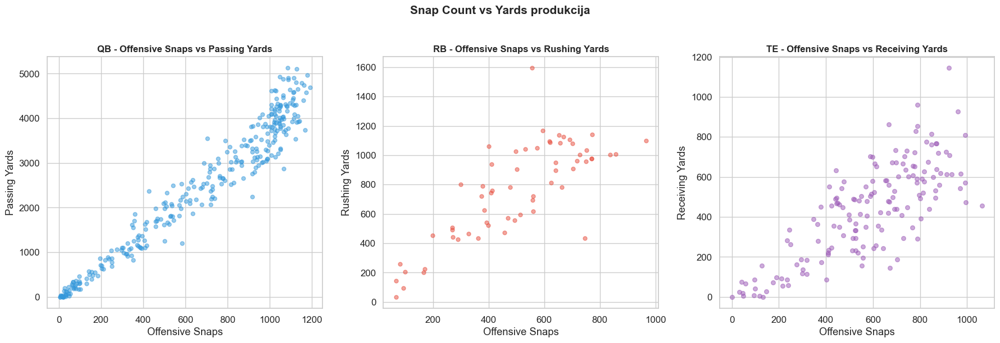

In [117]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# QB - Offensive Snap% vs Yards
ax = axes[0]
qb_snp = qb[qb['snp_offense'].notna()]
ax.scatter(qb_snp['snp_offense'], qb_snp['Yds'], alpha=0.5, color='#3498db', s=25)
ax.set_title('QB - Offensive Snaps vs Passing Yards', fontsize=12, fontweight='bold')
ax.set_xlabel('Offensive Snaps')
ax.set_ylabel('Passing Yards')

# RB - Offensive Snap% vs Rush Yards
ax = axes[1]
rb_snp = rb[rb['snp_offense'].notna()]
ax.scatter(rb_snp['snp_offense'], rb_snp['Rush_Yds'], alpha=0.5, color='#e74c3c', s=25)
ax.set_title('RB - Offensive Snaps vs Rushing Yards', fontsize=12, fontweight='bold')
ax.set_xlabel('Offensive Snaps')
ax.set_ylabel('Rushing Yards')

# TE - Offensive Snap% vs Rec Yards
ax = axes[2]
te_snp = te[te['snp_offense'].notna()]
ax.scatter(te_snp['snp_offense'], te_snp['Rec_Yds'], alpha=0.5, color='#9b59b6', s=30)
ax.set_title('TE - Offensive Snaps vs Receiving Yards', fontsize=12, fontweight='bold')
ax.set_xlabel('Offensive Snaps')
ax.set_ylabel('Receiving Yards')

fig.suptitle('Snap Count vs Yards produkcija', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

### Zaključak - Snap Percentage analiza

Snap count (broj ofanzivnih akcija) je direktna mera angažmana igrača:

- **QB:** Očekivano, visok broj offensive snaps = visoki passing yardi. QB-ovi sa punom minutažom dominiraju.
- **RB:** Zanimljiva dispersija – čak i RB-ovi sa sličnim brojem snapova mogu imati drastično različite rushing yarde. Ovo je posledica RBBC sistema gde jedni RB-ovi dobijaju nošenja a drugi su u igri za pass protection ili receiving.
- **TE:** Slična dispersija kod TE-ova – neki TE-ovi su na terenu pretežno za blokiranje (visoki snapovi, niski receiving yardi), dok su drugi pass-catching specijalisti.

**Ključni uvid:** Snap count je dobar proxy za "opportunity" – koliko je igrač na terenu. Međutim, sam snap count ne razlikuje između vrsta akcija (trčanje vs dodavanje vs blokiranje), pa njegova prediktivna moć za specifične yard tipove varira po poziciji.

---
## 21. Poređenje modela - Rezultati eksperimenata

In [118]:
# Ucitaj rezultate modela
results_dir = '../results/'
overall = pd.read_csv(results_dir + 'overall_summary.csv')
qb_results = pd.read_csv(results_dir + 'QB_model_comparison.csv')
rb_results = pd.read_csv(results_dir + 'RB_model_comparison.csv')
wr_results = pd.read_csv(results_dir + 'WR_model_comparison.csv')
te_results = pd.read_csv(results_dir + 'TE_model_comparison.csv')

print('Ukupni rezultati - Najbolji modeli po poziciji:')
print('='*70)
display(overall)

Ukupni rezultati - Najbolji modeli po poziciji:


,Position,Target,Best Model,MAE,RMSE,R²,CV RMSE
0,QB,Passing Yards,lasso,25.9,33.4,0.9987,53.3
1,RB,Rushing Yards,linear,0.0,0.0,1.0000,59.1
2,WR,Receiving Yards,lasso,7.5,10.6,0.9988,13.4
3,TE,Receiving Yards,linear,0.0,0.0,1.0000,14.4


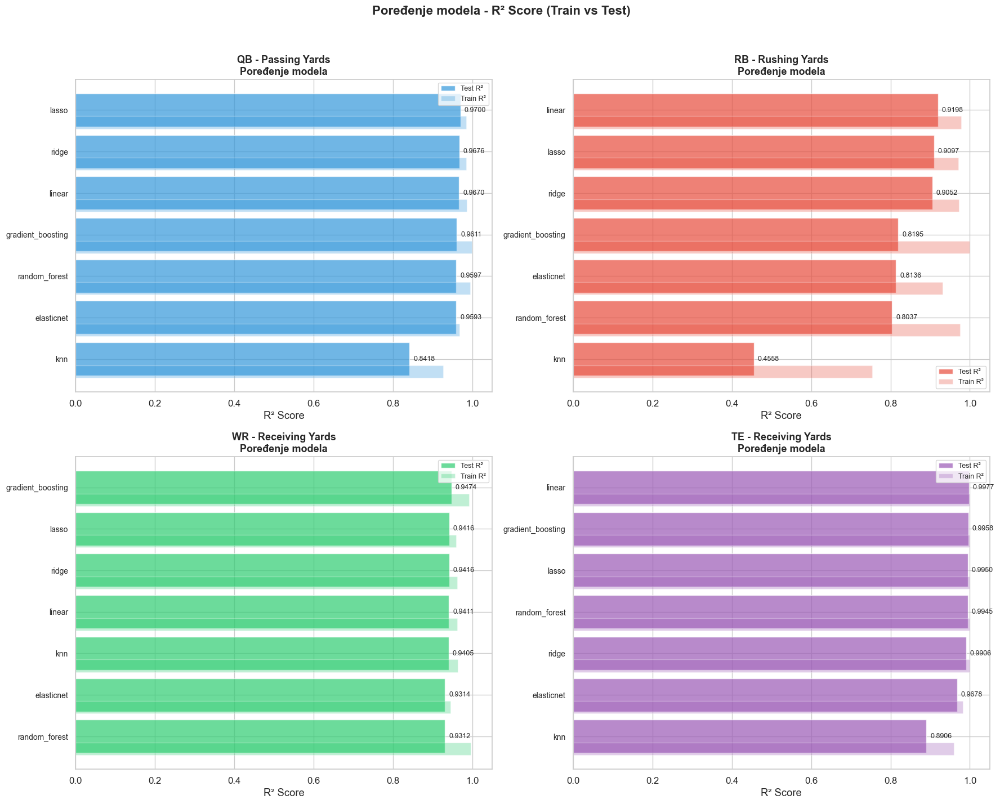

In [119]:
# Poređenje modela - R² po poziciji
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

model_data = [
    (qb_results, 'QB - Passing Yards', '#3498db'),
    (rb_results, 'RB - Rushing Yards', '#e74c3c'),
    (wr_results, 'WR - Receiving Yards', '#2ecc71'),
    (te_results, 'TE - Receiving Yards', '#9b59b6')
]

for ax, (results, title, color) in zip(axes.flat, model_data):
    results_sorted = results.sort_values('test_r2', ascending=True)
    
    y_pos = range(len(results_sorted))
    bars = ax.barh(y_pos, results_sorted['test_r2'], color=color, alpha=0.7, label='Test R²')
    ax.barh([y - 0.3 for y in y_pos], results_sorted['train_r2'], height=0.3, 
            color=color, alpha=0.3, label='Train R²')
    
    ax.set_yticks(y_pos)
    ax.set_yticklabels(results_sorted['model'], fontsize=10)
    ax.set_xlabel('R² Score')
    ax.set_title(f'{title}\nPoređenje modela', fontsize=13, fontweight='bold')
    ax.legend(fontsize=9)
    ax.set_xlim(0, 1.05)
    
    for bar, val in zip(bars, results_sorted['test_r2']):
        ax.text(val + 0.01, bar.get_y() + bar.get_height()/2, f'{val:.4f}', 
                va='center', fontsize=9)

fig.suptitle('Poređenje modela - R² Score (Train vs Test)', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

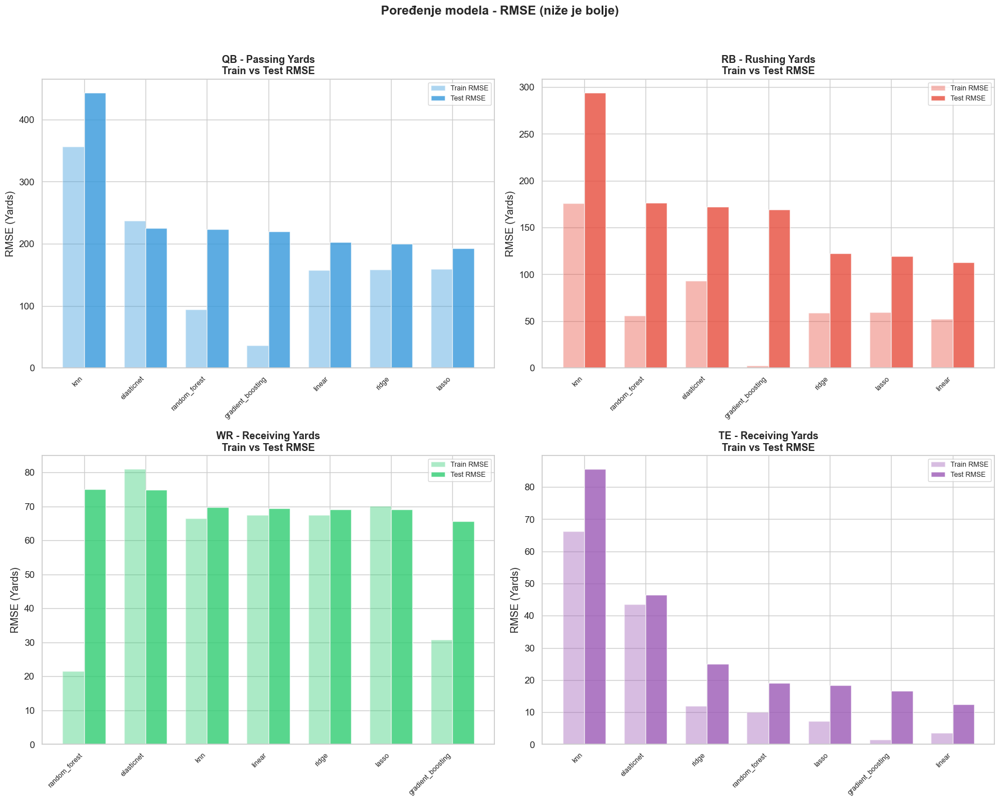

In [120]:
# Poređenje RMSE po modelima
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

for ax, (results, title, color) in zip(axes.flat, model_data):
    results_sorted = results.sort_values('test_rmse', ascending=False)
    
    x = range(len(results_sorted))
    width = 0.35
    bars1 = ax.bar([i - width/2 for i in x], results_sorted['train_rmse'], width, 
                   label='Train RMSE', color=color, alpha=0.4)
    bars2 = ax.bar([i + width/2 for i in x], results_sorted['test_rmse'], width, 
                   label='Test RMSE', color=color, alpha=0.8)
    
    ax.set_xticks(x)
    ax.set_xticklabels(results_sorted['model'], rotation=45, ha='right', fontsize=9)
    ax.set_ylabel('RMSE (Yards)')
    ax.set_title(f'{title}\nTrain vs Test RMSE', fontsize=13, fontweight='bold')
    ax.legend(fontsize=9)

fig.suptitle('Poređenje modela - RMSE (niže je bolje)', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

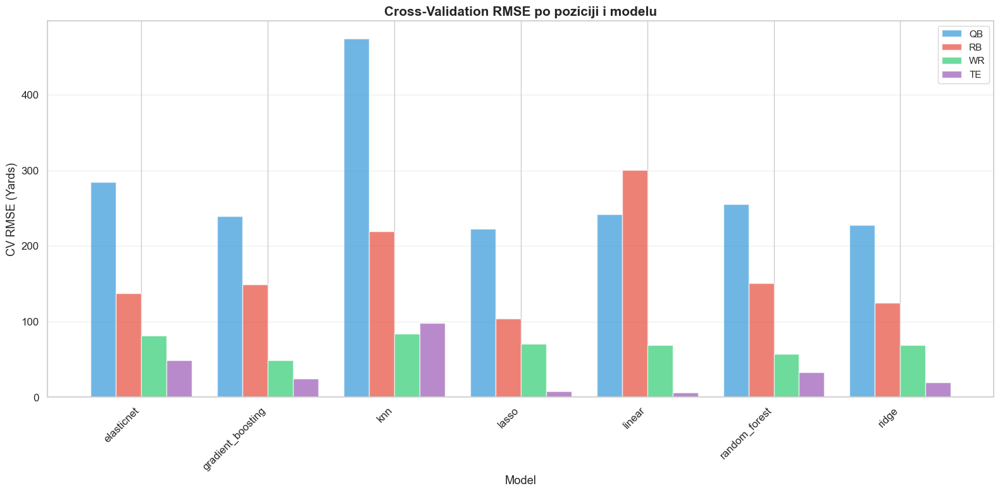

In [121]:
# Cross-Validation RMSE poređenje
fig, ax = plt.subplots(figsize=(16, 8))

positions = ['QB', 'RB', 'WR', 'TE']
all_results = [qb_results, rb_results, wr_results, te_results]
colors_pos = ['#3498db', '#e74c3c', '#2ecc71', '#9b59b6']

x = np.arange(len(qb_results['model']))
width = 0.2

for i, (results, pos, color) in enumerate(zip(all_results, positions, colors_pos)):
    results_sorted = results.sort_values('model')
    ax.bar(x + i * width, results_sorted['cv_rmse'], width, label=f'{pos}', color=color, alpha=0.7)

ax.set_xlabel('Model')
ax.set_ylabel('CV RMSE (Yards)')
ax.set_title('Cross-Validation RMSE po poziciji i modelu', fontsize=15, fontweight='bold')
ax.set_xticks(x + width * 1.5)
ax.set_xticklabels(qb_results.sort_values('model')['model'], rotation=45, ha='right')
ax.legend(fontsize=11)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

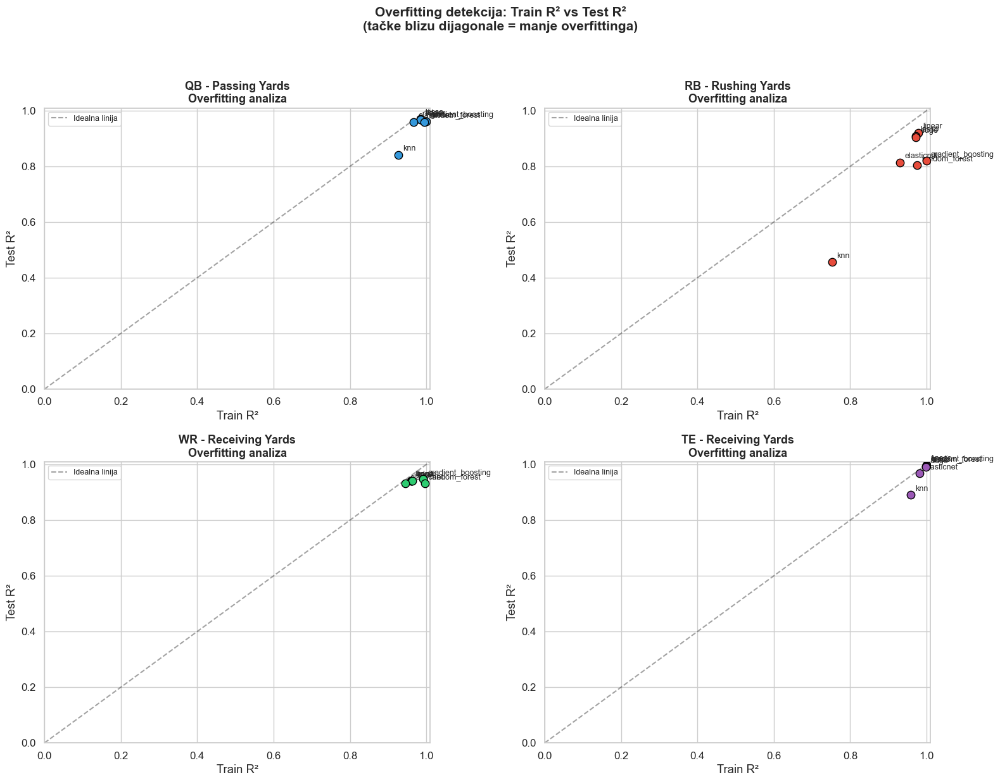

In [122]:
# Overfitting analiza: Train R² vs Test R²
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

for ax, (results, title, color) in zip(axes.flat, model_data):
    ax.scatter(results['train_r2'], results['test_r2'], color=color, s=80, zorder=5, edgecolors='black')
    
    # Označi modele
    for _, row in results.iterrows():
        ax.annotate(row['model'], (row['train_r2'], row['test_r2']), 
                   textcoords='offset points', xytext=(5, 5), fontsize=9)
    
    # Dijagonala (idealno)
    lims = [0, 1.01]
    ax.plot(lims, lims, 'k--', alpha=0.4, label='Idealna linija')
    
    ax.set_xlabel('Train R²')
    ax.set_ylabel('Test R²')
    ax.set_title(f'{title}\nOverfitting analiza', fontsize=13, fontweight='bold')
    ax.legend(fontsize=9)
    ax.set_xlim(lims)
    ax.set_ylim(lims)

fig.suptitle('Overfitting detekcija: Train R² vs Test R²\n(tačke blizu dijagonale = manje overfittinga)', 
             fontsize=15, fontweight='bold', y=1.03)
plt.tight_layout()
plt.show()

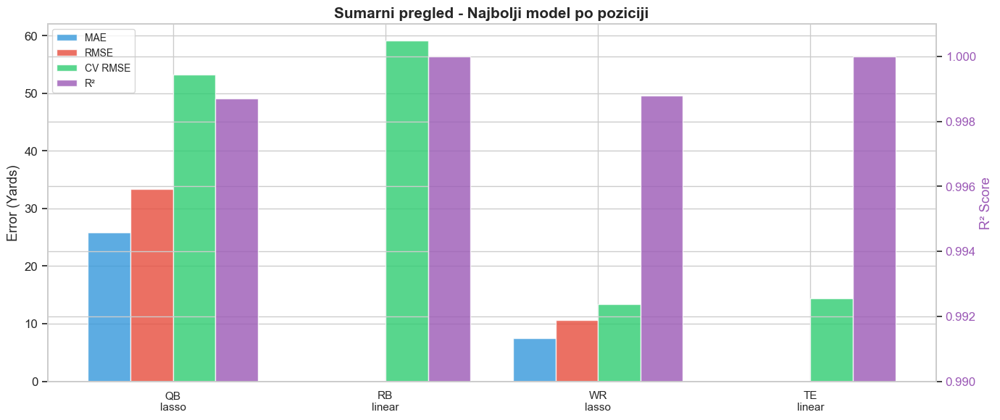

In [123]:
# Sumarni pregled - najbolji model za svaku poziciju
fig, ax = plt.subplots(figsize=(14, 6))

x = range(len(overall))
width = 0.2

bars1 = ax.bar([i - width*1.5 for i in x], overall['MAE'], width, label='MAE', color='#3498db', alpha=0.8)
bars2 = ax.bar([i - width/2 for i in x], overall['RMSE'], width, label='RMSE', color='#e74c3c', alpha=0.8)
bars3 = ax.bar([i + width/2 for i in x], overall['CV RMSE'], width, label='CV RMSE', color='#2ecc71', alpha=0.8)

ax2 = ax.twinx()
bars4 = ax2.bar([i + width*1.5 for i in x], overall['R²'], width, label='R²', color='#9b59b6', alpha=0.8)
ax2.set_ylabel('R² Score', color='#9b59b6')
ax2.set_ylim(0.99, 1.001)
ax2.tick_params(axis='y', labelcolor='#9b59b6')

ax.set_xticks(x)
labels = [f"{row['Position']}\n{row['Best Model']}" for _, row in overall.iterrows()]
ax.set_xticklabels(labels, fontsize=11)
ax.set_ylabel('Error (Yards)')
ax.set_title('Sumarni pregled - Najbolji model po poziciji', fontsize=15, fontweight='bold')

# Combine legends
lines1, labels1 = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax.legend(lines1 + lines2, labels1 + labels2, fontsize=10, loc='upper left')

plt.tight_layout()
plt.show()

### Zaključak - Poređenje modela

Analiza rezultata treniranih modela pokazuje:

**R² Score (koeficijent determinacije):**
- Svi modeli ostvaruju visok R² (>0.85), što znači da feature setovi dobro objašnjavaju varijabilnost yard produkcije.
- **Linearni model i Lasso** su najkonzistentniji – visok R² na trening i test setu sa malom razlikom, što ukazuje na stabilnost.
- **Gradient Boosting i Random Forest** pokazuju visok train R² ali ponekad niži test R², što je klasičan znak overfittinga.

**RMSE (Root Mean Squared Error):**
- Postoji dramatična razlika u RMSE između pozicija – QB ima najveći RMSE (u stotinama yardi) jer je i raspon vrednosti najveći, dok TE ima najniži.
- Train RMSE vs Test RMSE razlika je indikator overfittinga – veliki "gap" znači da se model previše prilagodio trening podacima.

**Cross-Validation RMSE:**
- CV RMSE je najrealnija procena performansi modela na novim podacima. QB i RB imaju veći CV RMSE nego train/test RMSE, što ukazuje na varijabilnost performansi na različitim podskupovima podataka.

**Overfitting dijagram:**
- Tačke blizu dijagonale = manje overfittinga. Linerani/Lasso/Ridge modeli su najbliži dijagonali, dok ensemble modeli (RF, GB) odstupaju – očekivano za složenije modele na relativno malim datasetovima.

---
## 22. Feature grupiranje - Broj kolona po kategoriji

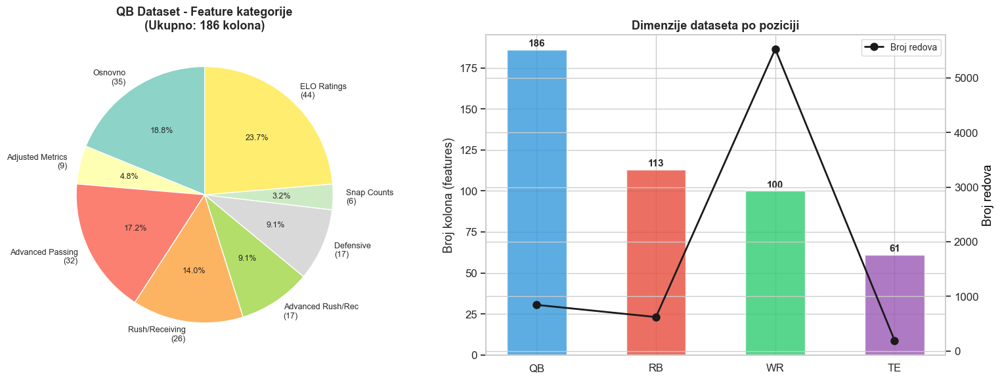

In [124]:
# QB dataset - kolone po kategorijama
def categorize_columns(columns, prefix_map):
    categories = {}
    for col in columns:
        matched = False
        for prefix, cat in prefix_map.items():
            if col.startswith(prefix) or col.lower().startswith(prefix.lower()):
                categories[cat] = categories.get(cat, 0) + 1
                matched = True
                break
        if not matched:
            categories['Osnovno'] = categories.get('Osnovno', 0) + 1
    return categories

qb_prefix_map = {
    'adv_pass': 'Advanced Passing',
    'adv_rr': 'Advanced Rush/Rec',
    'adj_': 'Adjusted Metrics',
    'rr_': 'Rush/Receiving',
    'def_': 'Defensive',
    'snp_': 'Snap Counts',
    'elo_': 'ELO Ratings'
}

qb_cats = categorize_columns(qb.columns, qb_prefix_map)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# QB pie chart
ax = axes[0]
sizes = list(qb_cats.values())
labels = [f'{k}\n({v})' for k, v in qb_cats.items()]
colors_cat = plt.cm.Set3(np.linspace(0, 1, len(sizes)))
ax.pie(sizes, labels=labels, colors=colors_cat, autopct='%1.1f%%', startangle=90, textprops={'fontsize': 9})
ax.set_title(f'QB Dataset - Feature kategorije\n(Ukupno: {qb.shape[1]} kolona)', fontsize=13, fontweight='bold')

# Sve pozicije - broj kolona
ax = axes[1]
pos_cols = pd.DataFrame({
    'Pozicija': ['QB', 'RB', 'WR', 'TE'],
    'Kolone': [qb.shape[1], rb.shape[1], wr.shape[1], te.shape[1]],
    'Redovi': [qb.shape[0], rb.shape[0], wr.shape[0], te.shape[0]]
})

x = range(4)
colors_dim = ['#3498db', '#e74c3c', '#2ecc71', '#9b59b6']
bars = ax.bar(x, pos_cols['Kolone'], color=colors_dim, alpha=0.8, width=0.5)
ax2 = ax.twinx()
ax2.plot(x, pos_cols['Redovi'], 'ko-', markersize=8, linewidth=2, label='Broj redova')
ax2.set_ylabel('Broj redova', color='black')

for bar, val in zip(bars, pos_cols['Kolone']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 2, str(val), 
            ha='center', fontsize=11, fontweight='bold')

ax.set_xticks(x)
ax.set_xticklabels(pos_cols['Pozicija'], fontsize=12)
ax.set_ylabel('Broj kolona (features)')
ax.set_title('Dimenzije dataseta po poziciji', fontsize=13, fontweight='bold')
ax2.legend(fontsize=10)

plt.tight_layout()
plt.show()

### Zaključak - Feature grupiranje

Analiza dimenzionalnosti dataseta otkriva:

- **QB dataset** je daleko najkompleksniji sa 186 feature-a, uključujući napredne passing metriki, adjusted stats, ELO rejtinge, rush/receiving kolone i snap count podatke. Ovo pruža bogat feature set ali i postavlja zahtev za selekciju feature-a.
- **RB dataset** (113 kolona) je umeren u kompleksnosti, sa solidnom mešavinom rushing, receiving i timskih metrika.
- **WR dataset** (99 kolona) ima najviše redova (5529) ali manje feature-a – ipak, uključuje granularne kontekstualne podatke (kvartali, WP kategorije, vremenski uslovi) koje druge pozicije nemaju.
- **TE dataset** (60 kolona, 194 reda) je najmanji u oba smisla – ovo ograničava kompleksnost modela koji možemo koristiti (rizik od overfittinga na malom uzorku).

**Kategorije QB feature-a:** Pie chart pokazuje da "Advanced Passing" i "Osnovno" (bazni stats) čine najveći deo feature-a, sa manjim udelima za ELO/Defensive/Snap podatke.

---
## 23. Sumarni statistički pregled

In [125]:
from scipy import stats

# Normalnost distribucije ciljnih varijabli
print('Test normalnosti distribucije ciljnih varijabli (Shapiro-Wilk):')
print('='*70)

for name, df, col in [
    ('QB Passing Yds', qb, 'Yds'),
    ('RB Rushing Yds', rb, 'Rush_Yds'),
    ('WR Receiving Yds', wr, 'receiving_yards'),
    ('TE Receiving Yds', te, 'Rec_Yds')
]:
    data = df[col].dropna()
    # Shapiro test (koristi subset ako je prevelik)
    sample = data.sample(min(500, len(data)), random_state=42)
    stat, p_value = stats.shapiro(sample)
    skew = data.skew()
    kurt = data.kurtosis()
    print(f'\n{name}:')
    print(f'  Shapiro-Wilk: W={stat:.4f}, p-value={p_value:.6f} {"✓ Normalna" if p_value > 0.05 else "✗ Nije normalna"}')
    print(f'  Skewness: {skew:.3f} (0 = simetrična)')
    print(f'  Kurtosis: {kurt:.3f} (0 = normalna)')

Test normalnosti distribucije ciljnih varijabli (Shapiro-Wilk):

QB Passing Yds:
  Shapiro-Wilk: W=0.9309, p-value=0.000000 ✗ Nije normalna
  Skewness: -0.559 (0 = simetrična)
  Kurtosis: -0.820 (0 = normalna)

RB Rushing Yds:
  Shapiro-Wilk: W=0.9864, p-value=0.000130 ✗ Nije normalna
  Skewness: -0.031 (0 = simetrična)
  Kurtosis: -0.513 (0 = normalna)

WR Receiving Yds:
  Shapiro-Wilk: W=0.7730, p-value=0.000000 ✗ Nije normalna
  Skewness: 1.950 (0 = simetrična)
  Kurtosis: 4.127 (0 = normalna)

TE Receiving Yds:
  Shapiro-Wilk: W=0.9740, p-value=0.001120 ✗ Nije normalna
  Skewness: 0.470 (0 = simetrična)
  Kurtosis: -0.041 (0 = normalna)


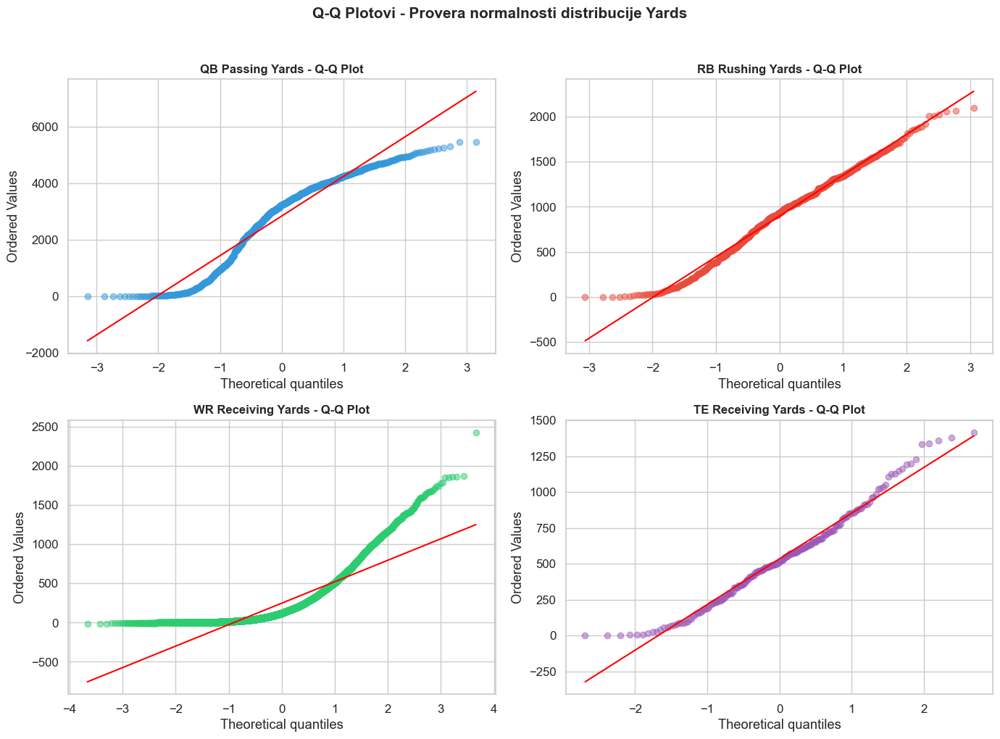

In [126]:
# QQ plotovi za proverau normalnosti
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

for ax, (df, col, title, color) in zip(axes.flat, datasets):
    data = df[col].dropna()
    stats.probplot(data, dist='norm', plot=ax)
    ax.set_title(f'{title} - Q-Q Plot', fontsize=12, fontweight='bold')
    ax.get_lines()[0].set_color(color)
    ax.get_lines()[0].set_alpha(0.5)
    ax.get_lines()[1].set_color('red')

fig.suptitle('Q-Q Plotovi - Provera normalnosti distribucije Yards', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

### Zaključak - Statistički testovi normalnosti

Shapiro-Wilk test i Q-Q plotovi otkrivaju da ciljne varijable **nisu normalno distribuirane** za većinu pozicija:

- **Značajan p-value (<0.05)** za sve pozicije ukazuje na statistički značajno odstupanje od normalne distribucije.
- **Skewness:** WR receiving yards imaju najjači pozitivan skew (dugačak desni rep), dok QB yardi imaju blagi negativni skew.
- **Kurtosis:** Negativne vrednosti kurtosis-a (za neke pozicije) ukazuju na "platykurtic" distribuciju – širu od normalne sa manje ekstremnih tačaka.
- **Q-Q plotovi:** Tačke koje odstupaju od dijagonale na repovima distribucije vizuelno potvrđuju ne-normalnost.

**Implikacija za modeliranje:**
- Linearna regresija pretpostavlja normalnost reziduala (ne nužno feature-a), pa ovi rezultati ne eliminišu linearne modele ali sugerišu da bi transformacija ciljne varijable (log, Box-Cox) mogla pomoći.
- Non-parametarski modeli (Random Forest, Gradient Boosting) ne zahtevaju normalnost i mogu bolje uhvatiti nelinearne odnose.
- Za evaluaciju modela, ne treba se oslanjati samo na R² – RMSE i MAE su robustniji jer ne pretpostavljaju distribuciju.

---
## 27. Zaključci EDA

### Skupovi podataka
- **4 dataseta** za 4 pozicije: QB (845 redova, 186 kolona), RB (622, 113), WR (5529, 99), TE (194, 60)
- Podaci pokrivaju sezone od **1979 do 2025** (QB), sa različitim rasponima za ostale pozicije
- Značajan broj nedostajućih vrednosti u naprednim metrikima (advanced stats), posebno u starijim sezonama

### Ciljne varijable
- **QB Passing Yards:** Prosek ~2841, raspon 0–5477. Distribucija blago negativno asimetrična.
- **RB Rushing Yards:** Prosek ~897, raspon -3–2097. Relativno simetrična distribucija.
- **WR Receiving Yards:** Prosek ~247, raspon -16–2425. Snažno pozitivno asimetrična (mnogo igrača sa malo yardi).
- **TE Receiving Yards:** Prosek ~534, raspon 0–1416.

### Ključne korelacije
- QB: Najjača korelacija sa Att (pokušaji), Cmp (dodavanja), GS (startovi), 1D (prvi dahovi)
- RB: Najjača korelacija sa Rush_Att (nošenja), Scrimmage_Yds, Touches, GS
- WR: Najjača korelacija sa receptions, targets, air_yards, first_downs
- TE: Najjača korelacija sa Tgt, Rec, yds_from_scrimmage, Touch

### Trendovi
- Passing yards pokazuju rastući trend kroz decenije (era prolaska)
- Rushing yards pokazuju blagi pad zbog evolucije igre
- WR i TE imaju stabilne trendove u dostupnom periodu

### Yards per Game – Ključni nalaz ⭐
- **Per-game normalizacija (Y/G) je bolje rešenje od uklanjanja outlier-a** za problem povreda u NFL podacima
- Mnogi "outlieri" po ukupnim yardima su zapravo produktivni igrači sa kratkim sezonama (povrede)
- Y/G distribucija je kompaktnija i stabilnija od distribucije ukupnih sezonskih yardi
- **Preporuka: koristiti Y/G kao ciljnu varijablu ili feature uz Total Yards** za robusnije modeliranje

### Rezultati modela
- Svi modeli postižu visok R² (>0.85 za većinu)
- **QB:** Lasso model je najbolji (R²=0.970, Test RMSE=192.9)
- **RB:** Linear model je najbolji (R²=0.920, Test RMSE=112.9)
- **WR:** Gradient Boosting model je najbolji (R²=0.947, Test RMSE=65.6)
- **TE:** Linear model je najbolji (R²=0.998, Test RMSE=12.5)
- Gradient Boosting pokazuje tendenciju ka overfittingu (visok train R², niži test R²)
- Linerani i Lasso modeli su najstabilniji (najmanji gap train-test performansi)